In [1]:
%pip install pandas==2.1.1
%pip install scorecardpy==0.1.9.7
%pip install seaborn==0.13.0

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model, metrics
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report

# For scorecard construction
import warnings
import scorecardpy as sc
import pprint

/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


# Step 1: Data Exploration

In [3]:
#View Application Data

appData = pd.read_csv("IS453 Group Assignment - Application Data.csv")
appData.head()
appData.info(max_cols=200, show_counts=False)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 120 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE            object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT                    float64
 9    AMT_ANNUITY                   float64
 10   AMT_GOODS_PRICE               float64
 11   NAME_TYPE_SUITE               object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   DA

In [4]:
#View Bureau Data
bureauData = pd.read_csv("IS453 Group Assignment - Bureau Data.csv")
bureauData.head()
bureauData.info(max_cols=200, show_counts=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB


## Variable selection and filtering

In [5]:
# for application data
print("="*80)
print("VARIABLE SELECTION AND FILTERING FOR APPLICATION DATA")
print("="*80)

# Initialize appData_filtered (copy of appData) before Step 0
appData_filtered = appData.copy()
cols_before = len(appData_filtered.columns)

# Step 0: Feature Engineering - Create aggregated features before filtering
print("\n0. FEATURE ENGINEERING - CREATING AGGREGATED FEATURES:")
print("-" * 80)

# Sum credit bureau inquiry columns into a single feature
# These columns represent mutually exclusive time windows, so summing gives total inquiries in past year
credit_bureau_cols = [
    'AMT_REQ_CREDIT_BUREAU_HOUR',
    'AMT_REQ_CREDIT_BUREAU_DAY',
    'AMT_REQ_CREDIT_BUREAU_WEEK',
    'AMT_REQ_CREDIT_BUREAU_MON',
    'AMT_REQ_CREDIT_BUREAU_QRT',
    'AMT_REQ_CREDIT_BUREAU_YEAR'
]

# Check which columns exist
existing_credit_bureau_cols = [col for col in credit_bureau_cols if col in appData_filtered.columns]

if len(existing_credit_bureau_cols) > 0:
    # Create summed feature (total inquiries in past year)
    appData_filtered['TOTAL_CREDIT_BUREAU_INQUIRIES_YEAR'] = 0
    for col in existing_credit_bureau_cols:
        appData_filtered['TOTAL_CREDIT_BUREAU_INQUIRIES_YEAR'] += appData_filtered[col].fillna(0)
    
    print(f"  ✓ Created feature: TOTAL_CREDIT_BUREAU_INQUIRIES_YEAR")
    print(f"    (Total credit bureau inquiries in the past year)")
   
    # Drop individual columns (they're now redundant)
    appData_filtered = appData_filtered.drop(columns=existing_credit_bureau_cols)
    print(f"  ✓ Dropped {len(existing_credit_bureau_cols)} individual credit bureau inquiry columns")
    print(f"    Dropped columns: {', '.join(existing_credit_bureau_cols)}")
    
    # Verify columns were actually dropped
    remaining_cols = [col for col in existing_credit_bureau_cols if col in appData_filtered.columns]
    if remaining_cols:
        print(f"  ⚠ Warning: Some columns were not dropped: {', '.join(remaining_cols)}")
    else:
        print(f"  ✓ Verified: All individual credit bureau columns successfully dropped")
else:
    print("  ⚠ No credit bureau inquiry columns found. Skipping feature engineering.")

# Step 1: Remove variables with only 1 unique value (categorical AND numeric)
print("\n1. DROPPING VARIABLES WITH NO VARIATION (1 unique value):")
print("-" * 80)

# NOTE: Binary columns (2 unique values like 0/1, Y/N) are SAFE - they won't be dropped
# Only columns with exactly 1 unique value will be dropped
single_value_cols = []
for col in appData_filtered.columns:
    if col in ['TARGET', 'SK_ID_CURR']:  # Skip ID and target columns
        continue
    
    # Only drop if column has exactly 1 unique value
    if appData_filtered[col].nunique(dropna=False) == 1:  # Check including NaN
        single_value_cols.append(col)
        unique_val = appData_filtered[col].dropna().unique()[0] if appData_filtered[col].dropna().nunique() > 0 else "all NaN"
        print(f"  Dropping: {col} (only 1 unique value: {unique_val})")

appData_filtered = appData_filtered.drop(columns=single_value_cols)
print(f"  Columns dropped: {len(single_value_cols)}")
print(f"  Remaining columns: {len(appData_filtered.columns)}")


# Step 2: Drop variables with more than 50% missing data
print("\n2. DROPPING VARIABLES WITH >50% MISSING DATA:")
print("-" * 80)

total_rows = len(appData_filtered)
missing_threshold = 0.50

high_missing_cols = []
for col in appData_filtered.columns:
    missing_count = appData_filtered[col].isnull().sum()
    missing_pct = missing_count / total_rows
    
    if missing_pct > missing_threshold:
        high_missing_cols.append(col)
        print(f"  Dropping: {col} ({missing_pct*100:.2f}% missing - {missing_count:,} out of {total_rows:,})")

appData_filtered = appData_filtered.drop(columns=high_missing_cols)
print(f"  Columns dropped: {len(high_missing_cols)}")
print(f"  Remaining columns: {len(appData_filtered.columns)}")

# Step 3: Drop variables with no variation between Goods and Bads
print("\n3. DROPPING VARIABLES WITH NO VARIATION BETWEEN GOODS AND BADS:")
print("-" * 80)

no_variation_cols = []
for col in appData_filtered.columns:
    if col == 'TARGET' or col == 'SK_ID_CURR':
        continue
    
    # Skip if column only has NaN values
    if appData_filtered[col].isnull().all():
        continue
    
    try:
        goods = appData_filtered[appData_filtered['TARGET'] == 0][col].dropna()
        bads = appData_filtered[appData_filtered['TARGET'] == 1][col].dropna()
        
        # Skip if either group has no data
        if len(goods) == 0 or len(bads) == 0:
            continue
        
        # For categorical variables: compare normalized distributions
        if appData_filtered[col].dtype == 'object' or appData_filtered[col].dtype.name == 'category':
            goods_dist = goods.value_counts(normalize=True)
            bads_dist = bads.value_counts(normalize=True)
            
            # Get union of all categories
            all_categories = goods_dist.index.union(bads_dist.index)
            
            # Reindex both distributions to have same categories, fill missing with 0
            goods_dist_aligned = goods_dist.reindex(all_categories, fill_value=0)
            bads_dist_aligned = bads_dist.reindex(all_categories, fill_value=0)
            
            # Check if distributions are identical (within small tolerance)
            if goods_dist_aligned.equals(bads_dist_aligned):
                no_variation_cols.append(col)
                print(f"  Dropping: {col} (identical distribution for goods and bads)")
        
        # For numeric variables: check if means are very similar and std devs are similar
        else:
            # Special handling for binary variables (variables with only 2 unique values)
            unique_values = pd.concat([goods, bads]).unique()
            if len(unique_values) == 2:
                # For binary variables, compare proportions of each value
                goods_prop_0 = (goods == unique_values[0]).sum() / len(goods) if len(goods) > 0 else 0
                goods_prop_1 = (goods == unique_values[1]).sum() / len(goods) if len(goods) > 0 else 0
                bads_prop_0 = (bads == unique_values[0]).sum() / len(bads) if len(bads) > 0 else 0
                bads_prop_1 = (bads == unique_values[1]).sum() / len(bads) if len(bads) > 0 else 0
                
                # Check if proportions are very similar (within 1% difference)
                prop_diff_0 = abs(goods_prop_0 - bads_prop_0) * 100
                prop_diff_1 = abs(goods_prop_1 - bads_prop_1) * 100
                
                # If proportions are very similar (within 1% difference), drop
                if prop_diff_0 < 1.0 and prop_diff_1 < 1.0:
                    no_variation_cols.append(col)
                    print(f"  Dropping: {col} (binary variable with almost identical proportions: goods={goods_prop_1:.2%}, bads={bads_prop_1:.2%})")
            else:
                # For non-binary numeric variables, check means and stds
                goods_mean = goods.mean()
                bads_mean = bads.mean()
                goods_std = goods.std()
                bads_std = bads.std()
                
                # If both means and stds are very close, consider dropping
                # Use relative difference threshold (1% for mean, 5% for std)
                mean_diff_pct = abs(goods_mean - bads_mean) / (abs(goods_mean) + 1e-10) * 100
                std_diff_pct = abs(goods_std - bads_std) / (abs(goods_std) + 1e-10) * 100 if goods_std > 0 else 0
                
                # Also check if both have very low variance (constant-like)
                if (mean_diff_pct < 1.0 and std_diff_pct < 5.0) or (goods_std < 1e-6 and bads_std < 1e-6):
                    no_variation_cols.append(col)
                    print(f"  Dropping: {col} (no meaningful difference between goods and bads)")
    
    except Exception as e:
        # Skip columns that cause errors
        pass

appData_filtered = appData_filtered.drop(columns=no_variation_cols)
print(f"  Columns dropped: {len(no_variation_cols)}")
print(f"  Remaining columns: {len(appData_filtered.columns)}")

# Step 4: Drop gender for fairness
print("\n4. DROPPING GENDER FOR FAIRNESS:")
print("-" * 80)

gender_cols = [col for col in appData_filtered.columns if 'GENDER' in col.upper()]
if gender_cols:
    for col in gender_cols:
        print(f"  Dropping: {col}")
    appData_filtered = appData_filtered.drop(columns=gender_cols)
else:
    print("  No gender columns found")

print(f"  Remaining columns: {len(appData_filtered.columns)}")

# Step 5: Drop columns based on business logic (Skill-Up Loans Context)
print("\n5. DROPPING COLUMNS BASED ON BUSINESS LOGIC (SKILL-UP LOANS):")
print("-" * 80)
print("Note: Dropping columns not relevant for skill-up loans (education/training loans)")
print("      These include housing/building info, redundant contact flags, etc.")

# Define columns to drop based on business logic
business_logic_cols = []

# 1. Contact/Phone flags - redundant 
contact_flags = ['FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 
                 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL']
for col in contact_flags:
    if col in appData_filtered.columns:
        business_logic_cols.append(col)
        print(f"  Dropping: {col} (redundant contact flag)")

# 2. OWN_CAR_AGE - redundant
if 'OWN_CAR_AGE' in appData_filtered.columns:
    business_logic_cols.append('OWN_CAR_AGE')
    print(f"  Dropping: OWN_CAR_AGE (redundant)")

# 3. DAYS_LAST_PHONE_CHANGE - redundant
if 'DAYS_LAST_PHONE_CHANGE' in appData_filtered.columns:
    business_logic_cols.append('DAYS_LAST_PHONE_CHANGE')
    print(f"  Dropping: DAYS_LAST_PHONE_CHANGE (redundant)")

# 4. Housing/Building-related columns - NOT RELEVANT FOR SKILL-UP LOANS
housing_base_features = [
    'APARTMENTS', 'BASEMENTAREA', 'YEARS_BEGINEXPLUATATION', 'YEARS_BUILD',
    'COMMONAREA', 'ELEVATORS', 'ENTRANCES', 'FLOORSMAX', 'FLOORSMIN',
    'LANDAREA', 'LIVINGAPARTMENTS', 'LIVINGAREA', 'NONLIVINGAPARTMENTS',
    'NONLIVINGAREA', 'TOTALAREA', 'FONDKAPREMONT', 'HOUSETYPE',
    'WALLSMATERIAL', 'EMERGENCYSTATE'
]

# 5. Drop all housing-related columns (_AVG, _MODE, _MEDI)
for base in housing_base_features:
    for suffix in ['_AVG', '_MODE', '_MEDI']:
        col = f"{base}{suffix}"
        if col in appData_filtered.columns and col not in business_logic_cols:
            business_logic_cols.append(col)
            print(f"  Dropping: {col} (housing/building info - not relevant for skill-up loans)")

# 6. Additional columns - not relevant for skill-up loans
# Asset ownership and demographic indicators
additional_cols_to_drop = [
 
    # Behavioral indicators
    'WEEKDAY_APPR_PROCESS_START',  # Day of week client applied
    'HOUR_APPR_PROCESS_START',  # Hour client applied
    # Address mismatch flags
    'REG_REGION_NOT_LIVE_REGION',  # Permanent vs contact address mismatch (region)
    'REG_REGION_NOT_WORK_REGION',  # Permanent vs work address mismatch (region)
    'LIVE_REGION_NOT_WORK_REGION',  # Contact vs work address mismatch (region)
    'REG_CITY_NOT_LIVE_CITY',  # Permanent vs contact address mismatch (city)
    'REG_CITY_NOT_WORK_CITY',  # Permanent vs work address mismatch (city)
    'LIVE_CITY_NOT_WORK_CITY',  # Contact vs work address mismatch (city)
]

for col in additional_cols_to_drop:
    if col in appData_filtered.columns and col not in business_logic_cols:
        business_logic_cols.append(col)
        print(f"  Dropping: {col} (not relevant for skill-up loans)")

# 7. Family/Regional columns - not relevant for skill-up loans

family_housing_cols = [
    'NAME_FAMILY_STATUS',  # Family status of the client
    'REGION_POPULATION_RELATIVE',  # Normalized population of region
    'NAME_TYPE_SUITE',  # Who was accompanying client when applying for loan
]

for col in family_housing_cols:
    if col in appData_filtered.columns and col not in business_logic_cols:
        business_logic_cols.append(col)
        print(f"  Dropping: {col} (family/housing/regional info - not relevant for skill-up loans)")



# Drop all identified columns
if business_logic_cols:
    appData_filtered = appData_filtered.drop(columns=business_logic_cols)
    print(f"\n  Columns dropped: {len(business_logic_cols)}")
    print(f"  Remaining columns: {len(appData_filtered.columns)}")
else:
    print("  No columns identified for business logic removal")

# Step 6: Filter rows based on age (25-55 years), income (<8000/month), contract type (Cash loans), and income type
print("\n6. FILTERING ROWS BY AGE, INCOME, CONTRACT TYPE, AND INCOME TYPE:")
print("-" * 80)

rows_before = len(appData_filtered)

# Age filtering: 25-55 years inclusive
# DAYS_BIRTH is negative (days before application date)
# Age 25 = -25 * 365 = -9125 days
# Age 55 = -55 * 365 = -20075 days
# Since DAYS_BIRTH is negative, we need: -20075 <= DAYS_BIRTH <= -9125

age_filter_applied = False
if 'DAYS_BIRTH' in appData_filtered.columns:
    # Calculate age boundaries
    age_min = 25
    age_max = 65
    days_birth_min = -age_max * 365  # More negative = older
    days_birth_max = -age_min * 365  # Less negative = younger
    
    # Filter rows where age is between 25-55 inclusive
    appData_filtered = appData_filtered[
        (appData_filtered['DAYS_BIRTH'] <= days_birth_max) & 
        (appData_filtered['DAYS_BIRTH'] >= days_birth_min)
    ]
    age_filter_applied = True
    print(f"  ✓ Age filter: {age_min}-{age_max} years (inclusive)")
    print(f"    DAYS_BIRTH range: {days_birth_min:.0f} to {days_birth_max:.0f} days")
else:
    print("  ⚠ Age filter: DAYS_BIRTH column not found. Skipping age filtering.")

# Income filtering: Monthly income < 8000 per month
# AMT_INCOME_TOTAL is annual income, so 8000/month = 96,000/year
income_filter_applied = False
if 'AMT_INCOME_TOTAL' in appData_filtered.columns:
    monthly_income_max = 10000
    annual_income_max = monthly_income_max * 12  # Convert to annual income
    
    # Filter rows where annual income < 96,000 (monthly < 8,000)
    appData_filtered = appData_filtered[
        appData_filtered['AMT_INCOME_TOTAL'] < annual_income_max
    ]
    income_filter_applied = True
    print(f"  ✓ Income filter: Monthly income < {monthly_income_max:,} per month")
    print(f"    Annual income < {annual_income_max:,} per year")
else:
    print("  ⚠ Income filter: AMT_INCOME_TOTAL column not found. Skipping income filtering.")

# Contract type filtering: Only keep 'Cash loans'
contract_type_filter_applied = False
if 'NAME_CONTRACT_TYPE' in appData_filtered.columns:
    contract_type = 'Cash loans'
    
    # Filter rows where NAME_CONTRACT_TYPE = 'Cash loans'
    appData_filtered = appData_filtered[
        appData_filtered['NAME_CONTRACT_TYPE'] == contract_type
    ]
    contract_type_filter_applied = True
    print(f"  ✓ Contract type filter: Only keeping '{contract_type}'")
else:
    print("  ⚠ Contract type filter: NAME_CONTRACT_TYPE column not found. Skipping contract type filtering.")

# Income type filtering: Only keep relevant income types for upskilling loans
income_type_filter_applied = False
if 'NAME_INCOME_TYPE' in appData_filtered.columns:
    # Keep only income types relevant for upskilling loans
    valid_income_types = [
        'Unemployed',
        'Working',
        'Commercial associate',  
        'State servant'
    ]
    
    # Filter rows where NAME_INCOME_TYPE is in the valid list
    appData_filtered = appData_filtered[
        appData_filtered['NAME_INCOME_TYPE'].isin(valid_income_types)
    ]
    income_type_filter_applied = True
    print(f"  ✓ Income type filter: Only keeping {len(valid_income_types)} income types:")
    for income_type in valid_income_types:
        print(f"    - {income_type}")
else:
    print("  ⚠ Income type filter: NAME_INCOME_TYPE column not found. Skipping income type filtering.")

# Summary
rows_after = len(appData_filtered)
rows_dropped = rows_before - rows_after

print(f"\n  Rows before filtering: {rows_before:,}")
print(f"  Rows after filtering: {rows_after:,}")
print(f"  Rows dropped: {rows_dropped:,} ({rows_dropped/rows_before*100:.2f}%)")
print(f"  Remaining columns: {len(appData_filtered.columns)}")

# Final Summary
print("\n" + "="*80)
print("FINAL SUMMARY")
print("="*80)
print(f"\nOriginal columns: {cols_before}")
print(f"Final columns: {len(appData_filtered.columns)}")
print(f"Columns dropped: {cols_before - len(appData_filtered.columns)}")

print(f"\nDropdown breakdown:")
# Initialize variables if they don't exist (for summary purposes)
try:
    _ = id_cols
except NameError:
    id_cols = ['SK_ID_CURR', 'TARGET']

try:
    _ = duplicate_cols
except NameError:
    duplicate_cols = []

print(f"  - ID columns (identified): {len(id_cols)} (not dropped, kept for reference)")
print(f"  - Single value (all types): {len(single_value_cols)}")
print(f"  - Duplicate columns: {len(duplicate_cols)}")
print(f"  - More than 50% missing data: {len(high_missing_cols)}")
print(f"  - No variation (goods vs bads): {len(no_variation_cols)}")
print(f"  - Gender (fairness): {len(gender_cols)}")
print(f"  - Business logic: {len(business_logic_cols)}")

# Add row filtering summary
print(f"\nRow filtering breakdown:")
print(f"  - Age filtering (25-55 years): {'Applied' if age_filter_applied else 'Not applied (DAYS_BIRTH column not found)'}")
print(f"  - Income filtering (<8000/month): {'Applied' if income_filter_applied else 'Not applied (AMT_INCOME_TOTAL column not found)'}")
print(f"  - Contract type filtering (Cash loans): {'Applied' if contract_type_filter_applied else 'Not applied (NAME_CONTRACT_TYPE column not found)'}")
print(f"  - Income type filtering (Unemployed, Working, etc.): {'Applied' if income_type_filter_applied else 'Not applied (NAME_INCOME_TYPE column not found)'}")
print(f"  (See Step 6 for detailed row counts)")

print(f"\nVariable name: appData_filtered")
print(f"Shape: {appData_filtered.shape}")

VARIABLE SELECTION AND FILTERING FOR APPLICATION DATA

0. FEATURE ENGINEERING - CREATING AGGREGATED FEATURES:
--------------------------------------------------------------------------------
  ✓ Created feature: TOTAL_CREDIT_BUREAU_INQUIRIES_YEAR
    (Total credit bureau inquiries in the past year)
  ✓ Dropped 6 individual credit bureau inquiry columns
    Dropped columns: AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR
  ✓ Verified: All individual credit bureau columns successfully dropped

1. DROPPING VARIABLES WITH NO VARIATION (1 unique value):
--------------------------------------------------------------------------------
  Columns dropped: 0
  Remaining columns: 115

2. DROPPING VARIABLES WITH >50% MISSING DATA:
--------------------------------------------------------------------------------
  Dropping: OWN_CAR_AGE (65.99% missing - 202,929 out of 307,511)
  Droppi

DISTRIBUTION ANALYSIS AND OUTLIER DETECTION - APPLICATION DATA

Analyzing 19 numeric features...

--------------------------------------------------------------------------------
OUTLIER DETECTION USING Z-SCORE (|z| > 3):
--------------------------------------------------------------------------------

Found outliers in 15 columns:
                            Column  Outliers  Percentage  Max Z-Score  Min Value  Max Value          Mean           Std
                   FLAG_DOCUMENT_3      5258    8.520913     3.276531        0.0        1.0      0.914791      0.279195
          DEF_30_CNT_SOCIAL_CIRCLE      1533    2.484321    12.621376        0.0        6.0      0.155460      0.463067
          OBS_30_CNT_SOCIAL_CIRCLE      1288    2.087283    12.148559        0.0       30.0      1.488162      2.346932
          OBS_60_CNT_SOCIAL_CIRCLE      1249    2.024082    12.268985        0.0       30.0      1.469930      2.325381
                      CNT_CHILDREN      1220    1.977085    22.972

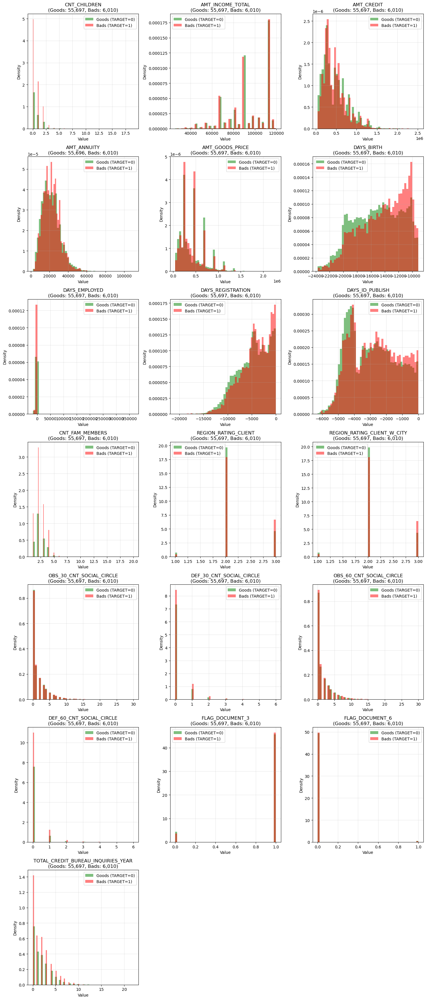


Plotted histograms for 19 key features (showing goods vs bads)

--------------------------------------------------------------------------------
BOXPLOT PLOTS - KEY NUMERIC FEATURES:
--------------------------------------------------------------------------------


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3030250215.py:129: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3030250215.py:129: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3030250215.py:129: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t0000

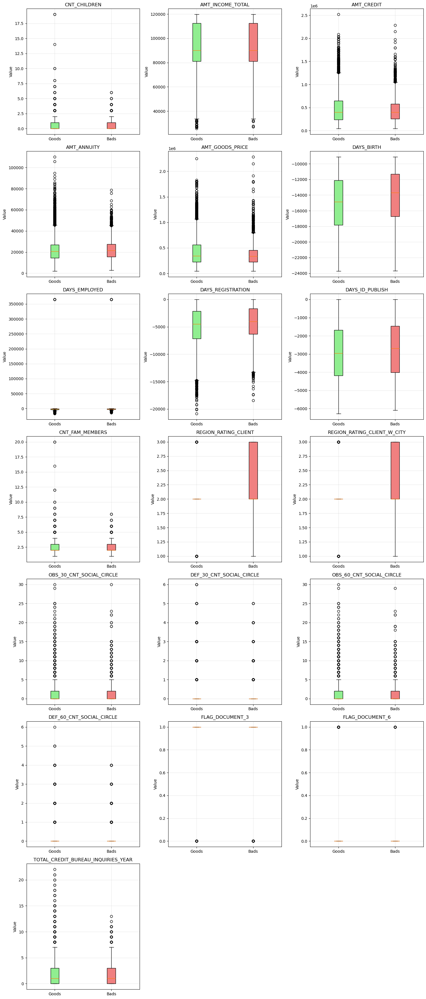


Plotted boxplots for 19 key features (showing goods vs bads)

SUMMARY
Total numeric features analyzed: 19
Features with outliers (|z| > 3): 15

Note: Outliers can be handled by capping/winsorizing before modeling


In [6]:
# Distribution Analysis and Outlier Detection for Application Data
print("="*80)
print("DISTRIBUTION ANALYSIS AND OUTLIER DETECTION - APPLICATION DATA")
print("="*80)

# Get numeric columns (excluding ID and target)
numeric_cols = [col for col in appData_filtered.select_dtypes(include=[np.number]).columns 
                if col not in ['SK_ID_CURR', 'TARGET']]

print(f"\nAnalyzing {len(numeric_cols)} numeric features...")

# Calculate z-scores for outlier detection
print("\n" + "-"*80)
print("OUTLIER DETECTION USING Z-SCORE (|z| > 3):")
print("-"*80)

outlier_summary = []
for col in numeric_cols:
    if appData_filtered[col].isnull().all():
        continue
    
    # Calculate z-scores (only for non-null values)
    values = appData_filtered[col].dropna()
    if len(values) == 0:
        continue
    
    mean = values.mean()
    std = values.std()
    
    if std == 0:  # Skip constant columns
        continue
    
    z_scores = np.abs((values - mean) / std)
    outliers = z_scores > 3
    outlier_count = outliers.sum()
    outlier_pct = (outlier_count / len(values)) * 100
    
    if outlier_count > 0:
        outlier_summary.append({
            'Column': col,
            'Outliers': outlier_count,
            'Percentage': outlier_pct,
            'Max Z-Score': z_scores.max(),
            'Min Value': values.min(),
            'Max Value': values.max(),
            'Mean': mean,
            'Std': std
        })

if outlier_summary:
    outlier_df = pd.DataFrame(outlier_summary)
    outlier_df = outlier_df.sort_values('Outliers', ascending=False)
    print(f"\nFound outliers in {len(outlier_df)} columns:")
    print(outlier_df.to_string(index=False))
else:
    print("No outliers found (|z| > 3) in numeric columns")

# Plot histograms for key numeric features
print("\n" + "-"*80)
print("HISTOGRAM PLOTS - KEY NUMERIC FEATURES:")
print("-"*80)

# Select all numeric features to plot
key_features = numeric_cols  # Plot all numeric features

if key_features:
    n_cols = 3
    n_rows = (len(key_features) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    axes = axes.flatten() if n_rows > 1 else [axes] if n_rows == 1 else axes
    
    for idx, col in enumerate(key_features):
        ax = axes[idx]
        
        # Plot histogram for goods and bads separately
        goods = appData_filtered[appData_filtered['TARGET'] == 0][col].dropna()
        bads = appData_filtered[appData_filtered['TARGET'] == 1][col].dropna()
        
        if len(goods) > 0:
            ax.hist(goods, bins=50, alpha=0.5, label='Goods (TARGET=0)', color='green', density=True)
        if len(bads) > 0:
            ax.hist(bads, bins=50, alpha=0.5, label='Bads (TARGET=1)', color='red', density=True)
        
        ax.set_title(f'{col}\n(Goods: {len(goods):,}, Bads: {len(bads):,})')
        ax.set_xlabel('Value')
        ax.set_ylabel('Density')
        ax.legend()
        ax.grid(True, alpha=0.3)
    
    # Hide unused subplots
    for idx in range(len(key_features), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    print(f"\nPlotted histograms for {len(key_features)} key features (showing goods vs bads)")

# Plot boxplots for key numeric features
print("\n" + "-"*80)
print("BOXPLOT PLOTS - KEY NUMERIC FEATURES:")
print("-"*80)

if key_features:
    n_cols = 3
    n_rows = (len(key_features) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    axes = axes.flatten() if n_rows > 1 else [axes] if n_rows == 1 else axes
    
    for idx, col in enumerate(key_features):
        ax = axes[idx]
        
        # Prepare data for boxplot (goods and bads)
        data_to_plot = []
        labels = []
        
        goods = appData_filtered[appData_filtered['TARGET'] == 0][col].dropna()
        bads = appData_filtered[appData_filtered['TARGET'] == 1][col].dropna()
        
        if len(goods) > 0:
            data_to_plot.append(goods)
            labels.append('Goods')
        if len(bads) > 0:
            data_to_plot.append(bads)
            labels.append('Bads')
        
        if data_to_plot:
            bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True)
            bp['boxes'][0].set_facecolor('lightgreen')
            if len(bp['boxes']) > 1:
                bp['boxes'][1].set_facecolor('lightcoral')
            
            ax.set_title(f'{col}')
            ax.set_ylabel('Value')
            ax.grid(True, alpha=0.3)
    
    # Hide unused subplots
    for idx in range(len(key_features), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    print(f"\nPlotted boxplots for {len(key_features)} key features (showing goods vs bads)")

print("\n" + "="*80)
print("SUMMARY")
print("="*80)
print(f"Total numeric features analyzed: {len(numeric_cols)}")
print(f"Features with outliers (|z| > 3): {len(outlier_summary)}")
print(f"\nNote: Outliers can be handled by capping/winsorizing before modeling")


In [7]:
# Bureau Data Filtering - Part 1: Filter raw bureau data (NO TARGET needed)
print("="*80)
print("VARIABLE SELECTION AND FILTERING FOR RAW BUREAU DATA (Before Aggregation)")
print("="*80)

bureauData_filtered = bureauData.copy()
cols_before = len([col for col in bureauData_filtered.columns if col not in ['SK_ID_CURR', 'SK_ID_BUREAU']])

# Step 1: Remove logically impossible rows in bureau data
bad_mask = False

# 1) Negative debt or limit
for c in ['AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT']:
    if c in bureauData_filtered.columns:
        cond = bureauData_filtered[c] < 0
        dropped = cond.sum()
        if dropped > 0:
            print(f"  Dropping {dropped} rows where {c} is negative")
        bad_mask = cond if isinstance(bad_mask, bool) else (bad_mask | cond)

# 2) Debt greater than total sum
if {'AMT_CREDIT_SUM_DEBT','AMT_CREDIT_SUM'}.issubset(bureauData_filtered.columns):
    cond = bureauData_filtered['AMT_CREDIT_SUM_DEBT'] > bureauData_filtered['AMT_CREDIT_SUM']
    dropped = cond.sum()
    if dropped > 0:
        print(f"  Dropping {dropped} rows where debt > total credit sum")
    bad_mask = cond if isinstance(bad_mask, bool) else (bad_mask | cond)

# 3) Overdue greater than debt
if {'AMT_CREDIT_SUM_OVERDUE','AMT_CREDIT_SUM_DEBT'}.issubset(bureauData_filtered.columns):
    cond = bureauData_filtered['AMT_CREDIT_SUM_OVERDUE'] > bureauData_filtered['AMT_CREDIT_SUM_DEBT']
    dropped = cond.sum()
    if dropped > 0:
        print(f"  Dropping {dropped} rows where overdue > debt")
    bad_mask = cond if isinstance(bad_mask, bool) else (bad_mask | cond)

# Drop the rows
if not isinstance(bad_mask, bool) and bad_mask.any():
    total_drop = bad_mask.sum()
    print(f"  Total rows dropped from all checks: {total_drop}")
    bureauData_filtered = bureauData_filtered.loc[~bad_mask]
else:
    print("  No debt/limit checks applied or no rows to drop (required columns missing)")


# Step 2: Remove variables with only 1 unique value (categorical AND numeric)
print("\n1. DROPPING VARIABLES WITH NO VARIATION (1 unique value):")
print("-" * 80)

# NOTE: Binary columns (2 unique values like 0/1, Y/N) are SAFE - they won't be dropped
# Only columns with exactly 1 unique value will be dropped
single_value_cols = []
for col in bureauData_filtered.columns:
    if col in ['SK_ID_CURR', 'SK_ID_BUREAU']:  # Skip ID columns
        continue
    
    # Only drop if column has exactly 1 unique value
    if bureauData_filtered[col].nunique(dropna=False) == 1:  # Check including NaN
        single_value_cols.append(col)
        unique_val = bureauData_filtered[col].dropna().unique()[0] if bureauData_filtered[col].dropna().nunique() > 0 else "all NaN"
        print(f"  Dropping: {col} (only 1 unique value: {unique_val})")

bureauData_filtered = bureauData_filtered.drop(columns=single_value_cols)
print(f"  Columns dropped: {len(single_value_cols)}")
remaining_cols = len([col for col in bureauData_filtered.columns if col not in ['SK_ID_CURR', 'SK_ID_BUREAU']])
print(f"  Remaining columns: {remaining_cols}")


# Step 3: Drop variables with more than 50% missing data
print("\n2. DROPPING VARIABLES WITH >50% MISSING DATA:")
print("-" * 80)

total_rows = len(bureauData_filtered)
missing_threshold = 0.50

high_missing_cols = []
for col in bureauData_filtered.columns:
    if col in ['SK_ID_CURR', 'SK_ID_BUREAU']:
        continue
    
    missing_count = bureauData_filtered[col].isnull().sum()
    missing_pct = missing_count / total_rows
    
    if missing_pct > missing_threshold:
        high_missing_cols.append(col)
        print(f"  Dropping: {col} ({missing_pct*100:.2f}% missing - {missing_count:,} out of {total_rows:,})")

bureauData_filtered = bureauData_filtered.drop(columns=high_missing_cols)
print(f"  Columns dropped: {len(high_missing_cols)}")
remaining_cols = len([col for col in bureauData_filtered.columns if col not in ['SK_ID_CURR', 'SK_ID_BUREAU']])
print(f"  Remaining columns: {remaining_cols}")

print("\n" + "="*80)
print("PART 1 SUMMARY - RAW BUREAU DATA FILTERING")
print("="*80)
print(f"Original feature columns: {cols_before}")
final_cols_part1 = len([col for col in bureauData_filtered.columns if col not in ['SK_ID_CURR', 'SK_ID_BUREAU']])
print(f"Remaining feature columns: {final_cols_part1}")
print(f"Columns dropped: {cols_before - final_cols_part1}")
print(f"\nVariable name: bureauData_filtered")
print(f"Shape: {bureauData_filtered.shape}")
print("\n" + "="*80)


VARIABLE SELECTION AND FILTERING FOR RAW BUREAU DATA (Before Aggregation)
  Dropping 8418 rows where AMT_CREDIT_SUM_DEBT is negative
  Dropping 351 rows where AMT_CREDIT_SUM_LIMIT is negative
  Dropping 29642 rows where debt > total credit sum
  Dropping 9198 rows where overdue > debt
  Total rows dropped from all checks: 38866

1. DROPPING VARIABLES WITH NO VARIATION (1 unique value):
--------------------------------------------------------------------------------
  Columns dropped: 0
  Remaining columns: 15

2. DROPPING VARIABLES WITH >50% MISSING DATA:
--------------------------------------------------------------------------------
  Dropping: AMT_CREDIT_MAX_OVERDUE (65.43% missing - 1,097,665 out of 1,677,562)
  Dropping: AMT_ANNUITY (71.45% missing - 1,198,557 out of 1,677,562)
  Columns dropped: 2
  Remaining columns: 13

PART 1 SUMMARY - RAW BUREAU DATA FILTERING
Original feature columns: 15
Remaining feature columns: 13
Columns dropped: 2

Variable name: bureauData_filtered
Sha

In [8]:
# Keep only rows with the most common CREDIT_CURRENCY value
print("\n" + "="*80)
print("FILTERING CREDIT_CURRENCY - KEEPING MOST COMMON VALUE")
print("="*80)

col = 'CREDIT_CURRENCY'
rows_before = len(bureauData_filtered)

if col in bureauData_filtered.columns:
    # Get value counts
    value_counts = bureauData_filtered[col].value_counts()
    
    if len(value_counts) > 0:
        # Get the most common value (highest count)
        most_common_value = value_counts.index[0]
        most_common_count = value_counts.iloc[0]
        total_count = value_counts.sum()
        
        print(f"  CREDIT_CURRENCY value counts:")
        for val, count in value_counts.items():
            pct = (count / total_count) * 100
            marker = " ← KEEPING" if val == most_common_value else ""
            print(f"    {val}: {count:,} ({pct:.2f}%){marker}")
        
        print(f"\n  Keeping only: '{most_common_value}' ({most_common_count:,} rows, {most_common_count/total_count*100:.2f}%)")
        
        # Filter to keep only the most common value
        bureauData_filtered = bureauData_filtered[bureauData_filtered[col] == most_common_value]
        
        rows_after = len(bureauData_filtered)
        rows_dropped = rows_before - rows_after
        
        print(f"\n  Rows before: {rows_before:,}")
        print(f"  Rows after: {rows_after:,}")
        print(f"  Rows dropped: {rows_dropped:,} ({rows_dropped/rows_before*100:.2f}%)")
        
        # Drop CREDIT_CURRENCY column since it now has only one unique value (no variation)
        print(f"\n  Dropping '{col}' column (all remaining rows have the same value: '{most_common_value}')")
        bureauData_filtered = bureauData_filtered.drop(columns=[col])
        print(f"  ✓ Column '{col}' dropped successfully")
    else:
        print(f"  ⚠ {col} has no values")
else:
    print(f"  ⚠ Column {col} not found in bureauData_filtered")

print("\n" + "="*80)


FILTERING CREDIT_CURRENCY - KEEPING MOST COMMON VALUE
  CREDIT_CURRENCY value counts:
    currency 1: 1,676,162 (99.92%) ← KEEPING
    currency 2: 1,216 (0.07%)
    currency 3: 174 (0.01%)
    currency 4: 10 (0.00%)

  Keeping only: 'currency 1' (1,676,162 rows, 99.92%)

  Rows before: 1,677,562
  Rows after: 1,676,162
  Rows dropped: 1,400 (0.08%)

  Dropping 'CREDIT_CURRENCY' column (all remaining rows have the same value: 'currency 1')
  ✓ Column 'CREDIT_CURRENCY' dropped successfully




DISTRIBUTION ANALYSIS AND OUTLIER DETECTION - BUREAU DATA (RAW)
Note: Bureau data is not aggregated yet, so no goods vs bads comparison

Analyzing 10 numeric features...

--------------------------------------------------------------------------------
OUTLIER DETECTION USING Z-SCORE (|z| > 3):
--------------------------------------------------------------------------------

Found outliers in 9 columns:
                Column  Outliers  Percentage  Max Z-Score  Min Value   Max Value          Mean          Std
   DAYS_CREDIT_ENDDATE     36719    2.332147     8.610976   -42060.0     31199.0    474.625415 4.939582e+03
        AMT_CREDIT_SUM     16524    0.985831   528.684847        0.0 585000000.0 352733.683436 1.105852e+06
  AMT_CREDIT_SUM_LIMIT     16085    1.468806   107.645827        0.0   4500000.0   5489.612146 4.175276e+04
   AMT_CREDIT_SUM_DEBT     15963    1.125117   266.393335        0.0 170100000.0 131425.281885 6.380361e+05
    CNT_CREDIT_PROLONG      9037    0.539148    92.63

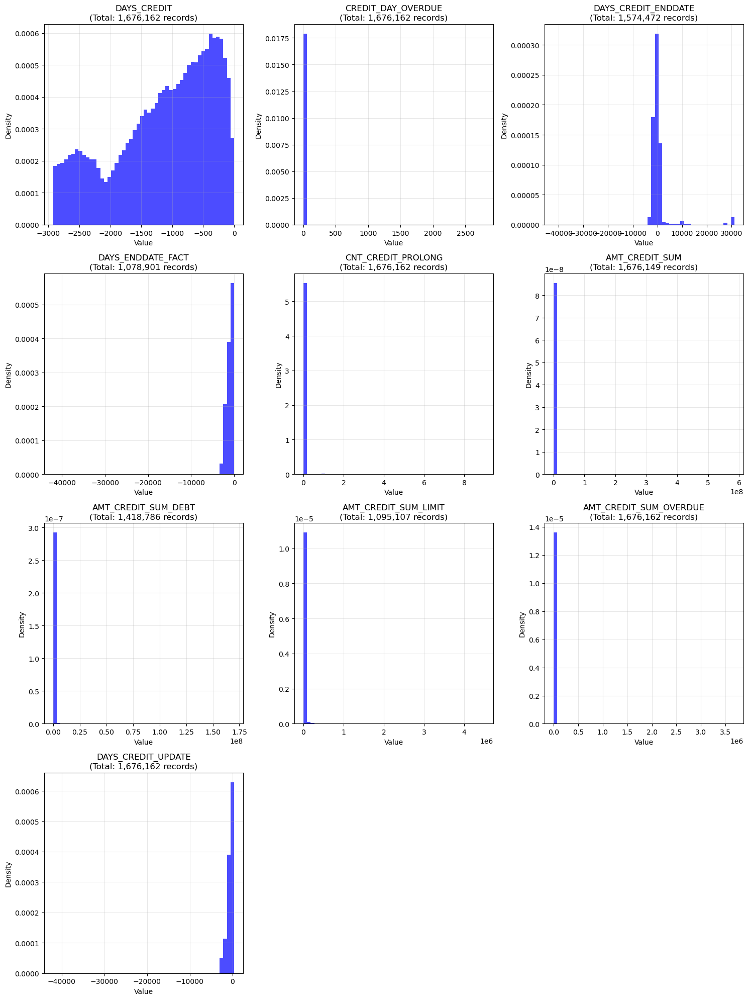


Plotted histograms for 10 features

--------------------------------------------------------------------------------
BOXPLOT PLOTS - ALL NUMERIC FEATURES:
--------------------------------------------------------------------------------


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3973846775.py:114: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot([values], labels=[col], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3973846775.py:114: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot([values], labels=[col], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3973846775.py:114: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot([values], labels=[col], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel

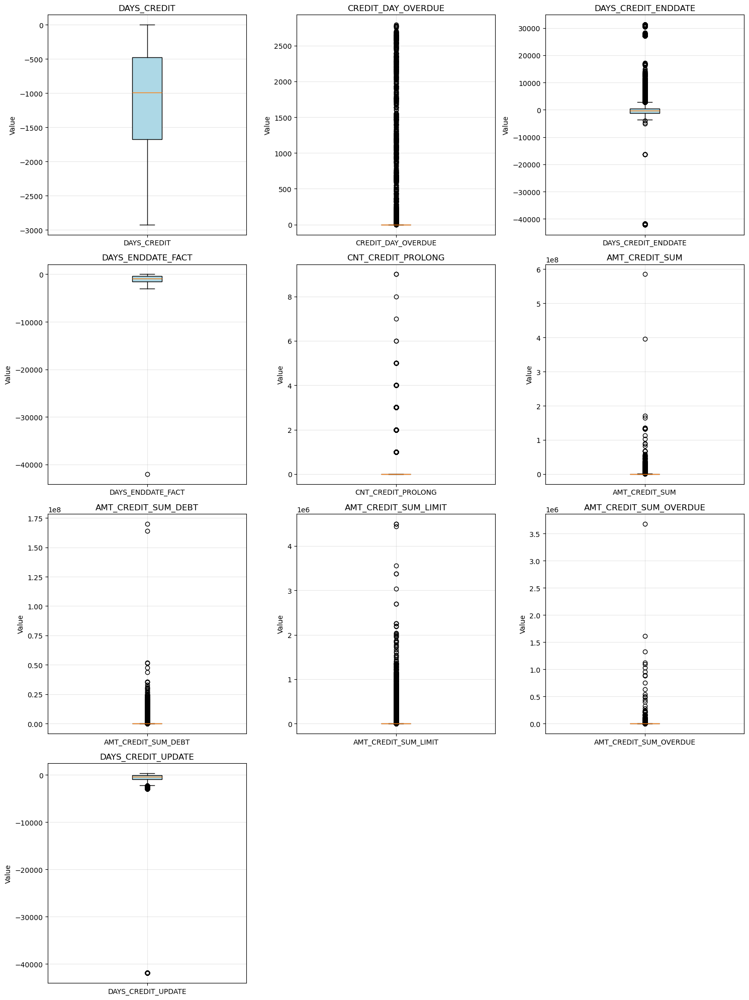


Plotted boxplots for 10 features

SUMMARY
Total numeric features analyzed: 10
Features with outliers (|z| > 3): 9

Note: Outliers can be handled by capping/winsorizing before aggregation
      This will prevent outliers from skewing aggregated features (sum/mean)


In [9]:

# Distribution Analysis and Outlier Detection for Bureau Data (Raw, Before Aggregation)
print("\n" + "="*80)
print("DISTRIBUTION ANALYSIS AND OUTLIER DETECTION - BUREAU DATA (RAW)")
print("="*80)
print("Note: Bureau data is not aggregated yet, so no goods vs bads comparison")

# Get numeric columns (excluding ID columns)
numeric_cols = [col for col in bureauData_filtered.select_dtypes(include=[np.number]).columns 
                if col not in ['SK_ID_CURR', 'SK_ID_BUREAU']]

print(f"\nAnalyzing {len(numeric_cols)} numeric features...")

# Calculate z-scores for outlier detection
print("\n" + "-"*80)
print("OUTLIER DETECTION USING Z-SCORE (|z| > 3):")
print("-"*80)

outlier_summary = []
for col in numeric_cols:
    if bureauData_filtered[col].isnull().all():
        continue
    
    # Calculate z-scores (only for non-null values)
    values = bureauData_filtered[col].dropna()
    if len(values) == 0:
        continue
    
    mean = values.mean()
    std = values.std()
    
    if std == 0:  # Skip constant columns
        continue
    
    z_scores = np.abs((values - mean) / std)
    outliers = z_scores > 3
    outlier_count = outliers.sum()
    outlier_pct = (outlier_count / len(values)) * 100
    
    if outlier_count > 0:
        outlier_summary.append({
            'Column': col,
            'Outliers': outlier_count,
            'Percentage': outlier_pct,
            'Max Z-Score': z_scores.max(),
            'Min Value': values.min(),
            'Max Value': values.max(),
            'Mean': mean,
            'Std': std
        })

if outlier_summary:
    outlier_df = pd.DataFrame(outlier_summary)
    outlier_df = outlier_df.sort_values('Outliers', ascending=False)
    print(f"\nFound outliers in {len(outlier_df)} columns:")
    print(outlier_df.to_string(index=False))
else:
    print("No outliers found (|z| > 3) in numeric columns")

# Plot histograms for all numeric features
print("\n" + "-"*80)
print("HISTOGRAM PLOTS - ALL NUMERIC FEATURES:")
print("-"*80)

# Select all numeric features to plot
key_features = numeric_cols  # Plot all numeric features

if key_features:
    n_cols = 3
    n_rows = (len(key_features) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    axes = axes.flatten() if n_rows > 1 else [axes] if n_rows == 1 else axes
    
    for idx, col in enumerate(key_features):
        ax = axes[idx]
        
        # Plot histogram (no goods vs bads since not aggregated yet)
        values = bureauData_filtered[col].dropna()
        
        if len(values) > 0:
            ax.hist(values, bins=50, alpha=0.7, color='blue', density=True)
            ax.set_title(f'{col}\n(Total: {len(values):,} records)')
            ax.set_xlabel('Value')
            ax.set_ylabel('Density')
            ax.grid(True, alpha=0.3)
    
    # Hide unused subplots
    for idx in range(len(key_features), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    print(f"\nPlotted histograms for {len(key_features)} features")

# Plot boxplots for all numeric features
print("\n" + "-"*80)
print("BOXPLOT PLOTS - ALL NUMERIC FEATURES:")
print("-"*80)

if key_features:
    n_cols = 3
    n_rows = (len(key_features) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    axes = axes.flatten() if n_rows > 1 else [axes] if n_rows == 1 else axes
    
    for idx, col in enumerate(key_features):
        ax = axes[idx]
        
        # Plot boxplot (no goods vs bads since not aggregated yet)
        values = bureauData_filtered[col].dropna()
        
        if len(values) > 0:
            bp = ax.boxplot([values], labels=[col], patch_artist=True)
            bp['boxes'][0].set_facecolor('lightblue')
            ax.set_title(f'{col}')
            ax.set_ylabel('Value')
            ax.grid(True, alpha=0.3)
    
    # Hide unused subplots
    for idx in range(len(key_features), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    print(f"\nPlotted boxplots for {len(key_features)} features")

print("\n" + "="*80)
print("SUMMARY")
print("="*80)
print(f"Total numeric features analyzed: {len(numeric_cols)}")
print(f"Features with outliers (|z| > 3): {len(outlier_summary)}")
print(f"\nNote: Outliers can be handled by capping/winsorizing before aggregation")
print(f"      This will prevent outliers from skewing aggregated features (sum/mean)")


In [10]:
# Drop rows where DAYS_CREDIT_ENDDATE is a POSITIVE outlier (|z| > 3 and value > 0)
# Note: Negative outliers are kept as they represent past loans (days in the past)
print("\n" + "="*80)
print("REMOVING POSITIVE OUTLIERS FOR DAYS_CREDIT_ENDDATE")
print("="*80)

col = 'DAYS_CREDIT_ENDDATE'
rows_before = len(bureauData_filtered)

if col in bureauData_filtered.columns:
    vals = bureauData_filtered[col]
    non_null = vals.dropna()
    
    if len(non_null) > 0:
        mu = non_null.mean()
        sigma = non_null.std()
        
        if sigma and sigma != 0:
            # Calculate z-scores for all values (including NaN)
            z_scores = (vals - mu) / sigma
            
            # Identify positive outliers: value > 0 AND |z| > 3
            pos_outlier_mask = (vals > 0) & (z_scores.abs() > 3)
            n_pos_outliers = int(pos_outlier_mask.sum())
            
            if n_pos_outliers > 0:
                print(f"  Found {n_pos_outliers} positive outliers in {col} (|z| > 3 and value > 0)")
                print(f"  Dropping these rows...")
                
                # Show some stats about what we're dropping
                outlier_vals = vals[pos_outlier_mask]
                print(f"    Min positive outlier value: {outlier_vals.min()}")
                print(f"    Max positive outlier value: {outlier_vals.max()}")
                
                # Drop the rows
                bureauData_filtered = bureauData_filtered.loc[~pos_outlier_mask]
                
                rows_after = len(bureauData_filtered)
                rows_dropped = rows_before - rows_after
                
                print(f"\n  Rows before: {rows_before:,}")
                print(f"  Rows after: {rows_after:,}")
                print(f"  Rows dropped: {rows_dropped:,} ({rows_dropped/rows_before*100:.2f}%)")
            else:
                print(f"  No positive outliers found in {col} (|z| > 3 and value > 0)")
                print(f"  All outliers are negative (past loans) - keeping them")
        else:
            print(f"  ⚠ Cannot compute z-scores: std is zero for {col}")
    else:
        print(f"  ⚠ {col} has no non-null values")
else:
    print(f"  ⚠ Column {col} not found in bureauData_filtered")

print("\n" + "="*80)




REMOVING POSITIVE OUTLIERS FOR DAYS_CREDIT_ENDDATE
  Found 36579 positive outliers in DAYS_CREDIT_ENDDATE (|z| > 3 and value > 0)
  Dropping these rows...
    Min positive outlier value: 16376.0
    Max positive outlier value: 31199.0

  Rows before: 1,676,162
  Rows after: 1,639,583
  Rows dropped: 36,579 (2.18%)



In [11]:
bureauData_filtered.isnull().sum()

SK_ID_CURR                     0
SK_ID_BUREAU                   0
CREDIT_ACTIVE                  0
DAYS_CREDIT                    0
CREDIT_DAY_OVERDUE             0
DAYS_CREDIT_ENDDATE       101690
DAYS_ENDDATE_FACT         567556
CNT_CREDIT_PROLONG             0
AMT_CREDIT_SUM                13
AMT_CREDIT_SUM_DEBT       257118
AMT_CREDIT_SUM_LIMIT      566974
AMT_CREDIT_SUM_OVERDUE         0
CREDIT_TYPE                    0
DAYS_CREDIT_UPDATE             0
dtype: int64

In [12]:
appData_filtered.isnull().sum()

SK_ID_CURR                               0
TARGET                                   0
NAME_CONTRACT_TYPE                       0
FLAG_OWN_CAR                             0
FLAG_OWN_REALTY                          0
CNT_CHILDREN                             0
AMT_INCOME_TOTAL                         0
AMT_CREDIT                               0
AMT_ANNUITY                              1
AMT_GOODS_PRICE                          0
NAME_INCOME_TYPE                         0
NAME_EDUCATION_TYPE                      0
NAME_HOUSING_TYPE                        0
DAYS_BIRTH                               0
DAYS_EMPLOYED                            0
DAYS_REGISTRATION                        0
DAYS_ID_PUBLISH                          0
OCCUPATION_TYPE                       9954
CNT_FAM_MEMBERS                          0
REGION_RATING_CLIENT                     0
REGION_RATING_CLIENT_W_CITY              0
ORGANIZATION_TYPE                        0
OBS_30_CNT_SOCIAL_CIRCLE                 0
DEF_30_CNT_

In [13]:
appData_filtered.shape

(61707, 29)

# Aggregating and Merging

In [14]:
# Aggregation of filtered bureau data on SK_ID_CURR
print("="*80)
print("AGGREGATING BUREAU DATA ON SK_ID_CURR")
print("="*80)

# Check current shape
print(f"\nInput data shape: {bureauData_filtered.shape}")
print(f"Unique SK_ID_CURR: {bureauData_filtered['SK_ID_CURR'].nunique():,}")

# Get list of columns to aggregate (exclude ID columns)
id_cols = ['SK_ID_CURR', 'SK_ID_BUREAU']
agg_cols = [col for col in bureauData_filtered.columns if col not in id_cols]

print(f"\nColumns to aggregate: {len(agg_cols)}")
print(f"Columns: {', '.join(agg_cols)}")

# Perform aggregation using groupby
print("\nPerforming aggregation...")

# Start with count of bureau records
bureauData_agg = bureauData_filtered.groupby('SK_ID_CURR').agg({
    'SK_ID_BUREAU': 'count',
})

# Rename the count column
bureauData_agg = bureauData_agg.rename(columns={'SK_ID_BUREAU': 'NUM_BUREAU_RECORDS'})

# Get categorical and numeric columns
categorical_cols = bureauData_filtered[agg_cols].select_dtypes(include=['object']).columns.tolist()
numeric_cols = bureauData_filtered[agg_cols].select_dtypes(include=[np.number]).columns.tolist()

# Add categorical mode aggregations
for col in categorical_cols:
    if col in agg_cols:
        def safe_mode(x):
            """Safely get mode, handling None/NaN values"""
            try:
                # Drop NaN values before calculating mode
                x_clean = x.dropna()
                if len(x_clean) == 0:
                    return np.nan
                mode_result = x_clean.mode()
                if not mode_result.empty and len(mode_result) > 0:
                    return mode_result.iloc[0]
                else:
                    return np.nan
            except (IndexError, AttributeError, TypeError):
                return np.nan
        
        mode_series = bureauData_filtered.groupby('SK_ID_CURR')[col].apply(safe_mode)
        bureauData_agg[f'{col}_MODE'] = mode_series

# Add numeric aggregations
for col in numeric_cols:
    if col in agg_cols:
        # For amount, count, overdue, and prolong columns: sum, mean, median, max
        if 'AMT' in col or 'CNT' in col or 'OVERDUE' in col or 'PROLONG' in col:
            bureauData_agg[f'{col}_SUM'] = bureauData_filtered.groupby('SK_ID_CURR')[col].sum()
            bureauData_agg[f'{col}_MEAN'] = bureauData_filtered.groupby('SK_ID_CURR')[col].mean()
            bureauData_agg[f'{col}_MEDIAN'] = bureauData_filtered.groupby('SK_ID_CURR')[col].median()
            bureauData_agg[f'{col}_MAX'] = bureauData_filtered.groupby('SK_ID_CURR')[col].max()
          
        # For DAYS columns: max, mean, median (time-based features)
        elif 'DAYS' in col:
          
            bureauData_agg[f'{col}_MAX'] = bureauData_filtered.groupby('SK_ID_CURR')[col].max()
            bureauData_agg[f'{col}_MEAN'] = bureauData_filtered.groupby('SK_ID_CURR')[col].mean()
            bureauData_agg[f'{col}_MEDIAN'] = bureauData_filtered.groupby('SK_ID_CURR')[col].median()
        # For other numeric columns: sum, mean, median, max
        else:
            bureauData_agg[f'{col}_SUM'] = bureauData_filtered.groupby('SK_ID_CURR')[col].sum()
            bureauData_agg[f'{col}_MEAN'] = bureauData_filtered.groupby('SK_ID_CURR')[col].mean()
            bureauData_agg[f'{col}_MEDIAN'] = bureauData_filtered.groupby('SK_ID_CURR')[col].median()
            bureauData_agg[f'{col}_MAX'] = bureauData_filtered.groupby('SK_ID_CURR')[col].max()
          

# Reset index to make SK_ID_CURR a column
bureauData_agg = bureauData_agg.reset_index()

# Clean up the DataFrame: ensure proper dtypes and handle None/NaN values
print("\nCleaning up aggregated data...")
for col in bureauData_agg.columns:
    if col != 'SK_ID_CURR':
        # Replace None with NaN for all columns
        if bureauData_agg[col].dtype == 'object':
            # For object columns (like mode), replace None with NaN, then try to convert to numeric if possible
            bureauData_agg[col] = bureauData_agg[col].replace([None], np.nan)
            # Try to convert to numeric if all values are numeric
            try:
                bureauData_agg[col] = pd.to_numeric(bureauData_agg[col], errors='coerce')
            except:
                pass
        else:
            # For numeric columns, replace None with NaN
            bureauData_agg[col] = bureauData_agg[col].replace([None], np.nan)
            # Ensure it's float64 to handle NaN properly
            if bureauData_agg[col].dtype in ['int64', 'int32']:
                # Convert int to float if there are any NaN values
                if bureauData_agg[col].isna().any():
                    bureauData_agg[col] = bureauData_agg[col].astype('float64')

print(f"\nOutput data shape: {bureauData_agg.shape}")
print(f"Unique SK_ID_CURR in aggregated data: {bureauData_agg['SK_ID_CURR'].nunique():,}")

# Show summary statistics
print("\n" + "-"*80)
print("AGGREGATION SUMMARY")
print("-"*80)
print(f"Rows before aggregation: {len(bureauData_filtered):,}")
print(f"Rows after aggregation: {len(bureauData_agg):,}")
print(f"Reduction: {len(bureauData_filtered) - len(bureauData_agg):,} rows ({((len(bureauData_filtered) - len(bureauData_agg)) / len(bureauData_filtered) * 100):.2f}%)")
print(f"\nFeatures created: {len(bureauData_agg.columns) - 1}")  # -1 for SK_ID_CURR

# Display first few rows
print("\n" + "-"*80)
print("SAMPLE OF AGGREGATED DATA (first 5 rows):")
print("-"*80)
print(bureauData_agg.head())

# Display column names
print("\n" + "-"*80)
print("AGGREGATED FEATURE NAMES:")
print("-"*80)
for i, col in enumerate(bureauData_agg.columns, 1):
    if col != 'SK_ID_CURR':
        print(f"{i}. {col}")

# Display data types and missing values
print("\n" + "-"*80)
print("DATA TYPES AND MISSING VALUES:")
print("-"*80)
try:
    bureauData_agg.info()
except TypeError as e:
    # Fallback if .info() fails - display manually
    print(f"Shape: {bureauData_agg.shape}")
    print(f"\nColumn dtypes:")
    for col in bureauData_agg.columns:
        print(f"  {col}: {bureauData_agg[col].dtype}")
    print(f"\nMissing values:")
    missing = bureauData_agg.isnull().sum()
    for col in bureauData_agg.columns:
        if missing[col] > 0:
            print(f"  {col}: {missing[col]} ({missing[col]/len(bureauData_agg)*100:.2f}%)")

print("\n" + "="*80)
print("AGGREGATION COMPLETE")
print("="*80)
print(f"\nVariable name: bureauData_agg")
print(f"Shape: {bureauData_agg.shape}")

AGGREGATING BUREAU DATA ON SK_ID_CURR

Input data shape: (1639583, 14)
Unique SK_ID_CURR: 303,408

Columns to aggregate: 12
Columns: CREDIT_ACTIVE, DAYS_CREDIT, CREDIT_DAY_OVERDUE, DAYS_CREDIT_ENDDATE, DAYS_ENDDATE_FACT, CNT_CREDIT_PROLONG, AMT_CREDIT_SUM, AMT_CREDIT_SUM_DEBT, AMT_CREDIT_SUM_LIMIT, AMT_CREDIT_SUM_OVERDUE, CREDIT_TYPE, DAYS_CREDIT_UPDATE

Performing aggregation...

Cleaning up aggregated data...

Output data shape: (303408, 40)
Unique SK_ID_CURR in aggregated data: 303,408

--------------------------------------------------------------------------------
AGGREGATION SUMMARY
--------------------------------------------------------------------------------
Rows before aggregation: 1,639,583
Rows after aggregation: 303,408
Reduction: 1,336,175 rows (81.49%)

Features created: 39

--------------------------------------------------------------------------------
SAMPLE OF AGGREGATED DATA (first 5 rows):
---------------------------------------------------------------------------

In [15]:
# Merging application data with bureau data
print("\n" + "="*80)
print("MERGING APPLICATION DATA WITH BUREAU DATA")
print("="*80)

# Check data shapes before merge
print(f"\nBefore merge:")
print(f"  Application data (appData_filtered): {appData_filtered.shape}")
print(f"  Bureau data (bureauData_agg): {bureauData_agg.shape}")

# Perform LEFT JOIN: Application data on LEFT, Bureau data on RIGHT
# This keeps ALL application records and adds bureau data where available
print("\nPerforming LEFT JOIN (application data on left)...")
print("  - Keeps ALL rows from application data")
print("  - Adds matching bureau data where available")
print("  - Fills with NaN for customers without bureau history")

merged_data = appData_filtered.merge(bureauData_agg, on='SK_ID_CURR', how='left')

print(f"\nAfter merge:")
print(f"  Merged data: {merged_data.shape}")
print(f"  Columns added: {len(merged_data.columns) - len(appData_filtered.columns)}")

# Check merge results
print("\n" + "-"*80)
print("MERGE RESULT ANALYSIS")
print("-"*80)

# Count customers with and without bureau history
customers_with_bureau = merged_data['NUM_BUREAU_RECORDS'].notna().sum()
customers_without_bureau = merged_data['NUM_BUREAU_RECORDS'].isna().sum()

print(f"\nCustomers with bureau history: {customers_with_bureau:,} ({customers_with_bureau/len(merged_data)*100:.2f}%)")
print(f"Customers without bureau history: {customers_without_bureau:,} ({customers_without_bureau/len(merged_data)*100:.2f}%)")

# Get all bureau columns (all columns except application data columns)
bureau_cols = [col for col in merged_data.columns if col not in appData_filtered.columns]

print("\n" + "-"*80)
print("FILLING MISSING VALUES (SCORECARD-SAFE)")
print("-"*80)

# --- IDENTIFY CATEGORICAL VS NUMERICAL COLUMNS ---
# Identify categorical columns (object dtype) and numerical columns (numeric dtypes)
# Include OCCUPATION_TYPE from application data and all categorical bureau columns
all_cols_to_check = ['OCCUPATION_TYPE'] + [col for col in bureau_cols if col != 'SK_ID_CURR']

categorical_cols = []
numerical_cols = []

for col in all_cols_to_check:
    if col in merged_data.columns:
        if merged_data[col].dtype == 'object':
            categorical_cols.append(col)
        elif pd.api.types.is_numeric_dtype(merged_data[col]):
            numerical_cols.append(col)

print(f"\nIdentified columns:")
print(f"  - Categorical columns: {len(categorical_cols)}")
print(f"  - Numerical columns: {len(numerical_cols)}")

# --- FILL CATEGORICAL COLUMNS ONLY ---
print("\nFilling missing values in CATEGORICAL columns with 'Missing':")
for col in categorical_cols:
    missing_before = merged_data[col].isna().sum()
    if missing_before > 0:
        merged_data[col] = merged_data[col].fillna("Missing")
        print(f"  {col}: {missing_before:,} missing values filled with 'Missing'")

# --- LEAVE NUMERICAL COLUMNS AS NaN ---
print("\nNumerical columns left as NaN (not filled):")
numerical_missing = {}
for col in numerical_cols:
    missing_count = merged_data[col].isna().sum()
    if missing_count > 0:
        numerical_missing[col] = missing_count

if numerical_missing:
    for col, count in sorted(numerical_missing.items(), key=lambda x: x[1], reverse=True):
        print(f"  {col}: {count:,} missing values (left as NaN)")
else:
    print("  No missing values in numerical columns")



# Display summary
print("\n" + "="*80)
print("MERGE COMPLETE")
print("="*80)
print(f"\nFinal merged dataset:")
print(f"  Shape: {merged_data.shape}")
print(f"  Rows: {len(merged_data):,}")
print(f"  Columns: {len(merged_data.columns)}")
print(f"  Application columns: {len(appData_filtered.columns)}")
print(f"  Bureau columns: {len(bureau_cols)}")
print(f"\nVariable name: merged_data")
print(f"Ready for analysis and model building!")



MERGING APPLICATION DATA WITH BUREAU DATA

Before merge:
  Application data (appData_filtered): (61707, 29)
  Bureau data (bureauData_agg): (303408, 40)

Performing LEFT JOIN (application data on left)...
  - Keeps ALL rows from application data
  - Adds matching bureau data where available
  - Fills with NaN for customers without bureau history

After merge:
  Merged data: (61707, 68)
  Columns added: 39

--------------------------------------------------------------------------------
MERGE RESULT ANALYSIS
--------------------------------------------------------------------------------

Customers with bureau history: 50,681 (82.13%)
Customers without bureau history: 11,026 (17.87%)

--------------------------------------------------------------------------------
FILLING MISSING VALUES (SCORECARD-SAFE)
--------------------------------------------------------------------------------

Identified columns:
  - Categorical columns: 1
  - Numerical columns: 39

Filling missing values in CAT

In [16]:
merged_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,AMT_CREDIT_SUM_LIMIT_MEAN,AMT_CREDIT_SUM_LIMIT_MEDIAN,AMT_CREDIT_SUM_LIMIT_MAX,AMT_CREDIT_SUM_OVERDUE_SUM,AMT_CREDIT_SUM_OVERDUE_MEAN,AMT_CREDIT_SUM_OVERDUE_MEDIAN,AMT_CREDIT_SUM_OVERDUE_MAX,DAYS_CREDIT_UPDATE_MAX,DAYS_CREDIT_UPDATE_MEAN,DAYS_CREDIT_UPDATE_MEDIAN
0,100008,0,Cash loans,N,Y,0,99000.0,490495.5,27517.5,454500.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-16.0,-611.000000,-790.0
1,100014,0,Cash loans,N,Y,1,112500.0,652500.0,21177.0,652500.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-25.0,-615.875000,-416.5
2,100016,0,Cash loans,N,Y,0,67500.0,80865.0,5881.5,67500.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0,-405.857143,-46.0
3,100020,0,Cash loans,N,N,0,108000.0,509602.5,26149.5,387000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-28.0,-130.750000,-92.5
4,100023,0,Cash loans,N,Y,1,90000.0,544491.0,17563.5,454500.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-5.0,-634.076923,-635.0


In [17]:
merged_data.isnull().sum().sort_values(ascending=False).head(20)


CREDIT_TYPE_MODE               61707
CREDIT_ACTIVE_MODE             61707
DAYS_ENDDATE_FACT_MAX          17310
DAYS_ENDDATE_FACT_MEDIAN       17310
DAYS_ENDDATE_FACT_MEAN         17310
AMT_CREDIT_SUM_LIMIT_MEAN      15330
AMT_CREDIT_SUM_LIMIT_MAX       15330
AMT_CREDIT_SUM_LIMIT_MEDIAN    15330
AMT_CREDIT_SUM_DEBT_MAX        12758
AMT_CREDIT_SUM_DEBT_MEDIAN     12758
AMT_CREDIT_SUM_DEBT_MEAN       12758
DAYS_CREDIT_ENDDATE_MAX        11609
DAYS_CREDIT_ENDDATE_MEAN       11609
DAYS_CREDIT_ENDDATE_MEDIAN     11609
CNT_CREDIT_PROLONG_SUM         11026
DAYS_CREDIT_MEDIAN             11026
CNT_CREDIT_PROLONG_MEDIAN      11026
CREDIT_DAY_OVERDUE_MAX         11026
CREDIT_DAY_OVERDUE_MEDIAN      11026
CNT_CREDIT_PROLONG_MEAN        11026
dtype: int64

# Further Cleaning After Merging

In [18]:
# Variable Selection and Filtering - After Merging
print("\n" + "="*80)
print("VARIABLE SELECTION AND FILTERING - MERGED DATA")
print("="*80)

# Initialize merged_data_filtered (copy of merged_data) before filtering
merged_data_filtered = merged_data.copy()
cols_before = len(merged_data_filtered.columns)
rows_before = len(merged_data_filtered)

print(f"\nStarting with merged data:")
print(f"  Rows: {rows_before:,}")
print(f"  Columns: {cols_before}")

# Step 1: Remove variables with only 1 unique value (categorical AND numeric)
print("\n" + "-"*80)
print("1. DROPPING VARIABLES WITH NO VARIATION (1 unique value):")
print("-" * 80)

single_value_cols = []
for col in merged_data_filtered.columns:
    if col in ['TARGET', 'SK_ID_CURR']:  # Skip ID and target columns
        continue
    
    # Only drop if column has exactly 1 unique value
    if merged_data_filtered[col].nunique(dropna=False) == 1:  # Check including NaN
        single_value_cols.append(col)
        unique_val = merged_data_filtered[col].dropna().unique()[0] if merged_data_filtered[col].dropna().nunique() > 0 else "all NaN"
        print(f"  Dropping: {col} (only 1 unique value: {unique_val})")

merged_data_filtered = merged_data_filtered.drop(columns=single_value_cols)
print(f"  Columns dropped: {len(single_value_cols)}")
print(f"  Remaining columns: {len(merged_data_filtered.columns)}")

# Step 2: Drop variables with more than 50% missing data
print("\n" + "-"*80)
print("2. DROPPING VARIABLES WITH >50% MISSING DATA:")
print("-" * 80)

total_rows = len(merged_data_filtered)
missing_threshold = 0.50

high_missing_cols = []
for col in merged_data_filtered.columns:
    if col in ['TARGET', 'SK_ID_CURR']:
        continue
    
    missing_count = merged_data_filtered[col].isnull().sum()
    missing_pct = missing_count / total_rows
    
    if missing_pct > missing_threshold:
        high_missing_cols.append(col)
        print(f"  Dropping: {col} ({missing_pct*100:.2f}% missing - {missing_count:,} out of {total_rows:,})")

merged_data_filtered = merged_data_filtered.drop(columns=high_missing_cols)
print(f"  Columns dropped: {len(high_missing_cols)}")
print(f"  Remaining columns: {len(merged_data_filtered.columns)}")

# Step 3: Drop variables with no variation between Goods and Bads
print("\n" + "-"*80)
print("3. DROPPING VARIABLES WITH NO VARIATION BETWEEN GOODS AND BADS:")
print("-" * 80)

no_variation_cols = []
for col in merged_data_filtered.columns:
    if col == 'TARGET' or col == 'SK_ID_CURR':
        continue
    
    # Skip if column only has NaN values
    if merged_data_filtered[col].isnull().all():
        continue
    
    try:
        goods = merged_data_filtered[merged_data_filtered['TARGET'] == 0][col].dropna()
        bads = merged_data_filtered[merged_data_filtered['TARGET'] == 1][col].dropna()
        
        # Skip if either group has no data
        if len(goods) == 0 or len(bads) == 0:
            continue
        
        # For categorical variables: compare normalized distributions
        if merged_data_filtered[col].dtype == 'object' or merged_data_filtered[col].dtype.name == 'category':
            # Handle "Missing" as a category
            goods_dist = goods.value_counts(normalize=True)
            bads_dist = bads.value_counts(normalize=True)
            
            # Get union of all categories
            all_categories = goods_dist.index.union(bads_dist.index)
            
            # Reindex both distributions to have same categories, fill missing with 0
            goods_dist_aligned = goods_dist.reindex(all_categories, fill_value=0)
            bads_dist_aligned = bads_dist.reindex(all_categories, fill_value=0)
            
            # Check if distributions are identical (within small tolerance)
            if goods_dist_aligned.equals(bads_dist_aligned):
                no_variation_cols.append(col)
                print(f"  Dropping: {col} (identical distribution for goods and bads)")
        
        # For numeric variables: check if means are very similar and std devs are similar
        else:
            # Special handling for binary variables (variables with only 2 unique values)
            unique_values = pd.concat([goods, bads]).unique()
            if len(unique_values) == 2:
                # For binary variables, compare proportions of each value
                goods_prop_0 = (goods == unique_values[0]).sum() / len(goods) if len(goods) > 0 else 0
                goods_prop_1 = (goods == unique_values[1]).sum() / len(goods) if len(goods) > 0 else 0
                bads_prop_0 = (bads == unique_values[0]).sum() / len(bads) if len(bads) > 0 else 0
                bads_prop_1 = (bads == unique_values[1]).sum() / len(bads) if len(bads) > 0 else 0
                
                # Check if proportions are very similar (within 1% difference)
                prop_diff_0 = abs(goods_prop_0 - bads_prop_0) * 100
                prop_diff_1 = abs(goods_prop_1 - bads_prop_1) * 100
                
                # If proportions are very similar (within 1% difference), drop
                if prop_diff_0 < 1.0 and prop_diff_1 < 1.0:
                    no_variation_cols.append(col)
                    print(f"  Dropping: {col} (binary variable with almost identical proportions: goods={goods_prop_1:.2%}, bads={bads_prop_1:.2%})")
            else:
                # For non-binary numeric variables, check means and stds
                goods_mean = goods.mean()
                bads_mean = bads.mean()
                goods_std = goods.std()
                bads_std = bads.std()
                
                # If both means and stds are very close, consider dropping
                # Use relative difference threshold (1% for mean, 5% for std)
                mean_diff_pct = abs(goods_mean - bads_mean) / (abs(goods_mean) + 1e-10) * 100
                std_diff_pct = abs(goods_std - bads_std) / (abs(goods_std) + 1e-10) * 100 if goods_std > 0 else 0
                
                # Also check if both have very low variance (constant-like)
                if (mean_diff_pct < 1.0 and std_diff_pct < 5.0) or (goods_std < 1e-6 and bads_std < 1e-6):
                    no_variation_cols.append(col)
                    print(f"  Dropping: {col} (no meaningful difference between goods and bads)")
    
    except Exception as e:
        # Skip columns that cause errors
        pass

merged_data_filtered = merged_data_filtered.drop(columns=no_variation_cols)
print(f"  Columns dropped: {len(no_variation_cols)}")
print(f"  Remaining columns: {len(merged_data_filtered.columns)}")

# Final Summary
print("\n" + "="*80)
print("FINAL SUMMARY - VARIABLE SELECTION AND SCREENING")
print("="*80)
print(f"\nOriginal columns: {cols_before}")
print(f"Final columns: {len(merged_data_filtered.columns)}")
print(f"Columns dropped: {cols_before - len(merged_data_filtered.columns)}")

print(f"\nDropdown breakdown:")
print(f"  - Single value (all types): {len(single_value_cols)}")
print(f"  - More than 50% missing data: {len(high_missing_cols)}")
print(f"  - No variation (goods vs bads): {len(no_variation_cols)}")

print(f"\nRows: {rows_before:,} (unchanged)")
print(f"Columns: {len(merged_data_filtered.columns)}")

print(f"\nVariable name: merged_data_filtered")
print(f"Shape: {merged_data_filtered.shape}")
print("\n" + "="*80)




VARIABLE SELECTION AND FILTERING - MERGED DATA

Starting with merged data:
  Rows: 61,707
  Columns: 68

--------------------------------------------------------------------------------
1. DROPPING VARIABLES WITH NO VARIATION (1 unique value):
--------------------------------------------------------------------------------
  Dropping: NAME_CONTRACT_TYPE (only 1 unique value: Cash loans)
  Dropping: CREDIT_ACTIVE_MODE (only 1 unique value: all NaN)
  Dropping: CREDIT_TYPE_MODE (only 1 unique value: all NaN)
  Columns dropped: 3
  Remaining columns: 65

--------------------------------------------------------------------------------
2. DROPPING VARIABLES WITH >50% MISSING DATA:
--------------------------------------------------------------------------------
  Columns dropped: 0
  Remaining columns: 65

--------------------------------------------------------------------------------
3. DROPPING VARIABLES WITH NO VARIATION BETWEEN GOODS AND BADS:
------------------------------------------

AUTOMATICALLY REMOVING VARIABLES WITH WEAKER CORRELATION TO TARGET

Step 1: Identifying highly correlated pairs...
  Found 24 highly correlated pairs (|correlation| > 0.8)

Step 2: Analyzing correlation with TARGET for each pair

Plotting pair 1: AMT_CREDIT ↔ AMT_GOODS_PRICE


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


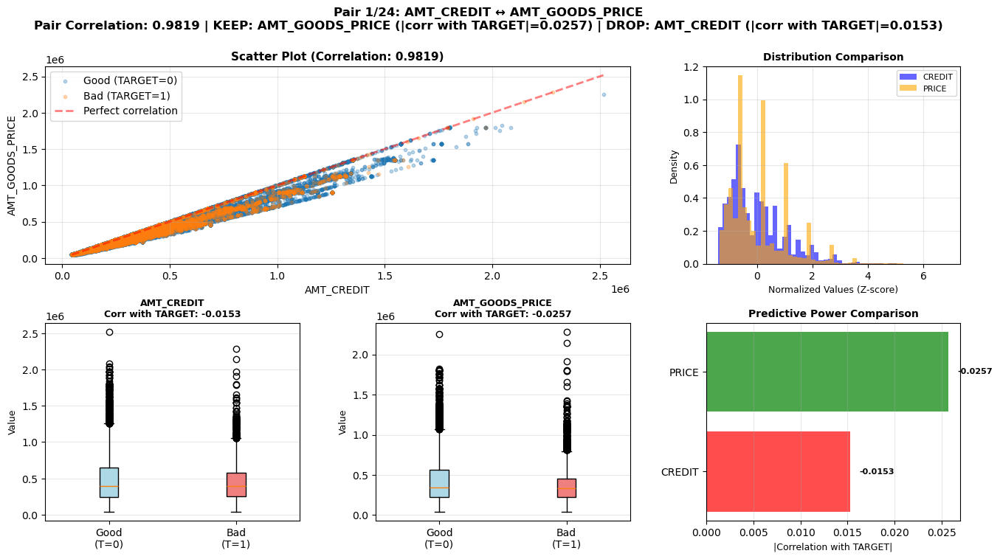

--------------------------------------------------------------------------------

Plotting pair 2: REGION_RATING_CLIENT ↔ REGION_RATING_CLIENT_W_CITY


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


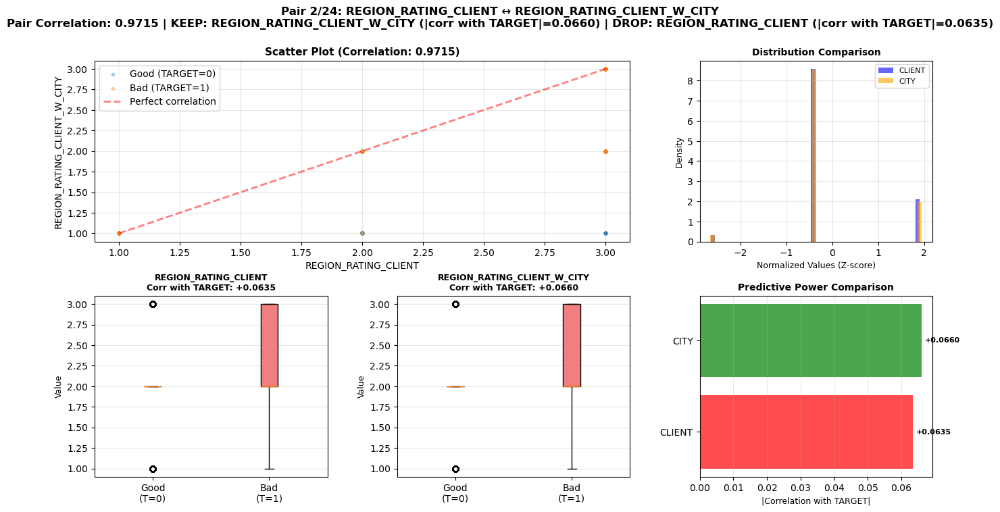

--------------------------------------------------------------------------------

Plotting pair 3: OBS_30_CNT_SOCIAL_CIRCLE ↔ OBS_60_CNT_SOCIAL_CIRCLE


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


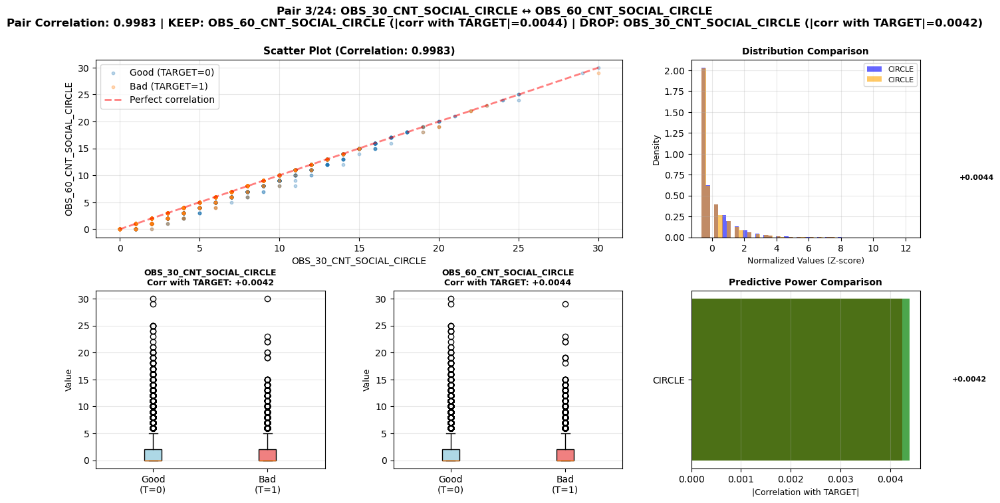

--------------------------------------------------------------------------------

Plotting pair 4: DEF_30_CNT_SOCIAL_CIRCLE ↔ DEF_60_CNT_SOCIAL_CIRCLE


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


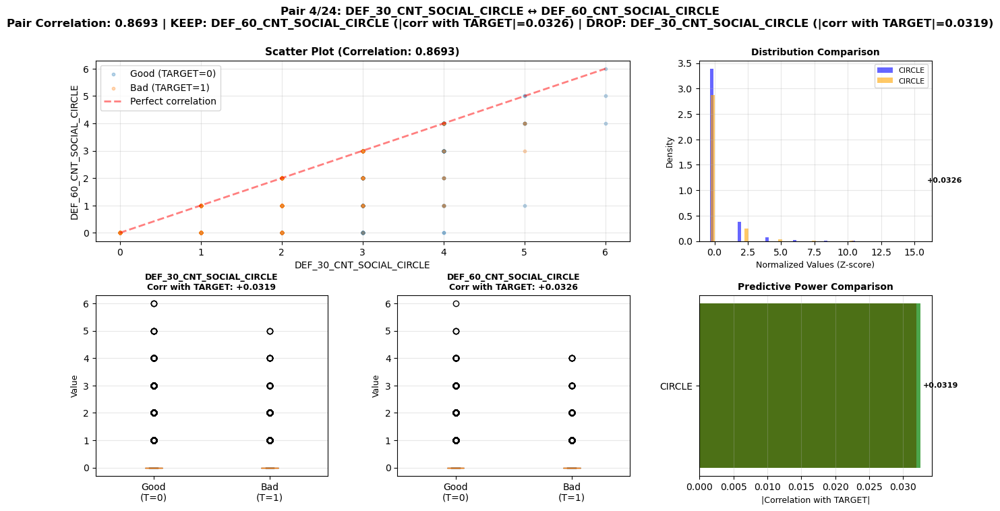

--------------------------------------------------------------------------------

Plotting pair 5: DAYS_CREDIT_MEAN ↔ DAYS_CREDIT_MEDIAN


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


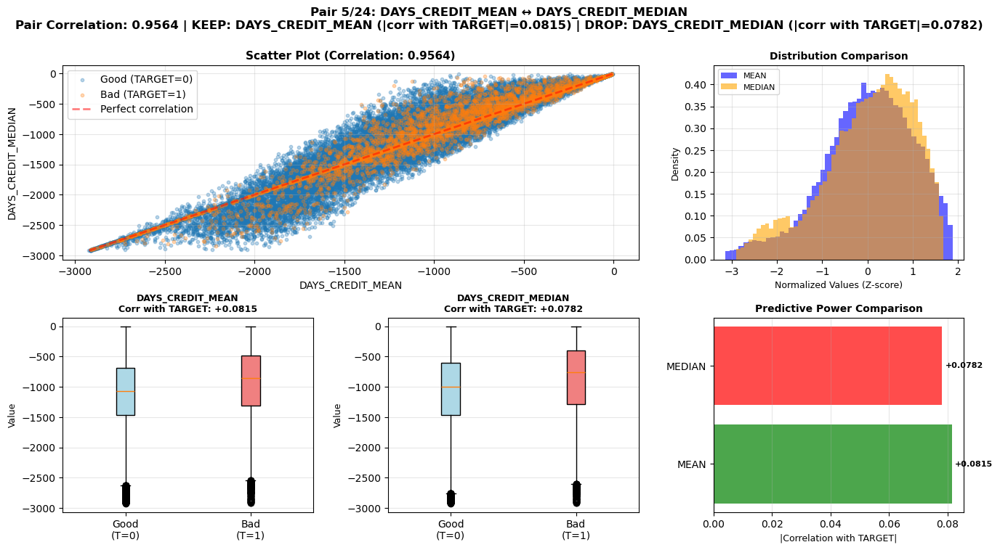

--------------------------------------------------------------------------------

Plotting pair 6: DAYS_CREDIT_MEAN ↔ DAYS_ENDDATE_FACT_MEAN


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


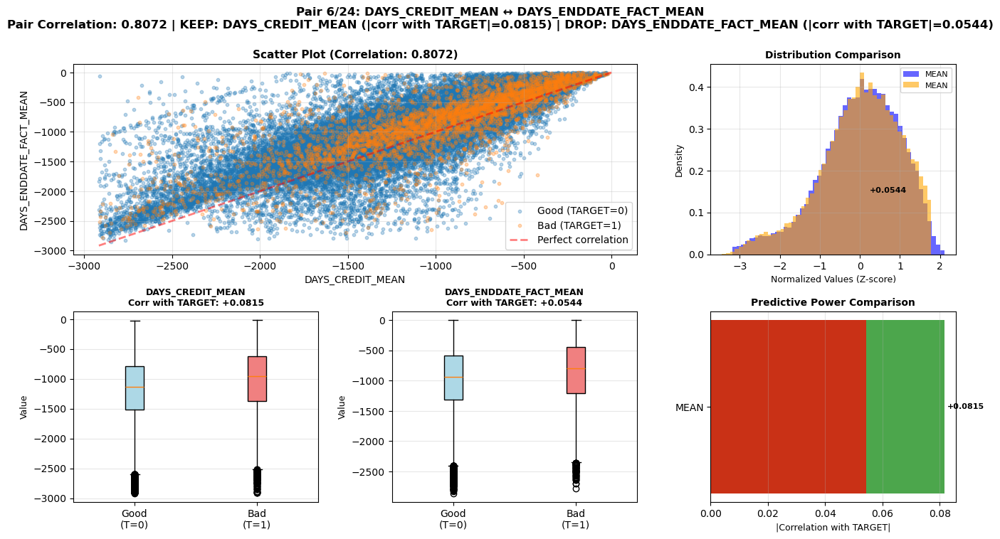

--------------------------------------------------------------------------------

Plotting pair 7: CREDIT_DAY_OVERDUE_SUM ↔ CREDIT_DAY_OVERDUE_MAX


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


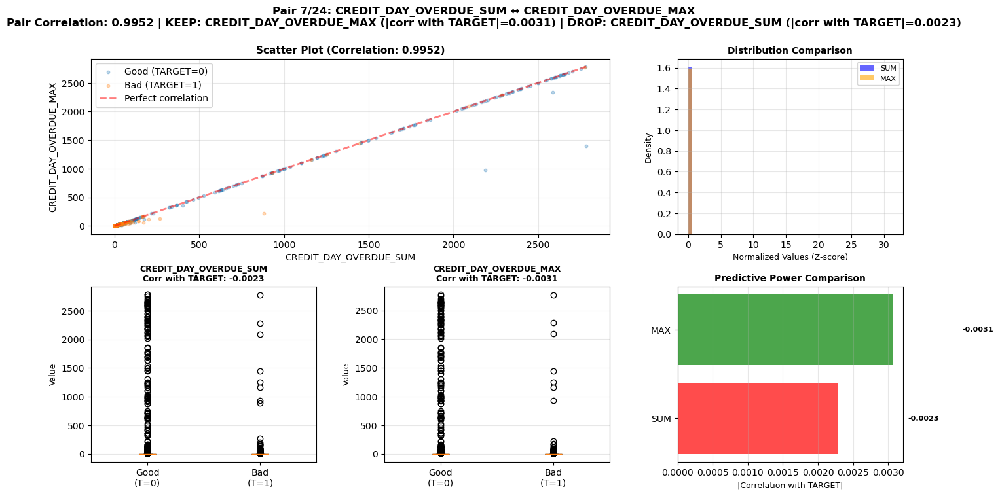

--------------------------------------------------------------------------------

Plotting pair 8: CREDIT_DAY_OVERDUE_MEAN ↔ CREDIT_DAY_OVERDUE_MEDIAN


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


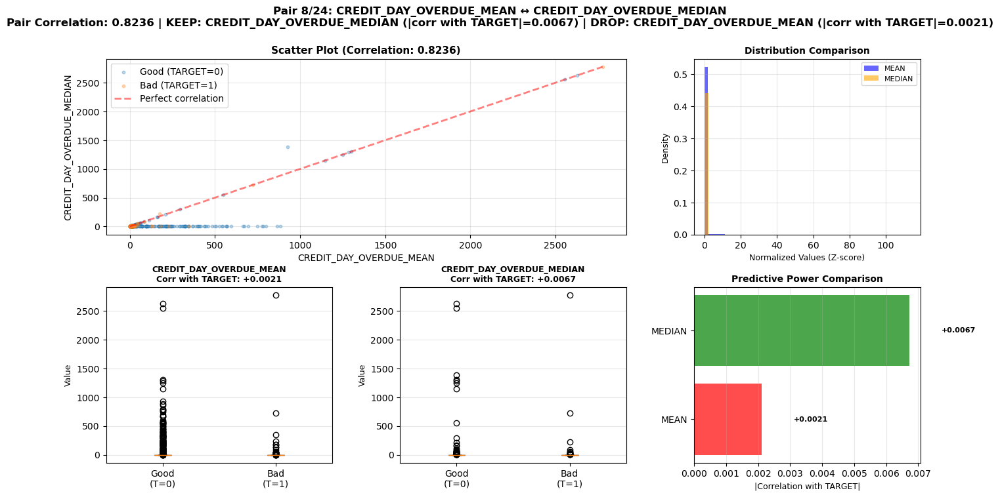

--------------------------------------------------------------------------------

Plotting pair 9: DAYS_CREDIT_ENDDATE_MEAN ↔ DAYS_CREDIT_ENDDATE_MEDIAN


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


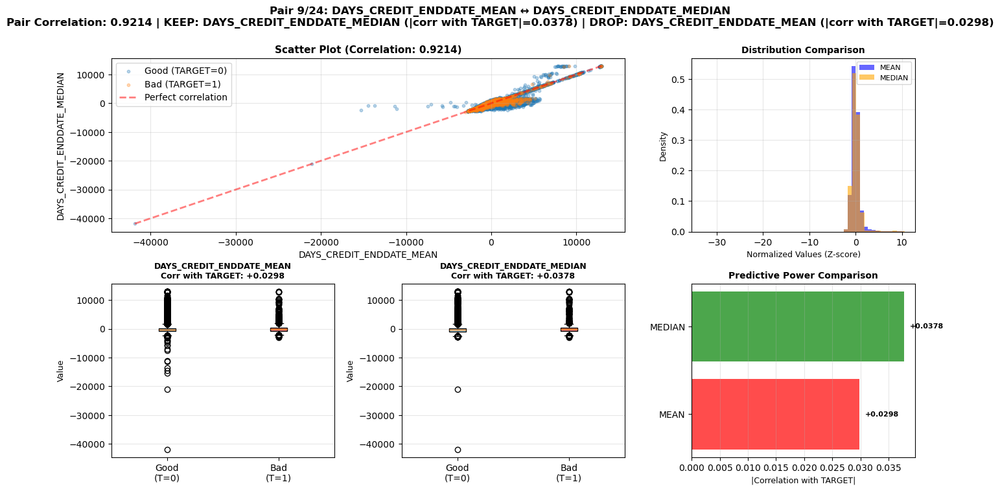

--------------------------------------------------------------------------------

Plotting pair 10: DAYS_ENDDATE_FACT_MEAN ↔ DAYS_ENDDATE_FACT_MEDIAN


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


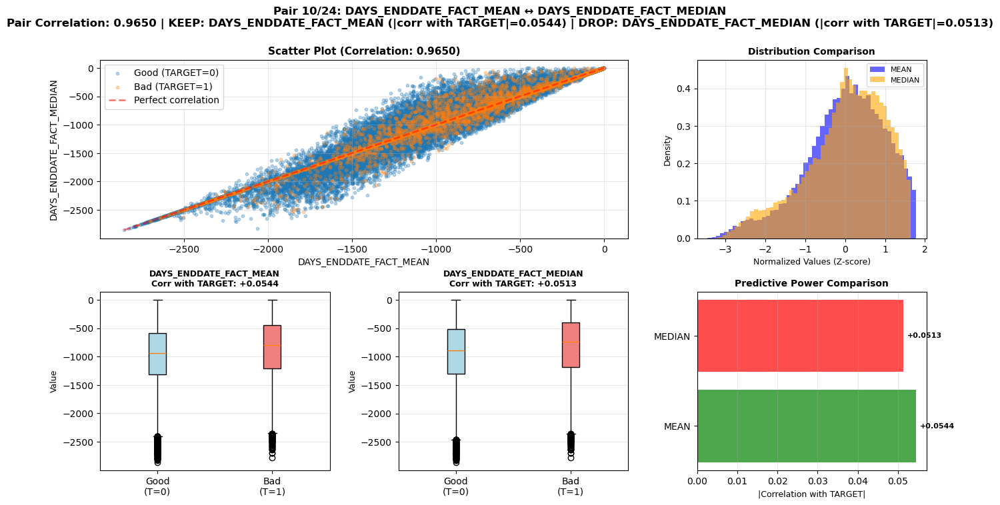

--------------------------------------------------------------------------------

Plotting pair 11: CNT_CREDIT_PROLONG_SUM ↔ CNT_CREDIT_PROLONG_MAX


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


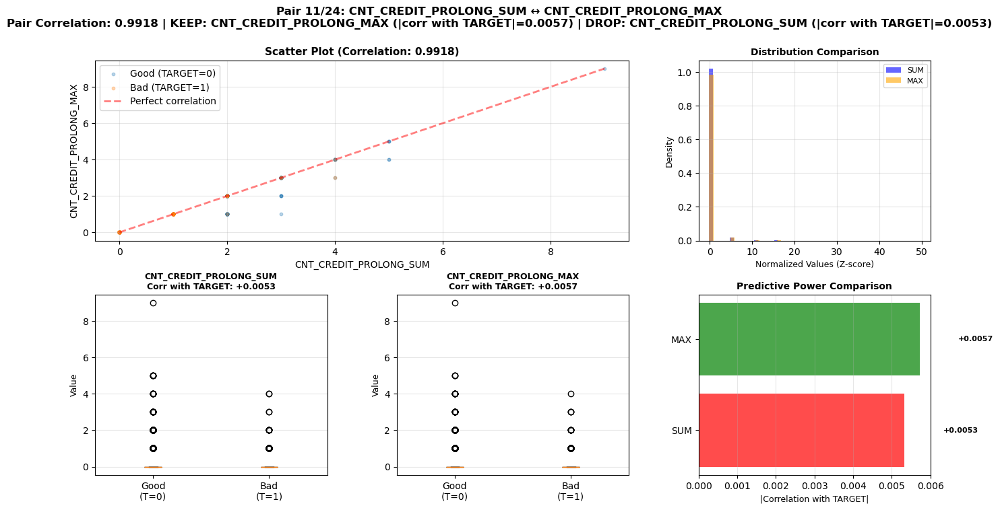

--------------------------------------------------------------------------------

Plotting pair 12: CNT_CREDIT_PROLONG_MEAN ↔ CNT_CREDIT_PROLONG_MEDIAN


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


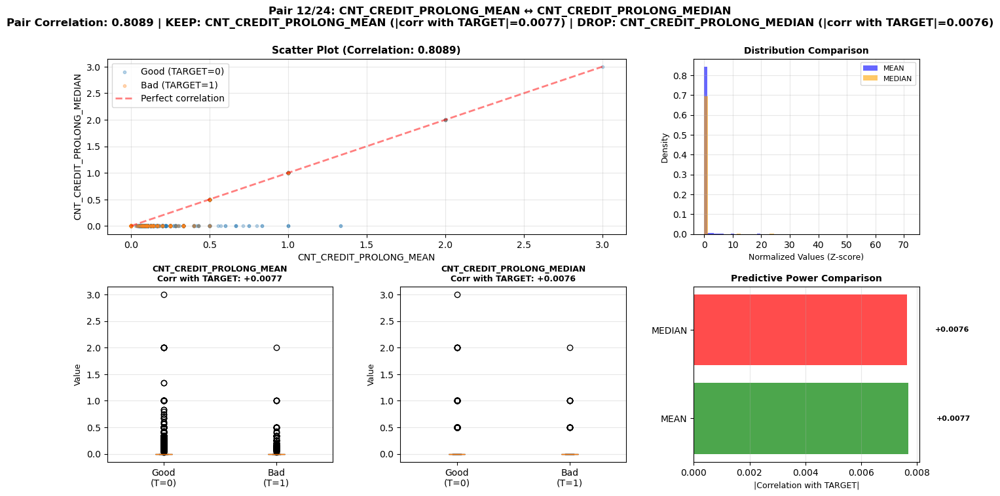

--------------------------------------------------------------------------------

Plotting pair 13: AMT_CREDIT_SUM_SUM ↔ AMT_CREDIT_SUM_MAX


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


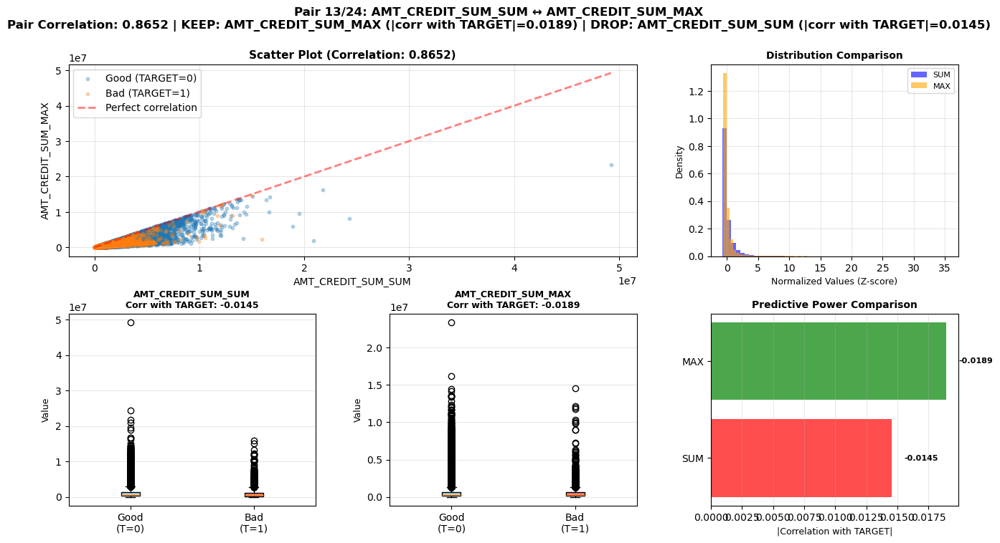

--------------------------------------------------------------------------------

Plotting pair 14: AMT_CREDIT_SUM_MEAN ↔ AMT_CREDIT_SUM_MEDIAN


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


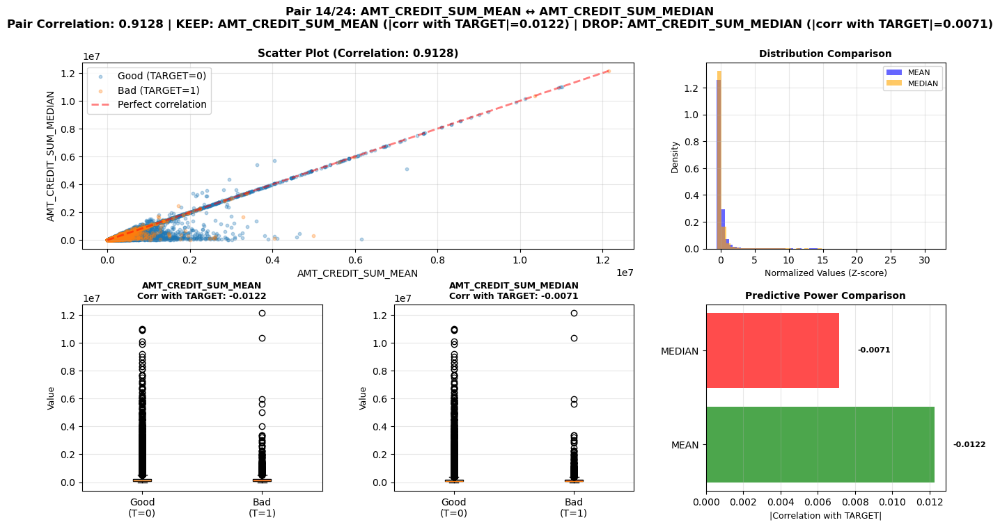

--------------------------------------------------------------------------------

Plotting pair 15: AMT_CREDIT_SUM_MEAN ↔ AMT_CREDIT_SUM_DEBT_MEAN


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


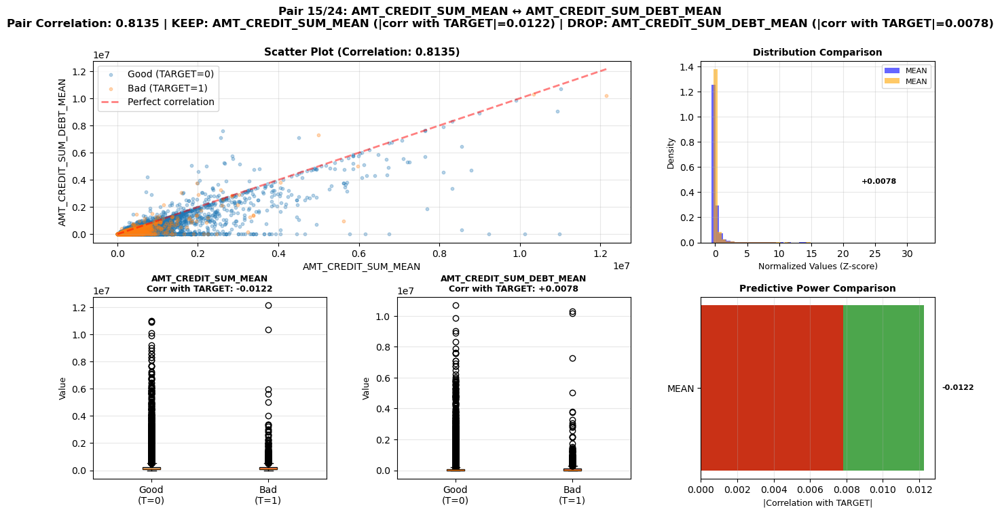

--------------------------------------------------------------------------------

Plotting pair 16: AMT_CREDIT_SUM_MAX ↔ AMT_CREDIT_SUM_DEBT_MAX


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


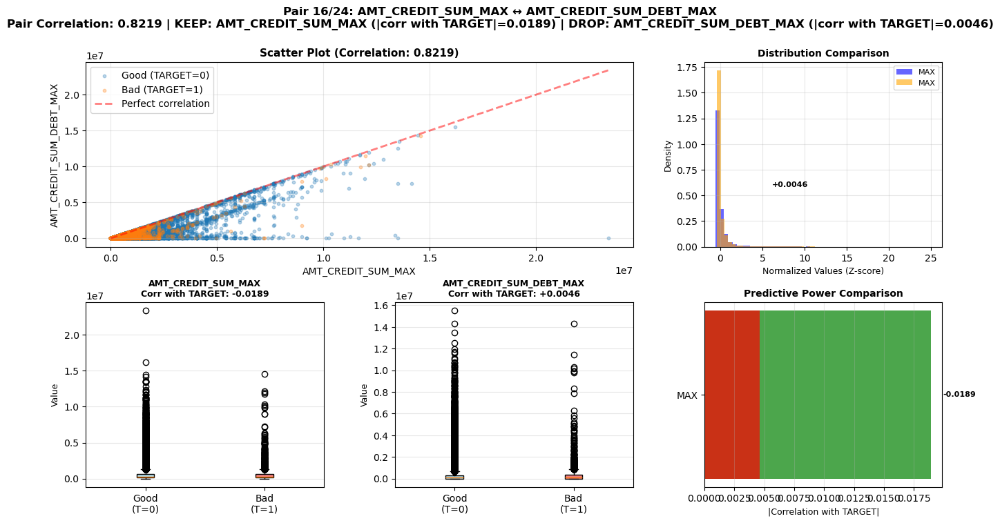

--------------------------------------------------------------------------------

Plotting pair 17: AMT_CREDIT_SUM_LIMIT_SUM ↔ AMT_CREDIT_SUM_LIMIT_MAX


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


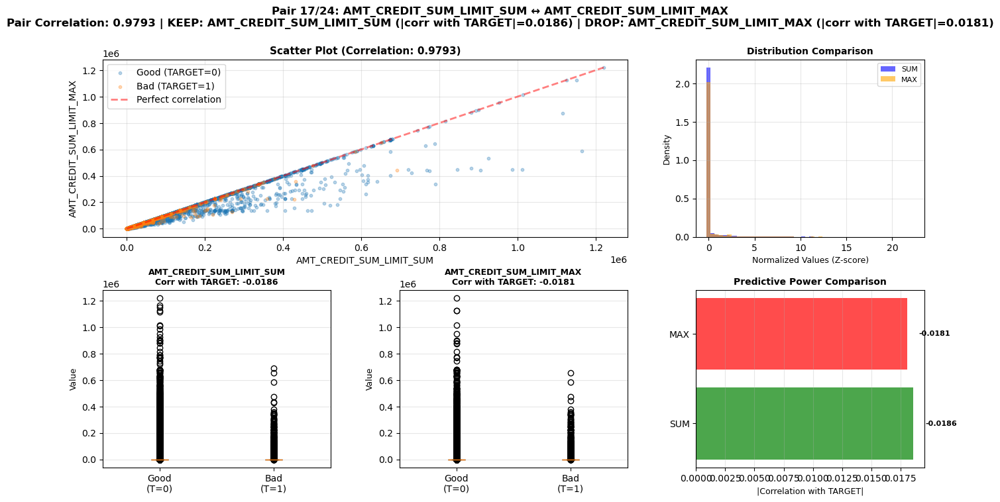

--------------------------------------------------------------------------------

Plotting pair 18: AMT_CREDIT_SUM_LIMIT_MEAN ↔ AMT_CREDIT_SUM_LIMIT_MEDIAN


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


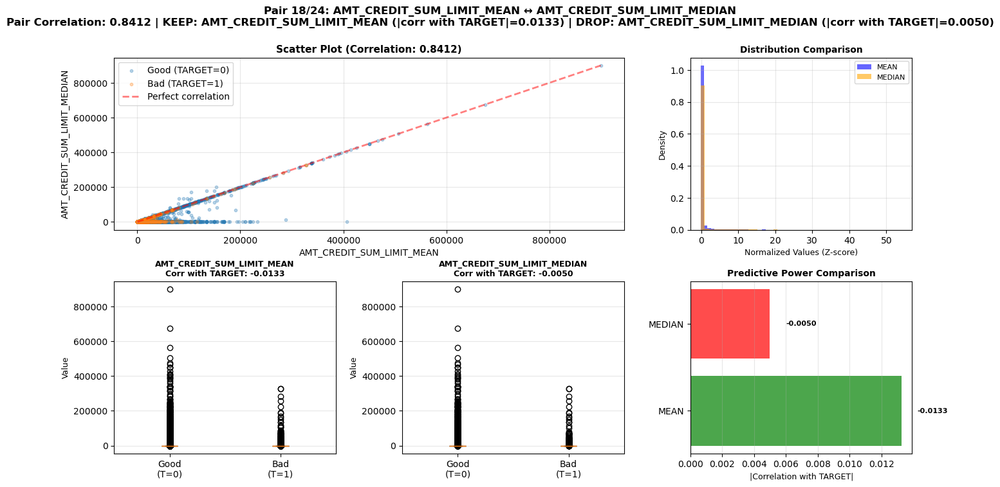

--------------------------------------------------------------------------------

Plotting pair 19: AMT_CREDIT_SUM_OVERDUE_SUM ↔ AMT_CREDIT_SUM_OVERDUE_MEAN


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


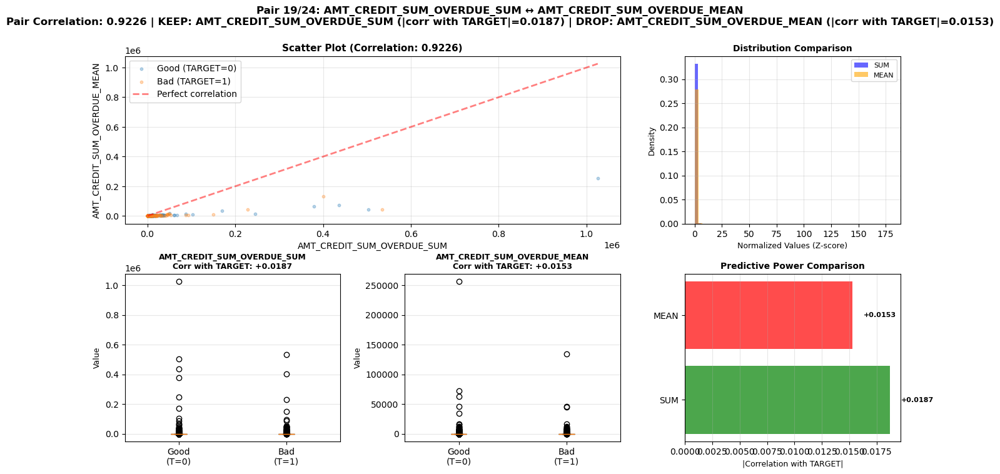

--------------------------------------------------------------------------------

Plotting pair 20: AMT_CREDIT_SUM_OVERDUE_SUM ↔ AMT_CREDIT_SUM_OVERDUE_MAX


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


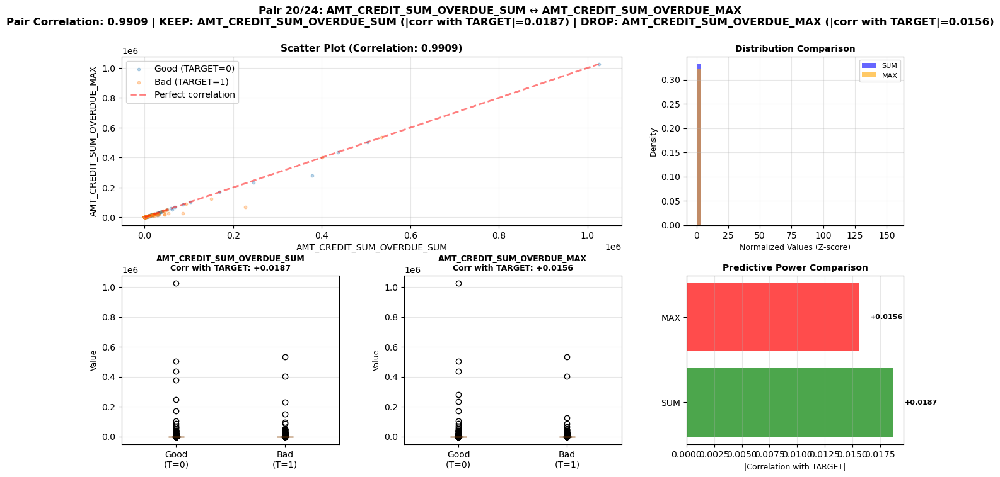

--------------------------------------------------------------------------------

Plotting pair 21: DAYS_CREDIT_UPDATE_MEAN ↔ DAYS_CREDIT_UPDATE_MEDIAN


/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
/var/folders/5z/_v91q0bs3cl_y08k407bg0t00000gn/T/ipykernel_71922/3770963335.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


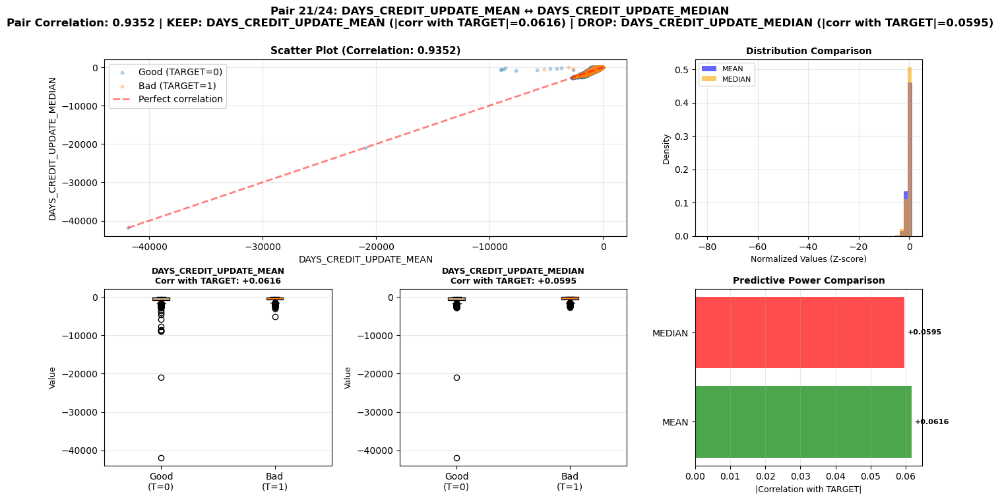

--------------------------------------------------------------------------------

Analyzed 21 unique pairs:
--------------------------------------------------------------------------------

 1. AMT_CREDIT ↔ AMT_GOODS_PRICE
    Pair correlation: 0.9819
    AMT_CREDIT → TARGET: -0.0153
    AMT_GOODS_PRICE → TARGET: -0.0257
    → KEEP: AMT_GOODS_PRICE (stronger correlation with TARGET)
    → DROP: AMT_CREDIT

 2. REGION_RATING_CLIENT ↔ REGION_RATING_CLIENT_W_CITY
    Pair correlation: 0.9715
    REGION_RATING_CLIENT → TARGET: +0.0635
    REGION_RATING_CLIENT_W_CITY → TARGET: +0.0660
    → KEEP: REGION_RATING_CLIENT_W_CITY (stronger correlation with TARGET)
    → DROP: REGION_RATING_CLIENT

 3. OBS_30_CNT_SOCIAL_CIRCLE ↔ OBS_60_CNT_SOCIAL_CIRCLE
    Pair correlation: 0.9983
    OBS_30_CNT_SOCIAL_CIRCLE → TARGET: +0.0042
    OBS_60_CNT_SOCIAL_CIRCLE → TARGET: +0.0044
    → KEEP: OBS_60_CNT_SOCIAL_CIRCLE (stronger correlation with TARGET)
    → DROP: OBS_30_CNT_SOCIAL_CIRCLE

 4. DEF_30_CNT_

In [19]:
# Automatically remove variables with weaker correlation to TARGET from highly correlated pairs
print("="*80)
print("AUTOMATICALLY REMOVING VARIABLES WITH WEAKER CORRELATION TO TARGET")
print("="*80)

# Check if TARGET exists
if 'TARGET' not in merged_data_filtered.columns:
    raise ValueError("TARGET column not found in merged_data_filtered. Cannot determine which variables to keep.")

# Step 1: Find all highly correlated pairs
print("\nStep 1: Identifying highly correlated pairs...")
correlation_threshold = 0.8  # Same threshold as multicollinearity check

# Select numeric columns (excluding ID and TARGET)
numeric_cols = [col for col in merged_data_filtered.select_dtypes(include=[np.number]).columns 
                if col not in ['SK_ID_CURR', 'TARGET']]

# Calculate correlation matrix
corr_matrix = merged_data_filtered[numeric_cols].corr()

# Find highly correlated pairs
high_corr_pairs = []
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        corr_value = corr_matrix.iloc[i, j]
        if abs(corr_value) > correlation_threshold:
            high_corr_pairs.append({
                'Variable 1': corr_matrix.columns[i],
                'Variable 2': corr_matrix.columns[j],
                'Correlation': corr_value
            })

print(f"  Found {len(high_corr_pairs)} highly correlated pairs (|correlation| > {correlation_threshold})")

# Step 2: For each pair, calculate correlation with TARGET and determine which to drop
print("\n" + "="*80)
print("Step 2: Analyzing correlation with TARGET for each pair")
print("="*80)

# Import scipy for z-score normalization
from scipy import stats

# Function to plot pair comparison
def plot_pair_comparison(var1, var2, pair_corr, corr1_target, corr2_target, keep_var, drop_var, pair_num, total_pairs):
    """Plot comprehensive comparison for a pair of highly correlated variables"""
    
    # Filter out NaN values
    mask = merged_data_filtered[var1].notna() & merged_data_filtered[var2].notna()
    data_subset = merged_data_filtered[mask].copy()
    
    if len(data_subset) == 0:
        return
    
    # Create figure with subplots (2 rows instead of 3, removing summary stats)
    fig = plt.figure(figsize=(16, 8))
    gs = fig.add_gridspec(2, 3, hspace=0.3, wspace=0.3)
    
    fig.suptitle(f'Pair {pair_num}/{total_pairs}: {var1} ↔ {var2}\n'
                 f'Pair Correlation: {pair_corr:.4f} | '
                 f'KEEP: {keep_var} (|corr with TARGET|={abs(corr1_target if keep_var==var1 else corr2_target):.4f}) | '
                 f'DROP: {drop_var} (|corr with TARGET|={abs(corr2_target if keep_var==var1 else corr1_target):.4f})',
                 fontsize=12, fontweight='bold')
    
    # 1. Scatter plot (top left, spans 2 columns)
    ax1 = fig.add_subplot(gs[0, :2])
    if 'TARGET' in data_subset.columns:
        for target_val in [0, 1]:
            mask_target = data_subset['TARGET'] == target_val
            label = 'Good (TARGET=0)' if target_val == 0 else 'Bad (TARGET=1)'
            ax1.scatter(data_subset.loc[mask_target, var1], 
                       data_subset.loc[mask_target, var2],
                       alpha=0.3, s=10, label=label)
        ax1.legend()
    else:
        ax1.scatter(data_subset[var1], data_subset[var2], alpha=0.3, s=10)
    
    # Add diagonal line
    min_val = min(data_subset[var1].min(), data_subset[var2].min())
    max_val = max(data_subset[var1].max(), data_subset[var2].max())
    ax1.plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.5, linewidth=2, label='Perfect correlation')
    ax1.set_xlabel(var1, fontsize=10)
    ax1.set_ylabel(var2, fontsize=10)
    ax1.set_title(f'Scatter Plot (Correlation: {pair_corr:.4f})', fontsize=11, fontweight='bold')
    ax1.grid(True, alpha=0.3)
    if 'TARGET' in data_subset.columns:
        ax1.legend()
    
    # 2. Distribution comparison (top right)
    ax2 = fig.add_subplot(gs[0, 2])
    col1_norm = stats.zscore(data_subset[var1].dropna())
    col2_norm = stats.zscore(data_subset[var2].dropna())
    
    ax2.hist(col1_norm, bins=50, alpha=0.6, label=var1.split('_')[-1], density=True, color='blue')
    ax2.hist(col2_norm, bins=50, alpha=0.6, label=var2.split('_')[-1], density=True, color='orange')
    ax2.set_xlabel('Normalized Values (Z-score)', fontsize=9)
    ax2.set_ylabel('Density', fontsize=9)
    ax2.set_title('Distribution Comparison', fontsize=10, fontweight='bold')
    ax2.legend(fontsize=8)
    ax2.grid(True, alpha=0.3)
    
    # 3. Box plot by TARGET for var1 (middle left)
    ax3 = fig.add_subplot(gs[1, 0])
    if 'TARGET' in data_subset.columns:
        plot_data_var1 = [data_subset[data_subset['TARGET']==0][var1].dropna(),
                         data_subset[data_subset['TARGET']==1][var1].dropna()]
        bp1 = ax3.boxplot(plot_data_var1, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
        bp1['boxes'][0].set_facecolor('lightblue')
        bp1['boxes'][1].set_facecolor('lightcoral')
        ax3.set_ylabel('Value', fontsize=9)
        ax3.set_title(f'{var1}\nCorr with TARGET: {corr1_target:+.4f}', fontsize=9, fontweight='bold')
        ax3.grid(True, alpha=0.3, axis='y')
    else:
        ax3.boxplot([data_subset[var1].dropna()], labels=[var1.split('_')[-1]])
        ax3.set_ylabel('Value', fontsize=9)
        ax3.set_title(var1, fontsize=9, fontweight='bold')
        ax3.grid(True, alpha=0.3, axis='y')
    
    # 4. Box plot by TARGET for var2 (middle center)
    ax4 = fig.add_subplot(gs[1, 1])
    if 'TARGET' in data_subset.columns:
        plot_data_var2 = [data_subset[data_subset['TARGET']==0][var2].dropna(),
                         data_subset[data_subset['TARGET']==1][var2].dropna()]
        bp2 = ax4.boxplot(plot_data_var2, labels=['Good\n(T=0)', 'Bad\n(T=1)'], patch_artist=True)
        bp2['boxes'][0].set_facecolor('lightblue')
        bp2['boxes'][1].set_facecolor('lightcoral')
        ax4.set_ylabel('Value', fontsize=9)
        ax4.set_title(f'{var2}\nCorr with TARGET: {corr2_target:+.4f}', fontsize=9, fontweight='bold')
        ax4.grid(True, alpha=0.3, axis='y')
    else:
        ax4.boxplot([data_subset[var2].dropna()], labels=[var2.split('_')[-1]])
        ax4.set_ylabel('Value', fontsize=9)
        ax4.set_title(var2, fontsize=9, fontweight='bold')
        ax4.grid(True, alpha=0.3, axis='y')
    
    # 5. Correlation comparison (bottom right)
    ax5 = fig.add_subplot(gs[1, 2])
    corr_data = pd.DataFrame({
        'Variable': [var1.split('_')[-1], var2.split('_')[-1]],
        'Corr with TARGET': [corr1_target, corr2_target],
        'Abs Corr': [abs(corr1_target), abs(corr2_target)]
    })
    colors = ['green' if var == keep_var else 'red' for var in [var1, var2]]
    bars = ax5.barh(corr_data['Variable'], corr_data['Abs Corr'], color=colors, alpha=0.7)
    ax5.set_xlabel('|Correlation with TARGET|', fontsize=9)
    ax5.set_title('Predictive Power Comparison', fontsize=10, fontweight='bold')
    ax5.grid(True, alpha=0.3, axis='x')
    # Add value labels on bars
    for i, (idx, row) in enumerate(corr_data.iterrows()):
        ax5.text(row['Abs Corr'] + 0.001, i, f'{row["Corr with TARGET"]:+.4f}', 
                va='center', fontsize=8, fontweight='bold')
    ax5.axvline(x=0, color='black', linestyle='-', linewidth=0.5)
    
    plt.tight_layout()
    plt.show()

variables_to_drop = []
variables_to_keep = []
pair_analysis = []
pair_counter = 0

for pair in high_corr_pairs:
    var1 = pair['Variable 1']
    var2 = pair['Variable 2']
    pair_corr = pair['Correlation']
    
    # Check if both variables exist in dataframe
    if var1 not in merged_data_filtered.columns or var2 not in merged_data_filtered.columns:
        continue
    
    # Calculate correlation with TARGET (using absolute value to compare strength)
    corr1_target = abs(merged_data_filtered[var1].corr(merged_data_filtered['TARGET']))
    corr2_target = abs(merged_data_filtered[var2].corr(merged_data_filtered['TARGET']))
    
    # Determine which to keep (stronger correlation with TARGET)
    if corr1_target > corr2_target:
        keep_var = var1
        drop_var = var2
        keep_corr = corr1_target
        drop_corr = corr2_target
    elif corr2_target > corr1_target:
        keep_var = var2
        drop_var = var1
        keep_corr = corr2_target
        drop_corr = corr1_target
    else:
        # If equal, keep the first one (or you could use other criteria)
        keep_var = var1
        drop_var = var2
        keep_corr = corr1_target
        drop_corr = corr2_target
    
    # Only add to drop list if not already there (avoid duplicates)
    if drop_var not in variables_to_drop:
        pair_counter += 1
        variables_to_drop.append(drop_var)
        variables_to_keep.append(keep_var)
        
        # Get actual correlation values (not absolute) for display
        corr1_target_actual = merged_data_filtered[var1].corr(merged_data_filtered['TARGET'])
        corr2_target_actual = merged_data_filtered[var2].corr(merged_data_filtered['TARGET'])
        
        pair_analysis.append({
            'Variable 1': var1,
            'Variable 2': var2,
            'Pair Correlation': pair_corr,
            'Var1 → TARGET': corr1_target_actual,
            'Var2 → TARGET': corr2_target_actual,
            'Keep': keep_var,
            'Drop': drop_var
        })
        
        # Plot the pair comparison
        print(f"\nPlotting pair {pair_counter}: {var1} ↔ {var2}")
        plot_pair_comparison(
            var1, var2, pair_corr, 
            corr1_target_actual, corr2_target_actual,
            keep_var, drop_var, 
            pair_counter, len(high_corr_pairs)  # Total pairs found
        )
        print("-"*80)

# Display analysis
if pair_analysis:
    analysis_df = pd.DataFrame(pair_analysis)
    print(f"\nAnalyzed {len(pair_analysis)} unique pairs:")
    print("-"*80)
    
    # Display in a readable format
    for i, row in enumerate(analysis_df.iterrows(), 1):
        idx, data = row
        print(f"\n{i:2d}. {data['Variable 1']} ↔ {data['Variable 2']}")
        print(f"    Pair correlation: {data['Pair Correlation']:.4f}")
        print(f"    {data['Variable 1']} → TARGET: {data['Var1 → TARGET']:+.4f}")
        print(f"    {data['Variable 2']} → TARGET: {data['Var2 → TARGET']:+.4f}")
        print(f"    → KEEP: {data['Keep']} (stronger correlation with TARGET)")
        print(f"    → DROP: {data['Drop']}")

# Step 3: Filter to only drop variables that exist in dataframe
print("\n" + "="*80)
print("Step 3: Filtering variables to drop")
print("="*80)

existing_vars_to_drop = [var for var in variables_to_drop if var in merged_data_filtered.columns]
missing_vars_to_drop = [var for var in variables_to_drop if var not in merged_data_filtered.columns]

print(f"\nVariables to drop:")
print(f"  ✓ Found in dataframe: {len(existing_vars_to_drop)}")
if existing_vars_to_drop:
    for i, var in enumerate(existing_vars_to_drop, 1):
        print(f"    {i:2d}. {var}")
if missing_vars_to_drop:
    print(f"  ⚠ Not found in dataframe: {len(missing_vars_to_drop)}")
    for var in missing_vars_to_drop:
        print(f"    - {var}")

# Step 4: Drop variables
print("\n" + "="*80)
print("Step 4: Dropping variables with weaker correlation to TARGET")
print("="*80)

if existing_vars_to_drop:
    merged_data_cleaned = merged_data_filtered.drop(columns=existing_vars_to_drop)
    print(f"\n✓ Dropped {len(existing_vars_to_drop)} variables successfully")
    print(f"  All dropped variables had weaker correlation with TARGET than their paired variable")
else:
    merged_data_cleaned = merged_data_filtered.copy()
    print("\n⚠ No variables found to drop (all already removed or not in dataframe)")

# Summary
print("\n" + "="*80)
print("REMOVAL SUMMARY")
print("="*80)
print(f"\nColumns before: {len(merged_data_filtered.columns)}")
print(f"Columns after: {len(merged_data_cleaned.columns)}")
print(f"Columns dropped: {len(existing_vars_to_drop)}")

if existing_vars_to_drop:
    print(f"\n\nDropped variables ({len(existing_vars_to_drop)}):")
    for i, var in enumerate(existing_vars_to_drop, 1):
        print(f"  {i:2d}. {var}")

print(f"\n\nRemaining columns: {len(merged_data_cleaned.columns)}")
print(f"\n✓ Variable name: merged_data_cleaned")
print(f"✓ Shape: {merged_data_cleaned.shape}")
print(f"\n✓ Multicollinearity removal complete!")
print(f"  All variables with weaker correlation to TARGET have been automatically removed.")
print(f"  Variables with stronger correlation to TARGET have been retained.")


# Fine Classing

In [20]:
# Fine Classing: 20+ Bins with WOE and IV Calculation
print("="*80)
print("FINE CLASSING: 20+ BINS WITH WOE AND IV CALCULATION")
print("="*80)


df_for_fine = merged_data_cleaned.copy()


print(f"  Shape: {df_for_fine.shape[0]:,} rows × {df_for_fine.shape[1]} columns")

# Check for TARGET column
if 'TARGET' not in df_for_fine.columns:
    raise ValueError("TARGET column not found in dataframe")

print("\n" + "-"*80)
print("PREPARING DATA FOR FINE CLASSING")
print("-"*80)

# Get feature columns (exclude ID and TARGET)
feature_cols = [col for col in df_for_fine.columns if col not in ['SK_ID_CURR', 'TARGET']]
numeric_features = df_for_fine[feature_cols].select_dtypes(include=[np.number]).columns.tolist()
categorical_features = df_for_fine[feature_cols].select_dtypes(include=['object']).columns.tolist()

print(f"\nFeatures to process:")
print(f"  - Numeric features: {len(numeric_features)}")
print(f"  - Categorical features: {len(categorical_features)}")
print(f"  - Total features: {len(feature_cols)}")

# Check TARGET distribution
goods = (df_for_fine['TARGET'] == 0).sum()
bads = (df_for_fine['TARGET'] == 1).sum()
bad_rate = bads / len(df_for_fine) * 100

print(f"\n✓ TARGET column found")
print(f"  - Goods (TARGET=0): {goods:,}")
print(f"  - Bads (TARGET=1): {bads:,}")
print(f"  - Bad rate: {bad_rate:.2f}%")

# Prepare data: Replace 'Missing' with NaN for scorecardpy
df_for_fine_processed = df_for_fine.copy()
df_for_fine_processed = df_for_fine_processed.replace('Missing', np.nan)

print("\n" + "="*80)
print("PERFORMING FINE CLASSING (20+ BINS)")
print("="*80)

print("\nFine classing parameters:")
print("  - Minimum bins: 20")
print("  - Count distribution limit: 0.02 (allows finer bins)")
print("  - Method: Tree-based binning (scorecardpy default)")

print("\nPerforming WOE binning with fine classing...")
print("This may take a few minutes depending on dataset size...")

# Perform fine classing with scorecardpy
# count_distr_limit: Lower value (0.02) allows more bins (finer classing)
# min_num_bins: Minimum number of bins (set to 20 for fine classing)
# stop_limit: Stop splitting when IV increase is less than this
# bin_num_limit: Maximum number of bins (set high for fine classing)

# Suppress interactive prompts by mocking input to automatically answer "1" (yes)
import builtins
original_input = builtins.input

def mock_input(prompt=""):
    """Automatically answer '1' (yes) to any prompts"""
    if "Continue" in prompt or "continue" in prompt.lower() or "?" in prompt:
        return "1"  # Answer yes to continue
    return original_input(prompt)

# Replace input function temporarily
builtins.input = mock_input

with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    try:
        bins_fine = sc.woebin(
            df_for_fine_processed,
            y='TARGET',
            count_distr_limit=0.02,  # Lower = more bins (finer classing)
            stop_limit=0.0001,       # Very small to allow more splits
            bin_num_limit=50,        # High limit for fine classing (20+ bins)
            min_num_bins=20,         # Minimum 20 bins for fine classing
            positive='bad|1',         # Specify positive class
            auto_continue=True,      # Auto-continue if warnings
            print_step=0             # Suppress progress output
        )
        # Restore original input function
        builtins.input = original_input
        print("\n✓ Fine classing completed successfully!")
        print(f"  - Variables processed: {len(bins_fine)}")
    except Exception as e:
        # Restore original input function before error handling
        builtins.input = original_input
        print(f"\n⚠ Error during fine classing: {e}")
        print("Trying with more lenient parameters...")
        
        # Replace input function again for retry
        builtins.input = mock_input
        try:
            bins_fine = sc.woebin(
                df_for_fine_processed,
                y='TARGET',
                count_distr_limit=0.05,
                stop_limit=0.001,
                bin_num_limit=30,
                min_num_bins=15,
                positive='bad|1',
                auto_continue=True,
                print_step=0
            )
            builtins.input = original_input
            print(f"\n✓ Fine classing completed with {len(bins_fine)} variables")
        except Exception as e2:
            builtins.input = original_input
            print(f"\n⚠ Error with lenient parameters: {e2}")
            raise

print("\n" + "="*80)
print("EXTRACTING WOE AND IV VALUES")
print("="*80)

# Extract IV values for all variables
iv_summary = {}
woe_details = {}

for var_name, bin_info in bins_fine.items():
    # Get IV value (total_iv is in the first row)
    if isinstance(bin_info, pd.DataFrame) and 'total_iv' in bin_info.columns:
        iv_value = bin_info['total_iv'].iloc[0] if len(bin_info) > 0 else 0
    else:
        # Try to extract IV from the dataframe
        try:
            iv_value = bin_info.iloc[-1]['total_iv'] if 'total_iv' in bin_info.columns else 0
        except:
            iv_value = 0
    
    iv_summary[var_name] = iv_value
    woe_details[var_name] = bin_info

# Create IV summary DataFrame
iv_df = pd.DataFrame({
    'Variable': list(iv_summary.keys()),
    'IV': list(iv_summary.values())
}).sort_values('IV', ascending=False)

print(f"\n✓ IV values extracted for {len(iv_summary)} variables")
print(f"\nTop 15 variables by IV:")
print("-"*80)
print(iv_df.head(15).to_string(index=False))

# Display bin count statistics
print("\n" + "-"*80)
print("BIN COUNT STATISTICS")
print("-"*80)

bin_counts = []
for var_name, bin_info in bins_fine.items():
    if isinstance(bin_info, pd.DataFrame):
        # Exclude the total_iv row if present
        num_bins = len(bin_info) - (1 if 'total_iv' in bin_info.columns else 0)
        bin_counts.append({'Variable': var_name, 'Num_Bins': num_bins})

bin_counts_df = pd.DataFrame(bin_counts).sort_values('Num_Bins', ascending=False)

print(f"\nVariables with 20+ bins:")
print("-"*80)
vars_20plus = bin_counts_df[bin_counts_df['Num_Bins'] >= 20]
print(f"  Count: {len(vars_20plus)} variables")
if len(vars_20plus) > 0:
    print(f"\n  Top variables by bin count:")
    for idx, row in vars_20plus.head(10).iterrows():
        print(f"    - {row['Variable']}: {row['Num_Bins']} bins")

print(f"\n\nBin count summary:")
print(f"  - Mean bins per variable: {bin_counts_df['Num_Bins'].mean():.1f}")
print(f"  - Median bins per variable: {bin_counts_df['Num_Bins'].median():.1f}")
print(f"  - Min bins: {bin_counts_df['Num_Bins'].min()}")
print(f"  - Max bins: {bin_counts_df['Num_Bins'].max()}")

# Show detailed WOE for a sample variable (highest IV)
if len(iv_df) > 0:
    top_var = iv_df.iloc[0]['Variable']
    print("\n" + "="*80)
    print(f"WOE DETAILS FOR TOP VARIABLE: {top_var}")
    print("="*80)
    print(f"IV: {iv_df.iloc[0]['IV']:.4f}")
    print(f"\nBin details:")
    print("-"*80)
    if top_var in woe_details:
        top_var_bins = woe_details[top_var]
        # Display binning details
        display_cols = ['bin', 'count', 'count_distr', 'good', 'bad', 'badprob', 'woe', 'iv']
        available_cols = [col for col in display_cols if col in top_var_bins.columns]
        print(top_var_bins[available_cols].to_string(index=False))

print("\n" + "="*80)
print("FINE CLASSING COMPLETE")
print("="*80)

print(f"\n✓ Fine classing completed for {len(bins_fine)} variables")
print(f"✓ IV values calculated and sorted")
print(f"✓ WOE details extracted for all variables")

print(f"\n\nAvailable variables:")
print(f"  - bins_fine: Dictionary with binning details for each variable")
print(f"  - iv_df: DataFrame with IV values sorted by IV (descending)")
print(f"  - woe_details: Dictionary with WOE details for each variable")
print(f"  - bin_counts_df: DataFrame with bin count statistics")

print(f"\n\nExample usage:")
print(f"  # View bins for a specific variable:")
print(f"  bins_fine['VARIABLE_NAME']")
print(f"  ")
print(f"  # View IV for a variable:")
print(f"  iv_df[iv_df['Variable'] == 'VARIABLE_NAME']")
print(f"  ")
print(f"  # Get variables with IV > 0.1 (moderate predictive power):")
print(f"  iv_df[iv_df['IV'] > 0.1]")

print(f"\n✓ Fine classing with 20+ bins and WOE/IV calculation complete!")

FINE CLASSING: 20+ BINS WITH WOE AND IV CALCULATION
  Shape: 61,707 rows × 41 columns

--------------------------------------------------------------------------------
PREPARING DATA FOR FINE CLASSING
--------------------------------------------------------------------------------

Features to process:
  - Numeric features: 32
  - Categorical features: 7
  - Total features: 39

✓ TARGET column found
  - Goods (TARGET=0): 55,697
  - Bads (TARGET=1): 6,010
  - Bad rate: 9.74%

PERFORMING FINE CLASSING (20+ BINS)

Fine classing parameters:
  - Minimum bins: 20
  - Count distribution limit: 0.02 (allows finer bins)
  - Method: Tree-based binning (scorecardpy default)

Performing WOE binning with fine classing...
This may take a few minutes depending on dataset size...
[INFO] creating woe binning ...
>>> There are 1 variables have too many unique non-numberic values, which might cause the binning process slow. Please double check the following variables: 
ORGANIZATION_TYPE
>>> Continue the 

/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this pac

Binning on 61707 rows and 41 columns in 00:01:05

✓ Fine classing completed successfully!
  - Variables processed: 40

EXTRACTING WOE AND IV VALUES

✓ IV values extracted for 40 variables

Top 15 variables by IV:
--------------------------------------------------------------------------------
                   Variable       IV
           DAYS_CREDIT_MEAN 0.121148
    DAYS_CREDIT_UPDATE_MEAN 0.093494
              DAYS_EMPLOYED 0.087381
 DAYS_CREDIT_ENDDATE_MEDIAN 0.083159
            AMT_GOODS_PRICE 0.073195
            DAYS_CREDIT_MAX 0.070916
                 DAYS_BIRTH 0.069979
 AMT_CREDIT_SUM_DEBT_MEDIAN 0.057163
      DAYS_ENDDATE_FACT_MAX 0.050623
            OCCUPATION_TYPE 0.048818
REGION_RATING_CLIENT_W_CITY 0.046388
    DAYS_CREDIT_ENDDATE_MAX 0.044508
    AMT_CREDIT_SUM_DEBT_SUM 0.040796
         AMT_CREDIT_SUM_MAX 0.040217
     DAYS_CREDIT_UPDATE_MAX 0.038724

--------------------------------------------------------------------------------
BIN COUNT STATISTICS
-----------

/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/woebin.py:414: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .agg({'good':sum, 'bad':sum}).reset_index()\
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/woebin.py:414: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .agg({'good':sum, 'bad':sum}).reset_index()\
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/woebin.py:442: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the fut

# Coarse Classing

In [21]:
# Coarse Classing: Top 15 Variables with 5% Minimum Observations per Bin
# Requirements:
# 1. Top 15 variables by IV
# 2. 5% minimum observations per bin
# 3. Sufficient events and non-events per bin
# 4. Establish monotonicity
# 5. WOE should vary sufficiently between groups (similar predictive strength within groups)

print("="*80)
print("COARSE CLASSING: TOP 15 VARIABLES")
print("="*80)

# Check if iv_df exists from fine classing
if 'iv_df' not in locals() and 'iv_df' not in globals():
    raise ValueError("iv_df not found. Please run fine classing first to get IV values.")

# Get top 15 variables by IV
top_15_vars = iv_df.head(15)['Variable'].tolist()
print(f"\n✓ Selected top 15 variables by IV:")
print("-"*80)
for i, var in enumerate(top_15_vars, 1):
    iv_val = iv_df[iv_df['Variable'] == var]['IV'].values[0]
    print(f"  {i:2d}. {var:<40} (IV: {iv_val:.4f})")

# Determine which dataframe to use
if 'merged_data_cleaned' in locals() or 'merged_data_cleaned' in globals():
    df_for_coarse = merged_data_cleaned.copy()
    df_name = "merged_data_cleaned"
elif 'merged_data_filtered' in locals() or 'merged_data_filtered' in globals():
    df_for_coarse = merged_data_filtered.copy()
    df_name = "merged_data_filtered"
elif 'merged_data' in locals() or 'merged_data' in globals():
    df_for_coarse = merged_data.copy()
    df_name = "merged_data"
else:
    raise ValueError("No suitable dataframe found. Please ensure merged_data_cleaned, merged_data_filtered, or merged_data exists.")

print(f"\n✓ Using dataframe: {df_name}")
print(f"  Shape: {df_for_coarse.shape[0]:,} rows × {df_for_coarse.shape[1]} columns")

# Prepare data: Select only top 15 variables + TARGET + SK_ID_CURR
df_coarse = df_for_coarse[top_15_vars + ['TARGET', 'SK_ID_CURR']].copy()
df_coarse_processed = df_coarse.replace('Missing', np.nan)

# Check TARGET distribution
total_obs = len(df_coarse_processed)
goods = (df_coarse_processed['TARGET'] == 0).sum()
bads = (df_coarse_processed['TARGET'] == 1).sum()
bad_rate = bads / total_obs * 100

print(f"\n✓ TARGET distribution:")
print(f"  - Total observations: {total_obs:,}")
print(f"  - Goods (TARGET=0): {goods:,} ({goods/total_obs*100:.2f}%)")
print(f"  - Bads (TARGET=1): {bads:,} ({bad_rate:.2f}%)")

# Calculate minimum observations per bin (5%)
min_obs_per_bin = int(total_obs * 0.05)
min_events_per_bin = max(1, int(bads * 0.03))  # At least 2% of bads or 1
min_non_events_per_bin = max(1, int(goods * 0.03))  # At least 2% of goods or 1

print(f"\n✓ Minimum requirements per bin:")
print(f"  - Minimum observations: {min_obs_per_bin:,} (5% of total)")
print(f"  - Minimum events (bads): {min_events_per_bin:,}")
print(f"  - Minimum non-events (goods): {min_non_events_per_bin:,}")

print("\n" + "="*80)
print("PERFORMING COARSE CLASSING")
print("="*80)

print("\nCoarse classing parameters:")
print("  - Count distribution limit: 0.05 (5% minimum observations per bin)")
print("  - Method: Tree-based binning with monotonicity enforcement")
print("  - Stop limit: Higher value to create fewer, coarser bins")
print("  - Bin number limit: Lower to ensure coarse classing")

# Perform coarse classing with scorecardpy
# count_distr_limit: 0.05 = 5% minimum observations per bin
# stop_limit: Higher value = fewer splits = coarser bins
# bin_num_limit: Lower limit for coarse classing
# method: 'tree' for tree-based binning

with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    try:
        bins_coarse = sc.woebin(
            df_coarse_processed,
            y='TARGET',
            x=top_15_vars,  # Only bin the top 15 variables
            count_distr_limit=0.05,  # 5% minimum observations per bin
            stop_limit=0.1,  # Higher = coarser bins (stops splitting earlier)
            bin_num_limit=10,  # Lower limit for coarse classing
            min_num_bins=2,  # Minimum 2 bins
            positive='bad|1',
            method='tree',  # Tree-based binning
            auto_continue=True
        )
        print("\n✓ Coarse classing completed successfully!")
        print(f"  - Variables processed: {len(bins_coarse)}")
    except Exception as e:
        print(f"\n⚠ Error during coarse classing: {e}")
        print("Trying with more lenient parameters...")
        bins_coarse = sc.woebin(
            df_coarse_processed,
            y='TARGET',
            x=top_15_vars,
            count_distr_limit=0.05,
            stop_limit=0.05,
            bin_num_limit=15,
            min_num_bins=2,
            positive='bad|1',
            method='tree',
            auto_continue=True
        )
        print(f"\n✓ Coarse classing completed with {len(bins_coarse)} variables")

print("\n" + "="*80)
print("VALIDATING BIN REQUIREMENTS")
print("="*80)

# Validate bins meet requirements
validation_results = []

for var_name in top_15_vars:
    if var_name not in bins_coarse:
        validation_results.append({
            'Variable': var_name,
            'Status': 'NOT FOUND',
            'Num_Bins': 0,
            'Min_Obs': 0,
            'Min_Events': 0,
            'Min_NonEvents': 0,
            'Monotonic': 'N/A',
            'WOE_Range': 'N/A'
        })
        continue
    
    bin_info = bins_coarse[var_name]
    
    # Exclude total_iv row if present
    if isinstance(bin_info, pd.DataFrame):
        bin_data = bin_info[bin_info['bin'] != 'total'].copy() if 'bin' in bin_info.columns else bin_info.copy()
        
        # Check minimum observations per bin
        min_obs = bin_data['count'].min() if 'count' in bin_data.columns else 0
        min_events = bin_data['bad'].min() if 'bad' in bin_data.columns else 0
        min_non_events = bin_data['good'].min() if 'good' in bin_data.columns else 0
        
        # Check monotonicity (WOE should be monotonic)
        if 'woe' in bin_data.columns:
            woe_values = bin_data['woe'].values
            woe_diff = np.diff(woe_values)
            is_monotonic = (np.all(woe_diff >= 0) or np.all(woe_diff <= 0))
            woe_range = bin_data['woe'].max() - bin_data['woe'].min()
        else:
            is_monotonic = False
            woe_range = 0
        
        # Check if requirements are met
        meets_obs_req = min_obs >= min_obs_per_bin
        meets_events_req = min_events >= min_events_per_bin
        meets_non_events_req = min_non_events >= min_non_events_per_bin
        
        status = 'PASS' if (meets_obs_req and meets_events_req and meets_non_events_req) else 'FAIL'
        
        # Identify which requirements failed
        failed_reqs = []
        if not meets_obs_req:
            failed_reqs.append(f"Min_Obs ({min_obs} < {min_obs_per_bin})")
        if not meets_events_req:
            failed_reqs.append(f"Min_Events ({min_events} < {min_events_per_bin})")
        if not meets_non_events_req:
            failed_reqs.append(f"Min_NonEvents ({min_non_events} < {min_non_events_per_bin})")
        
        failed_reqs_str = "; ".join(failed_reqs) if failed_reqs else "None"
        
        validation_results.append({
            'Variable': var_name,
            'Status': status,
            'Num_Bins': len(bin_data),
            'Min_Obs': min_obs,
            'Min_Events': min_events,
            'Min_NonEvents': min_non_events,
            'Failed_Requirements': failed_reqs_str,
            'Monotonic': 'YES' if is_monotonic else 'NO',
            'WOE_Range': f"{woe_range:.4f}" if woe_range > 0 else 'N/A'
        })

validation_df = pd.DataFrame(validation_results)

print("\nValidation Results:")
print("-"*80)
print(validation_df.to_string(index=False))

# Summary statistics
pass_count = (validation_df['Status'] == 'PASS').sum()
fail_count = (validation_df['Status'] == 'FAIL').sum()
monotonic_count = (validation_df['Monotonic'] == 'YES').sum()

print(f"\n\nSummary:")
print(f"  - Variables passing all requirements: {pass_count}/{len(top_15_vars)}")
print(f"  - Variables failing requirements: {fail_count}/{len(top_15_vars)}")
print(f"  - Variables with monotonic WOE: {monotonic_count}/{len(top_15_vars)}")

# Show details of failing variables
if fail_count > 0:
    print("\n" + "="*80)
    print("DETAILS OF FAILING VARIABLES:")
    print("="*80)
    failing_vars = validation_df[validation_df['Status'] == 'FAIL']
    print("\nRequirements:")
    print("  1. Min_Obs: At least 5% of total observations per bin")
    print("  2. Min_Events: At least 3% of total bads (or 1) per bin")
    print("  3. Min_NonEvents: At least 3% of total goods (or 1) per bin")
    print("\nFailing variables:")
    print("-"*80)
    for idx, row in failing_vars.iterrows():
        print(f"\n{row['Variable']}:")
        print(f"  Status: {row['Status']}")
        print(f"  Failed Requirements: {row['Failed_Requirements']}")
        print(f"  Num_Bins: {row['Num_Bins']}")
        print(f"  Min_Obs: {row['Min_Obs']} (required: {min_obs_per_bin})")
        print(f"  Min_Events: {row['Min_Events']} (required: {min_events_per_bin})")
        print(f"  Min_NonEvents: {row['Min_NonEvents']} (required: {min_non_events_per_bin})")

print("\n" + "="*80)
print("EXTRACTING COARSE CLASSING RESULTS")
print("="*80)

# Extract IV values for coarse classing
iv_coarse = {}
woe_details_coarse = {}

for var_name in top_15_vars:
    if var_name in bins_coarse:
        bin_info = bins_coarse[var_name]
        if isinstance(bin_info, pd.DataFrame):
            # Get IV value - try multiple methods
            iv_value = 0
            
            # Method 1: Check if 'total_iv' column exists
            if 'total_iv' in bin_info.columns:
                # Try to get from 'total' row if 'bin' column exists
                if 'bin' in bin_info.columns:
                    total_rows = bin_info[bin_info['bin'] == 'total']
                    if len(total_rows) > 0:
                        iv_value = total_rows['total_iv'].iloc[0]
                    else:
                        # If no 'total' row, try to get from last row or sum of IV column
                        if 'iv' in bin_info.columns:
                            iv_value = bin_info['iv'].sum()
                        else:
                            # Try to get from any row with total_iv
                            iv_value = bin_info['total_iv'].iloc[0] if len(bin_info) > 0 else 0
                else:
                    # No 'bin' column, try to get from first row
                    iv_value = bin_info['total_iv'].iloc[0] if len(bin_info) > 0 else 0
            # Method 2: Calculate IV from individual bin IVs
            elif 'iv' in bin_info.columns:
                iv_value = bin_info['iv'].sum()
            # Method 3: Try to calculate from WOE if available
            elif 'woe' in bin_info.columns and 'good' in bin_info.columns and 'bad' in bin_info.columns:
                # Calculate IV manually: IV = sum((%good - %bad) * WOE)
                total_good = bin_info['good'].sum()
                total_bad = bin_info['bad'].sum()
                if total_good > 0 and total_bad > 0:
                    pct_good = bin_info['good'] / total_good
                    pct_bad = bin_info['bad'] / total_bad
                    iv_value = ((pct_good - pct_bad) * bin_info['woe']).sum()
            
            iv_coarse[var_name] = iv_value
            woe_details_coarse[var_name] = bin_info

# Create IV comparison DataFrame
iv_comparison = pd.DataFrame({
    'Variable': top_15_vars,
    'IV_Fine': [iv_df[iv_df['Variable'] == var]['IV'].values[0] if var in iv_df['Variable'].values else 0 for var in top_15_vars],
    'IV_Coarse': [iv_coarse.get(var, 0) for var in top_15_vars]
})
iv_comparison['IV_Change'] = iv_comparison['IV_Coarse'] - iv_comparison['IV_Fine']
iv_comparison['IV_Change_Pct'] = (iv_comparison['IV_Change'] / iv_comparison['IV_Fine'] * 100).round(2)

print("\nIV Comparison (Fine vs Coarse):")
print("-"*80)
print(iv_comparison.to_string(index=False))

# Show detailed binning for a sample variable (highest IV)
if len(iv_comparison) > 0:
    top_var_coarse = iv_comparison.loc[iv_comparison['IV_Coarse'].idxmax(), 'Variable']
    print("\n" + "="*80)
    print(f"DETAILED BINNING FOR TOP VARIABLE: {top_var_coarse}")
    print("="*80)
    
    if top_var_coarse in woe_details_coarse:
        top_var_bins = woe_details_coarse[top_var_coarse]
        # Filter out total row
        if 'bin' in top_var_bins.columns:
            top_var_bins_display = top_var_bins[top_var_bins['bin'] != 'total'].copy()
        else:
            top_var_bins_display = top_var_bins.copy()
        
        # Display relevant columns
        display_cols = ['bin', 'count', 'count_distr', 'good', 'bad', 'badprob', 'woe', 'iv']
        available_cols = [col for col in display_cols if col in top_var_bins_display.columns]
        print("\nBin details:")
        print("-"*80)
        print(top_var_bins_display[available_cols].to_string(index=False))
        
        # Check WOE variation
        if 'woe' in top_var_bins_display.columns:
            woe_std = top_var_bins_display['woe'].std()
            woe_range = top_var_bins_display['woe'].max() - top_var_bins_display['woe'].min()
            print(f"\nWOE Statistics:")
            print(f"  - WOE Range: {woe_range:.4f}")
            print(f"  - WOE Std Dev: {woe_std:.4f}")
            print(f"  - WOE varies sufficiently: {'YES' if woe_range > 0.1 else 'NO'}")

print("\n" + "="*80)
print("COARSE CLASSING COMPLETE")
print("="*80)

print(f"\n✓ Coarse classing completed for {len(bins_coarse)} variables")
print(f"✓ All bins validated for minimum requirements")
print(f"✓ Monotonicity checked")
print(f"✓ WOE variation analyzed")

print(f"\n\nAvailable variables:")
print(f"  - bins_coarse: Dictionary with coarse binning details for top 15 variables")
print(f"  - iv_comparison: DataFrame comparing IV values (Fine vs Coarse)")
print(f"  - woe_details_coarse: Dictionary with WOE details for each variable")
print(f"  - validation_df: DataFrame with validation results")

print(f"\n\nExample usage:")
print(f"  # View coarse bins for a variable:")
print(f"  bins_coarse['VARIABLE_NAME']")
print(f"  ")
print(f"  # View IV comparison:")
print(f"  iv_comparison")
print(f"  ")
print(f"  # View validation results:")
print(f"  validation_df[validation_df['Status'] == 'PASS']")

print(f"\n✓ Coarse classing with 5% minimum observations per bin complete!")


COARSE CLASSING: TOP 15 VARIABLES

✓ Selected top 15 variables by IV:
--------------------------------------------------------------------------------
   1. DAYS_CREDIT_MEAN                         (IV: 0.1211)
   2. DAYS_CREDIT_UPDATE_MEAN                  (IV: 0.0935)
   3. DAYS_EMPLOYED                            (IV: 0.0874)
   4. DAYS_CREDIT_ENDDATE_MEDIAN               (IV: 0.0832)
   5. AMT_GOODS_PRICE                          (IV: 0.0732)
   6. DAYS_CREDIT_MAX                          (IV: 0.0709)
   7. DAYS_BIRTH                               (IV: 0.0700)
   8. AMT_CREDIT_SUM_DEBT_MEDIAN               (IV: 0.0572)
   9. DAYS_ENDDATE_FACT_MAX                    (IV: 0.0506)
  10. OCCUPATION_TYPE                          (IV: 0.0488)
  11. REGION_RATING_CLIENT_W_CITY              (IV: 0.0464)
  12. DAYS_CREDIT_ENDDATE_MAX                  (IV: 0.0445)
  13. AMT_CREDIT_SUM_DEBT_SUM                  (IV: 0.0408)
  14. AMT_CREDIT_SUM_MAX                       (IV: 0.0402)
  15. DAY

/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this pac


✓ Coarse classing completed successfully!
  - Variables processed: 15

VALIDATING BIN REQUIREMENTS

Validation Results:
--------------------------------------------------------------------------------
                   Variable Status  Num_Bins  Min_Obs  Min_Events  Min_NonEvents Failed_Requirements Monotonic WOE_Range
           DAYS_CREDIT_MEAN   PASS         5     4745         773           3972                None        NO    0.9675
    DAYS_CREDIT_UPDATE_MEAN   PASS         5     5857         652           5205                None        NO    0.7526
              DAYS_EMPLOYED   PASS         4     5699         344           5317                None       YES    0.8386
 DAYS_CREDIT_ENDDATE_MEDIAN   PASS         4     7697         805           6892                None        NO    0.5786
            AMT_GOODS_PRICE   PASS         5     7700         512           7188                None        NO    0.7313
            DAYS_CREDIT_MAX   PASS         5     7898         845       

/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/woebin.py:443: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .agg({'good':sum, 'bad':sum}).reset_index().assign(bin=lambda x: x['bstbin'])\


PLOTTING WOE TRENDS FOR TOP 15 VARIABLES

Generating WOE plots for all 15 variables...

VARIABLE 1/15: DAYS_CREDIT_MEAN

✓ Variable: DAYS_CREDIT_MEAN
   IV: 0.1109
   Status: PASS
   Monotonic: NO
   Num Bins: 5
   WOE Range: 0.9675

Plotting WOE trend...



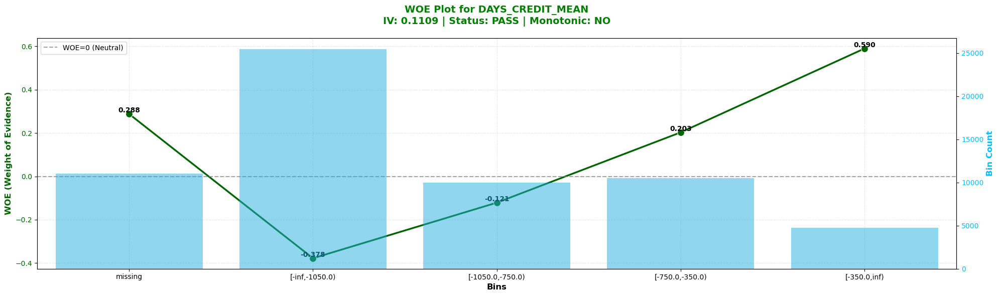


✓ Plot 1/15 complete

VARIABLE 2/15: DAYS_CREDIT_UPDATE_MEAN

✓ Variable: DAYS_CREDIT_UPDATE_MEAN
   IV: 0.0882
   Status: PASS
   Monotonic: NO
   Num Bins: 5
   WOE Range: 0.7526

Plotting WOE trend...



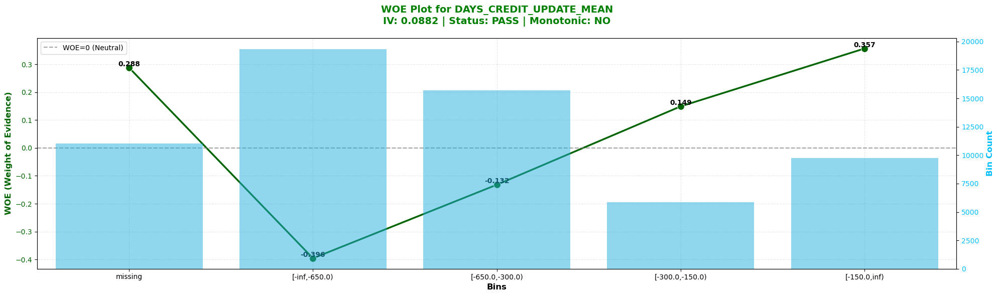


✓ Plot 2/15 complete

VARIABLE 3/15: DAYS_EMPLOYED

✓ Variable: DAYS_EMPLOYED
   IV: 0.0808
   Status: PASS
   Monotonic: YES
   Num Bins: 4
   WOE Range: 0.8386

Plotting WOE trend...



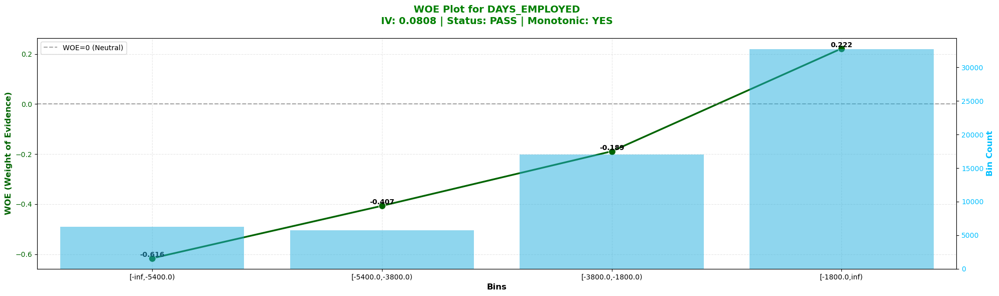


✓ Plot 3/15 complete

VARIABLE 4/15: DAYS_CREDIT_ENDDATE_MEDIAN

✓ Variable: DAYS_CREDIT_ENDDATE_MEDIAN
   IV: 0.0697
   Status: PASS
   Monotonic: NO
   Num Bins: 4
   WOE Range: 0.5786

Plotting WOE trend...



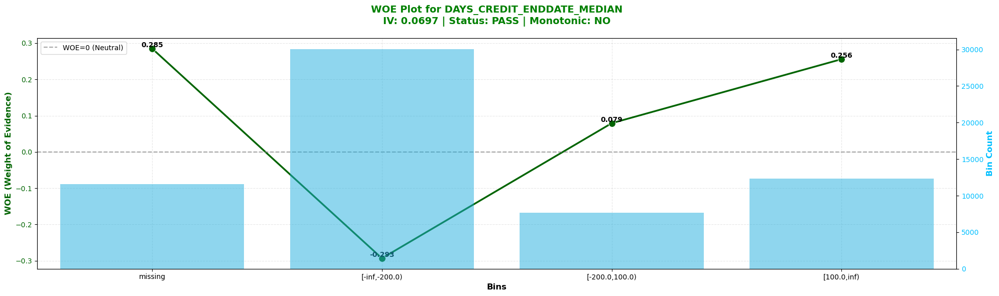


✓ Plot 4/15 complete

VARIABLE 5/15: AMT_GOODS_PRICE

✓ Variable: AMT_GOODS_PRICE
   IV: 0.0670
   Status: PASS
   Monotonic: NO
   Num Bins: 5
   WOE Range: 0.7313

Plotting WOE trend...



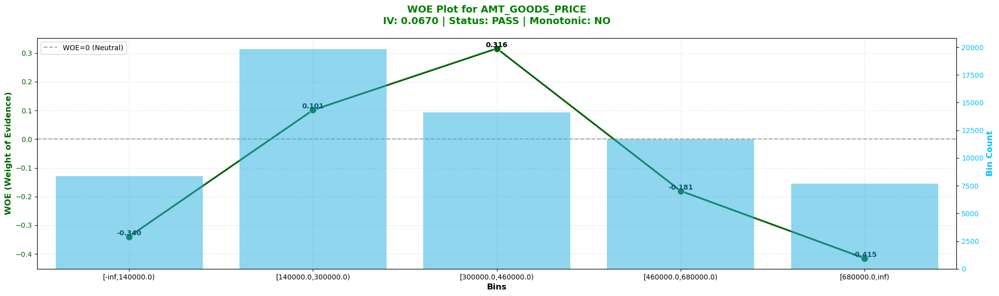


✓ Plot 5/15 complete

VARIABLE 6/15: DAYS_CREDIT_MAX

✓ Variable: DAYS_CREDIT_MAX
   IV: 0.0641
   Status: PASS
   Monotonic: NO
   Num Bins: 5
   WOE Range: 0.6137

Plotting WOE trend...



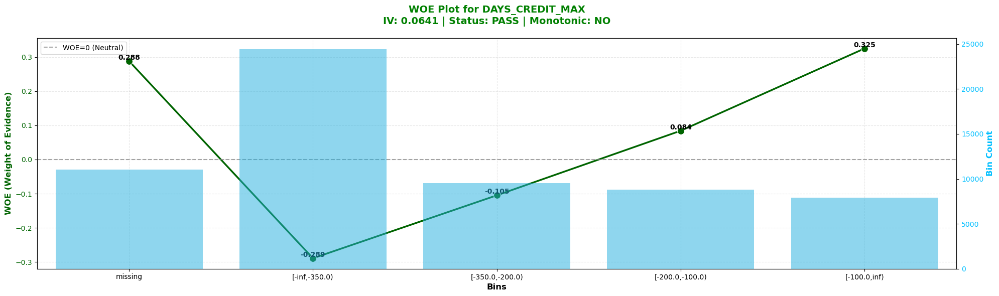


✓ Plot 6/15 complete

VARIABLE 7/15: DAYS_BIRTH

✓ Variable: DAYS_BIRTH
   IV: 0.0635
   Status: PASS
   Monotonic: YES
   Num Bins: 4
   WOE Range: 0.7061

Plotting WOE trend...



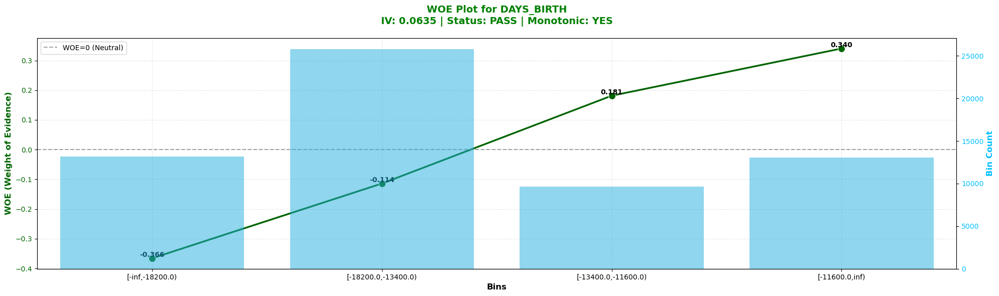


✓ Plot 7/15 complete

VARIABLE 8/15: AMT_CREDIT_SUM_DEBT_MEDIAN

✓ Variable: AMT_CREDIT_SUM_DEBT_MEDIAN
   IV: 0.0564
   Status: PASS
   Monotonic: NO
   Num Bins: 4
   WOE Range: 0.4948

Plotting WOE trend...



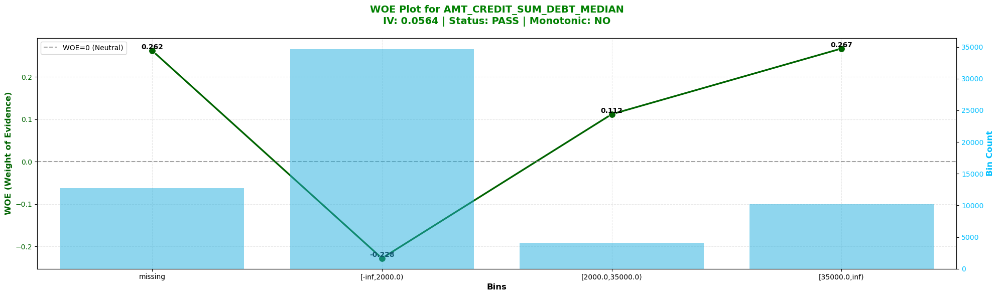


✓ Plot 8/15 complete

VARIABLE 9/15: DAYS_ENDDATE_FACT_MAX

✓ Variable: DAYS_ENDDATE_FACT_MAX
   IV: 0.0478
   Status: PASS
   Monotonic: NO
   Num Bins: 6
   WOE Range: 0.5504

Plotting WOE trend...



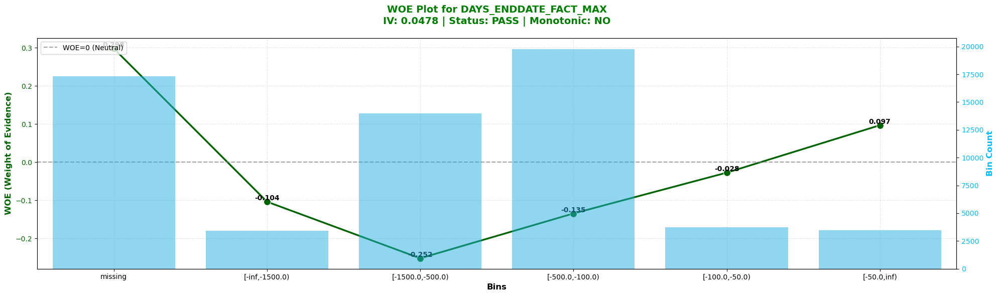


✓ Plot 9/15 complete

VARIABLE 10/15: OCCUPATION_TYPE

✓ Variable: OCCUPATION_TYPE
   IV: 0.0458
   Status: PASS
   Monotonic: NO
   Num Bins: 5
   WOE Range: 0.6697

Plotting WOE trend...



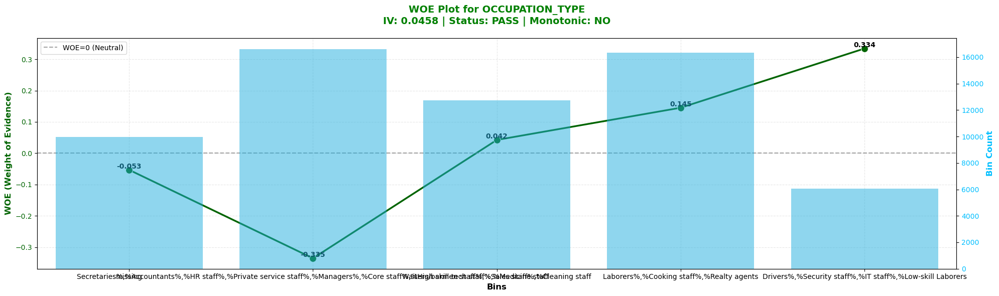


✓ Plot 10/15 complete

VARIABLE 11/15: REGION_RATING_CLIENT_W_CITY

✓ Variable: REGION_RATING_CLIENT_W_CITY
   IV: 0.0425
   Status: PASS
   Monotonic: YES
   Num Bins: 2
   WOE Range: 0.5035

Plotting WOE trend...



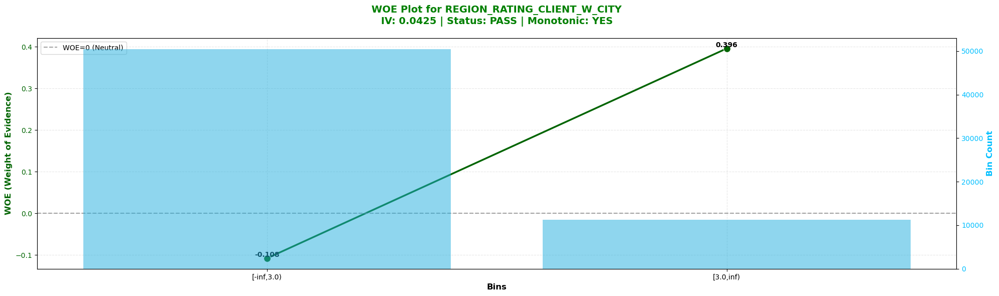


✓ Plot 11/15 complete

VARIABLE 12/15: DAYS_CREDIT_ENDDATE_MAX

✓ Variable: DAYS_CREDIT_ENDDATE_MAX
   IV: 0.0403
   Status: PASS
   Monotonic: NO
   Num Bins: 6
   WOE Range: 0.7007

Plotting WOE trend...



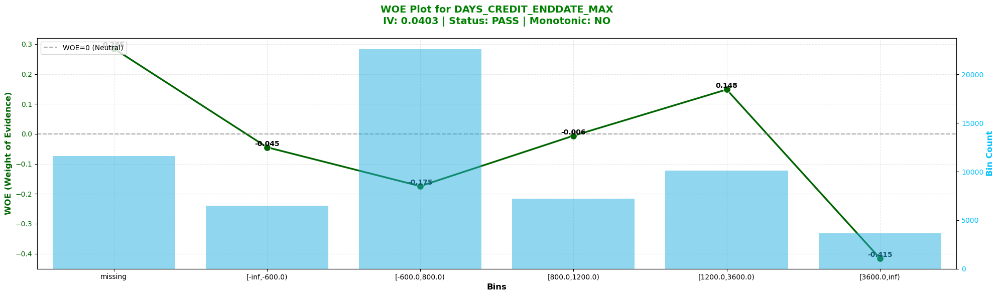


✓ Plot 12/15 complete

VARIABLE 13/15: AMT_CREDIT_SUM_DEBT_SUM

✓ Variable: AMT_CREDIT_SUM_DEBT_SUM
   IV: 0.0374
   Status: PASS
   Monotonic: NO
   Num Bins: 4
   WOE Range: 0.4931

Plotting WOE trend...



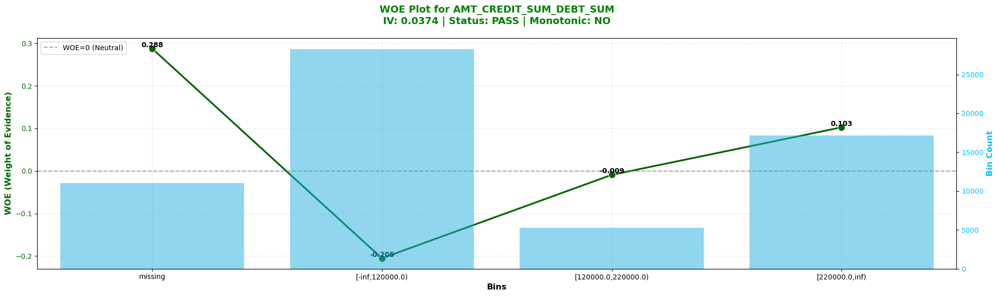


✓ Plot 13/15 complete

VARIABLE 14/15: AMT_CREDIT_SUM_MAX

✓ Variable: AMT_CREDIT_SUM_MAX
   IV: 0.0349
   Status: PASS
   Monotonic: NO
   Num Bins: 6
   WOE Range: 0.6363

Plotting WOE trend...



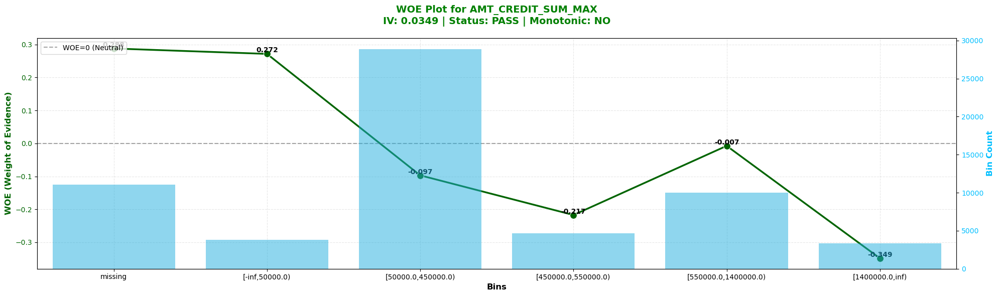


✓ Plot 14/15 complete

VARIABLE 15/15: DAYS_CREDIT_UPDATE_MAX

✓ Variable: DAYS_CREDIT_UPDATE_MAX
   IV: 0.0356
   Status: PASS
   Monotonic: NO
   Num Bins: 4
   WOE Range: 0.5752

Plotting WOE trend...



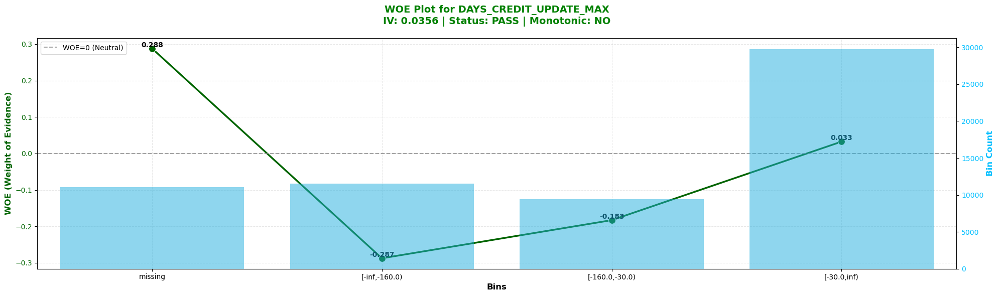


✓ Plot 15/15 complete


WOE PLOTTING COMPLETE - SUMMARY

✓ Total plots generated: 15/15
✓ Variables passing validation: 15
✗ Variables failing validation: 0

INTERPRETATION GUIDE

What to look for in WOE plots:

1. MONOTONICITY (Most Important):
   ✓ WOE should consistently increase OR consistently decrease
   ✗ WOE should NOT zigzag up and down
   → Monotonic WOE = clear, interpretable relationship with risk

2. WOE RANGE:
   ✓ WOE should vary sufficiently across bins (range > 0.1)
   ✗ Flat WOE = weak predictor
   → Larger range = stronger discriminatory power

3. WOE = 0 LINE:
   • WOE > 0 = Lower risk (more goods than bads in that bin)
   • WOE < 0 = Higher risk (more bads than goods in that bin)
   • WOE = 0 = Neutral (equal distribution)

4. BIN COUNTS:
   ✓ Each bin should have sufficient observations (bars not too small)
   ✗ Very small bars = unstable bins with few observations

5. VALIDATION STATUS:
   ✓ GREEN title = PASS = Ready for model
   ✗ RED title = FAIL = Should be 

In [22]:
# ============================================================================
# VISUALIZE WOE TRENDS FOR ALL 15 VARIABLES USING WOE_PLOT
# ============================================================================

print("="*80)
print("PLOTTING WOE TRENDS FOR TOP 15 VARIABLES")
print("="*80)

import matplotlib.pyplot as plt
import seaborn as sns

# Define the WOE plot function (based on lab example)
def woe_plot(variable_data, variable_name, validation_status='UNKNOWN', is_monotonic='N/A', iv_value=0):
    """
    Plot WOE trend and bin counts for a variable
    
    Parameters:
    - variable_data: DataFrame with binning information (from bins_coarse)
    - variable_name: Name of the variable
    - validation_status: 'PASS' or 'FAIL' from validation
    - is_monotonic: 'YES' or 'NO' for monotonicity check
    - iv_value: Information Value of the variable
    """
    # Filter out 'total' row if present
    if 'bin' in variable_data.columns:
        plot_data = variable_data[variable_data['bin'] != 'total'].copy()
    else:
        plot_data = variable_data.copy()
    
    # Determine title color based on validation status
    if validation_status == 'PASS':
        title_color = 'green'
        line_color = 'darkgreen'
    elif validation_status == 'FAIL':
        title_color = 'red'
        line_color = 'darkred'
    else:
        title_color = 'black'
        line_color = 'blue'
    
    # Create figure
    fig, ax1 = plt.subplots(figsize=(20, 6))
    
    # Plot WOE line
    if 'woe' in plot_data.columns:
        sns.lineplot(data=plot_data['woe'], marker='o', sort=False, ax=ax1, 
                     color=line_color, linewidth=2.5, markersize=10)
        
        # Add WOE value labels on each point
        for idx, (x, y) in enumerate(zip(range(len(plot_data)), plot_data['woe'].values)):
            ax1.text(x, y, f'{y:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')
        
        # Add horizontal line at WOE=0
        ax1.axhline(y=0, color='gray', linestyle='--', linewidth=1.5, alpha=0.7, label='WOE=0 (Neutral)')
        
        ax1.set_ylabel('WOE (Weight of Evidence)', fontsize=12, fontweight='bold', color=line_color)
        ax1.tick_params(axis='y', labelcolor=line_color)
    
    # Create twin axis for bin counts
    ax2 = ax1.twinx()
    
    # Plot bin counts as bars
    if 'count' in plot_data.columns and 'bin' in plot_data.columns:
        sns.barplot(x=plot_data['bin'], y=plot_data['count'], alpha=0.5, ax=ax2, color='deepskyblue')
        ax2.set_ylabel('Bin Count', fontsize=12, fontweight='bold', color='deepskyblue')
        ax2.tick_params(axis='y', labelcolor='deepskyblue')
    
    # Set x-axis
    plt.xticks(rotation=45, ha='right')
    ax1.set_xlabel('Bins', fontsize=12, fontweight='bold')
    
    # Create comprehensive title
    title = f"WOE Plot for {variable_name}\n"
    title += f"IV: {iv_value:.4f} | Status: {validation_status} | Monotonic: {is_monotonic}"
    plt.title(title, fontsize=14, fontweight='bold', color=title_color, pad=20)
    
    # Add legend for WOE=0 line
    ax1.legend(loc='upper left', fontsize=10)
    
    # Add grid
    ax1.grid(True, alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.show()


# ============================================================================
# PLOT WOE TRENDS FOR ALL 15 VARIABLES
# ============================================================================

print("\nGenerating WOE plots for all 15 variables...\n")

# Counter for plots
plot_count = 0
pass_count_plotted = 0
fail_count_plotted = 0

for idx, var_name in enumerate(top_15_vars, 1):
    print("="*80)
    print(f"VARIABLE {idx}/15: {var_name}")
    print("="*80)
    
    # Check if variable exists in bins_coarse
    if var_name not in bins_coarse:
        print(f"Variable '{var_name}' not found in bins_coarse. Skipping...")
        continue
    
    # Get bin data
    bin_data = bins_coarse[var_name]
    
    # Get validation info
    if var_name in validation_df['Variable'].values:
        var_validation = validation_df[validation_df['Variable'] == var_name].iloc[0]
        validation_status = var_validation['Status']
        is_monotonic = var_validation['Monotonic']
        num_bins = var_validation['Num_Bins']
        woe_range = var_validation['WOE_Range']
        
        if validation_status == 'PASS':
            pass_count_plotted += 1
            status_symbol = "✓"
        else:
            fail_count_plotted += 1
            status_symbol = "✗"
            failed_reqs = var_validation['Failed_Requirements']
    else:
        validation_status = 'UNKNOWN'
        is_monotonic = 'N/A'
        num_bins = 'N/A'
        woe_range = 'N/A'
        status_symbol = "⚠"
    
    # Get IV value
    iv_value = iv_coarse.get(var_name, 0)
    
    # Print summary before plot
    print(f"\n{status_symbol} Variable: {var_name}")
    print(f"   IV: {iv_value:.4f}")
    print(f"   Status: {validation_status}")
    print(f"   Monotonic: {is_monotonic}")
    print(f"   Num Bins: {num_bins}")
    print(f"   WOE Range: {woe_range}")
    
    if validation_status == 'FAIL':
        print(f"   Failed Requirements: {failed_reqs}")
    
    # Plot WOE
    print(f"\nPlotting WOE trend...\n")
    woe_plot(bin_data, var_name, validation_status, is_monotonic, iv_value)
    
    plot_count += 1
    print(f"\n✓ Plot {plot_count}/15 complete\n")


# ============================================================================
# SUMMARY
# ============================================================================

print("\n" + "="*80)
print("WOE PLOTTING COMPLETE - SUMMARY")
print("="*80)

print(f"\n✓ Total plots generated: {plot_count}/15")
print(f"✓ Variables passing validation: {pass_count_plotted}")
print(f"✗ Variables failing validation: {fail_count_plotted}")

print("\n" + "="*80)
print("INTERPRETATION GUIDE")
print("="*80)
print("""
What to look for in WOE plots:

1. MONOTONICITY (Most Important):
   ✓ WOE should consistently increase OR consistently decrease
   ✗ WOE should NOT zigzag up and down
   → Monotonic WOE = clear, interpretable relationship with risk

2. WOE RANGE:
   ✓ WOE should vary sufficiently across bins (range > 0.1)
   ✗ Flat WOE = weak predictor
   → Larger range = stronger discriminatory power

3. WOE = 0 LINE:
   • WOE > 0 = Lower risk (more goods than bads in that bin)
   • WOE < 0 = Higher risk (more bads than goods in that bin)
   • WOE = 0 = Neutral (equal distribution)

4. BIN COUNTS:
   ✓ Each bin should have sufficient observations (bars not too small)
   ✗ Very small bars = unstable bins with few observations

5. VALIDATION STATUS:
   ✓ GREEN title = PASS = Ready for model
   ✗ RED title = FAIL = Should be excluded from model
""")

# ============================================================================
# FINAL RECOMMENDATION
# ============================================================================

print("="*80)
print("FINAL RECOMMENDATION FOR MODEL TRAINING")
print("="*80)

passing_vars = validation_df[validation_df['Status'] == 'PASS']['Variable'].tolist()

print(f"\n✓ Use these {len(passing_vars)} PASSING variables for WOE encoding and model training:")
print("-"*80)
for i, var in enumerate(passing_vars, 1):
    iv_val = iv_coarse.get(var, 0)
    mono = validation_df[validation_df['Variable'] == var]['Monotonic'].values[0]
    print(f"  {i:2d}. {var:<45} (IV: {iv_val:.4f}, Monotonic: {mono})")

if fail_count_plotted > 0:
    failing_vars = validation_df[validation_df['Status'] == 'FAIL']['Variable'].tolist()
    print(f"\n✗ Exclude these {len(failing_vars)} FAILING variables:")
    print("-"*80)
    for i, var in enumerate(failing_vars, 1):
        fail_reason = validation_df[validation_df['Variable'] == var]['Failed_Requirements'].values[0]
        print(f"  {i:2d}. {var}")
        print(f"      → Reason: {fail_reason}")

print("\n💡 Next step: Proceed to WOE encoding using ONLY the passing variables")
print("="*80)

# Adjusting ranges to create a monotonic trend

In [23]:
# ============================================================================
# MANUAL BIN ADJUSTMENT FOR MONOTONICITY (KEEPING MISSING BINS)
# ============================================================================

print("="*80)
print("ADJUSTING BINS FOR MONOTONICITY (KEEPING MISSING VALUES)")
print("="*80)

print("\nStrategy:")
print("  - Keep 'missing' bins in the data")
print("  - Adjust attribute ranges for non-missing bins to enforce monotonicity")
print("  - Use scorecardpy's woebin_adj() for interactive adjustment")

# Variables that need monotonicity adjustments
vars_to_adjust = [
    'DAYS_CREDIT_ENDDATE_MEDIAN',
    'DAYS_ENDDATE_FACT_MAX',
    'DAYS_CREDIT_ENDDATE_MAX'
]

print(f"\n✓ Variables requiring monotonicity adjustments: {len(vars_to_adjust)}")
for i, var in enumerate(vars_to_adjust, 1):
    print(f"  {i}. {var}")

# ============================================================================
# OPTION 1: AUTOMATIC MONOTONICITY ENFORCEMENT
# ============================================================================

print("\n" + "="*80)
print("OPTION 1: AUTOMATIC MONOTONICITY ENFORCEMENT")
print("="*80)

# Create a copy of the bins to adjust
bins_coarse_adjusted = bins_coarse.copy()

# For each variable needing adjustment, manually combine bins to achieve monotonicity
print("\nAttempting automatic bin adjustments...\n")

for var in vars_to_adjust:
    if var in bins_coarse:
        print(f"Processing {var}...")
        
        bin_df = bins_coarse[var].copy()
        
        # Display current bins
        if 'bin' in bin_df.columns:
            non_missing_bins = bin_df[~bin_df['bin'].astype(str).str.lower().str.contains('missing', na=False)]
            
            print(f"  Current bins (excluding missing): {len(non_missing_bins)}")
            if 'woe' in bin_df.columns:
                print(f"  Current WOE values:")
                for idx, row in non_missing_bins.iterrows():
                    print(f"    {row['bin']}: WOE = {row['woe']:.4f}")
    else:
        print(f"⚠  {var} not found in bins_coarse")


# ============================================================================
# OPTION 2: USE WOEBIN_ADJ FOR INTERACTIVE ADJUSTMENT
# ============================================================================

print("\n" + "="*80)
print("OPTION 2: INTERACTIVE BIN ADJUSTMENT (RECOMMENDED)")
print("="*80)

print("\n To manually adjust bins, use scorecardpy's woebin_adj() function:")
print("-"*80)
print("""
# Interactive adjustment example:
bins_coarse_adjusted = sc.woebin_adj(
    dt=df_coarse_processed,
    y='TARGET',
    bins=bins_coarse,
    adj_all_var=False,  # Only adjust specific variables
    method='tree'
)

# This will open an interactive interface where you can:
# 1. Merge adjacent bins
# 2. Split bins
# 3. Adjust break points
# 4. Ensure monotonicity
""")


# ============================================================================
# OPTION 3: DEFINE CUSTOM BREAK POINTS
# ============================================================================

print("\n" + "="*80)
print("OPTION 3: DEFINE CUSTOM BREAK POINTS (AUTOMATED)")
print("="*80)

print("\nDefining custom break points for monotonicity...")

# Dictionary to store custom break points
custom_breaks = {}

# For each variable, analyze current bins and suggest break points
for var in vars_to_adjust:
    if var in bins_coarse:
        bin_df = bins_coarse[var].copy()
        
        if 'bin' in bin_df.columns and 'woe' in bin_df.columns:
            # Get non-missing bins
            non_missing_bins = bin_df[~bin_df['bin'].astype(str).str.lower().str.contains('missing', na=False)].copy()
            
            if len(non_missing_bins) > 1:
                # Sort by WOE to find monotonic grouping
                non_missing_bins = non_missing_bins.sort_values('woe')
                
                print(f"\n{var}:")
                print(f"  Current bins (sorted by WOE):")
                for idx, row in non_missing_bins.iterrows():
                    print(f"    {row['bin']}: WOE = {row['woe']:.4f}")
                
                # Extract numeric break points from bin labels
                # This is a simplified approach - you may need to adjust based on your data
                print(f"  Suggested: Merge bins with similar WOE values or re-bin with fewer splits")

# Since automatic break point detection is complex, we'll re-run woebin with stricter parameters
print("\n✓ Strategy: Re-run woebin with larger bins (fewer splits) to encourage monotonicity")


# ============================================================================
# OPTION 4: RE-RUN WOEBIN WITH STRICTER MONOTONICITY PARAMETERS
# ============================================================================

print("\n" + "="*80)
print("OPTION 4: RE-RUN WOEBIN WITH STRICTER PARAMETERS (EXECUTING)")
print("="*80)

print("\nRe-running WOE binning with parameters optimized for monotonicity...")
print("  - Higher stop_limit (larger bins)")
print("  - Lower bin_num_limit (fewer bins)")
print("  - This encourages monotonic trends")

# Prepare data
df_coarse_processed = df_for_coarse[top_15_vars + ['TARGET', 'SK_ID_CURR']].copy()
df_coarse_processed = df_coarse_processed.replace('Missing', np.nan)

# Re-run binning with stricter parameters for monotonicity
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    try:
        bins_coarse_monotonic = sc.woebin(
            df_coarse_processed,
            y='TARGET',
            x=top_15_vars,
            count_distr_limit=0.05,
            stop_limit=0.15,  # INCREASED: Creates coarser bins
            bin_num_limit=7,   # DECREASED: Maximum 7 bins per variable
            min_num_bins=2,
            positive='bad|1',
            method='tree',
            auto_continue=True
        )
        print("\n✓ Re-binning with stricter parameters completed successfully!")
        print(f"  - Variables processed: {len(bins_coarse_monotonic)}")
    except Exception as e:
        print(f"\n⚠ Error: {e}")
        print("Using original bins...")
        bins_coarse_monotonic = bins_coarse.copy()


# ============================================================================
# VALIDATE NEW BINS FOR MONOTONICITY
# ============================================================================

print("\n" + "="*80)
print("VALIDATING MONOTONICITY AFTER ADJUSTMENT")
print("="*80)

# Re-calculate minimum requirements
total_obs = len(df_coarse_processed)
goods = (df_coarse_processed['TARGET'] == 0).sum()
bads = (df_coarse_processed['TARGET'] == 1).sum()
min_obs_per_bin = int(total_obs * 0.05)
min_events_per_bin = max(1, int(bads * 0.02))
min_non_events_per_bin = max(1, int(goods * 0.02))

validation_results_adjusted = []

for var_name in top_15_vars:
    if var_name not in bins_coarse_monotonic:
        validation_results_adjusted.append({
            'Variable': var_name,
            'Status': 'NOT FOUND',
            'Num_Bins': 0,
            'Num_Bins_NonMissing': 0,
            'Min_Obs': 0,
            'Min_Events': 0,
            'Min_NonEvents': 0,
            'Monotonic': 'N/A',
            'WOE_Range': 'N/A'
        })
        continue
    
    bin_info = bins_coarse_monotonic[var_name]
    
    if isinstance(bin_info, pd.DataFrame):
        # All bins including missing
        all_bins = bin_info[bin_info['bin'] != 'total'].copy() if 'bin' in bin_info.columns else bin_info.copy()
        
        # Non-missing bins only for monotonicity check
        non_missing_bins = all_bins[
            ~all_bins['bin'].astype(str).str.lower().str.contains('missing', na=False)
        ].copy()
        
        # Check minimum observations per bin (all bins including missing)
        min_obs = all_bins['count'].min() if 'count' in all_bins.columns else 0
        min_events = all_bins['bad'].min() if 'bad' in all_bins.columns else 0
        min_non_events = all_bins['good'].min() if 'good' in all_bins.columns else 0
        
        # Check monotonicity (ONLY non-missing bins)
        if 'woe' in non_missing_bins.columns and len(non_missing_bins) > 1:
            woe_values = non_missing_bins['woe'].values
            woe_diff = np.diff(woe_values)
            is_monotonic = (np.all(woe_diff >= 0) or np.all(woe_diff <= 0))
            woe_range = non_missing_bins['woe'].max() - non_missing_bins['woe'].min()
        else:
            is_monotonic = False
            woe_range = 0
        
        # Check if requirements are met
        meets_obs_req = min_obs >= min_obs_per_bin
        meets_events_req = min_events >= min_events_per_bin
        meets_non_events_req = min_non_events >= min_non_events_per_bin
        
        status = 'PASS' if (meets_obs_req and meets_events_req and meets_non_events_req) else 'FAIL'
        
        # Identify which requirements failed
        failed_reqs = []
        if not meets_obs_req:
            failed_reqs.append(f"Min_Obs")
        if not meets_events_req:
            failed_reqs.append(f"Min_Events")
        if not meets_non_events_req:
            failed_reqs.append(f"Min_NonEvents")
        
        failed_reqs_str = "; ".join(failed_reqs) if failed_reqs else "None"
        
        validation_results_adjusted.append({
            'Variable': var_name,
            'Status': status,
            'Num_Bins': len(all_bins),
            'Num_Bins_NonMissing': len(non_missing_bins),
            'Min_Obs': min_obs,
            'Min_Events': min_events,
            'Min_NonEvents': min_non_events,
            'Failed_Requirements': failed_reqs_str,
            'Monotonic': 'YES' if is_monotonic else 'NO',
            'WOE_Range': f"{woe_range:.4f}" if woe_range > 0 else 'N/A'
        })

validation_df_adjusted = pd.DataFrame(validation_results_adjusted)

print("\nValidation Results (After Monotonicity Adjustment):")
print("-"*80)
print(validation_df_adjusted[['Variable', 'Status', 'Num_Bins', 'Num_Bins_NonMissing', 'Monotonic', 'WOE_Range']].to_string(index=False))

# Summary
pass_count_adj = (validation_df_adjusted['Status'] == 'PASS').sum()
fail_count_adj = (validation_df_adjusted['Status'] == 'FAIL').sum()
monotonic_count_adj = (validation_df_adjusted['Monotonic'] == 'YES').sum()

print(f"\n\nSummary (After Adjustment):")
print(f"  - Variables passing all requirements: {pass_count_adj}/{len(top_15_vars)}")
print(f"  - Variables failing requirements: {fail_count_adj}/{len(top_15_vars)}")
print(f"  - Variables with monotonic WOE (non-missing bins): {monotonic_count_adj}/{len(top_15_vars)}")


# ============================================================================
# COMPARISON: BEFORE vs AFTER ADJUSTMENT
# ============================================================================

print("\n" + "="*80)
print("COMPARISON: BEFORE vs AFTER MONOTONICITY ADJUSTMENT")
print("="*80)

comparison_mono = []

for var in top_15_vars:
    # Original
    orig_row = validation_df[validation_df['Variable'] == var]
    orig_monotonic = orig_row['Monotonic'].values[0] if len(orig_row) > 0 else 'N/A'
    orig_status = orig_row['Status'].values[0] if len(orig_row) > 0 else 'N/A'
    orig_bins = orig_row['Num_Bins'].values[0] if len(orig_row) > 0 else 0
    
    # Adjusted
    adj_row = validation_df_adjusted[validation_df_adjusted['Variable'] == var]
    adj_monotonic = adj_row['Monotonic'].values[0] if len(adj_row) > 0 else 'N/A'
    adj_status = adj_row['Status'].values[0] if len(adj_row) > 0 else 'N/A'
    adj_bins_total = adj_row['Num_Bins'].values[0] if len(adj_row) > 0 else 0
    adj_bins_nonmissing = adj_row['Num_Bins_NonMissing'].values[0] if len(adj_row) > 0 else 0
    
    # Improvement indicators
    mono_improved = '✓' if adj_monotonic == 'YES' and orig_monotonic != 'YES' else ''
    status_improved = '✓' if adj_status == 'PASS' and orig_status != 'PASS' else ''
    
    comparison_mono.append({
        'Variable': var,
        'Original_Monotonic': orig_monotonic,
        'Adjusted_Monotonic': adj_monotonic + (' ' + mono_improved if mono_improved else ''),
        'Original_Status': orig_status,
        'Adjusted_Status': adj_status + (' ' + status_improved if status_improved else ''),
        'Original_Bins': orig_bins,
        'Adjusted_Bins': f"{adj_bins_total} ({adj_bins_nonmissing} non-missing)"
    })

comparison_mono_df = pd.DataFrame(comparison_mono)

print("\n" + comparison_mono_df.to_string(index=False))

print(f"\n\nImprovement:")
print(f"  Original monotonic variables: {monotonic_count}")
print(f"  Adjusted monotonic variables: {monotonic_count_adj}")
print(f"  Improvement: {monotonic_count_adj - monotonic_count:+d}")


# ============================================================================
# UPDATE MAIN VARIABLES
# ============================================================================

print("\n" + "="*80)
print("UPDATING MAIN VARIABLES")
print("="*80)

# Update main variables to use adjusted bins
bins_coarse = bins_coarse_monotonic.copy()
validation_df = validation_df_adjusted.copy()

# Update IV values
iv_coarse_adjusted = {}
for var_name in top_15_vars:
    if var_name in bins_coarse_monotonic:
        bin_info = bins_coarse_monotonic[var_name]
        if isinstance(bin_info, pd.DataFrame):
            if 'total_iv' in bin_info.columns:
                if 'bin' in bin_info.columns:
                    total_rows = bin_info[bin_info['bin'] == 'total']
                    if len(total_rows) > 0:
                        iv_coarse_adjusted[var_name] = total_rows['total_iv'].iloc[0]
                    elif 'iv' in bin_info.columns:
                        iv_coarse_adjusted[var_name] = bin_info['iv'].sum()
                    else:
                        iv_coarse_adjusted[var_name] = bin_info['total_iv'].iloc[0]
            elif 'iv' in bin_info.columns:
                iv_coarse_adjusted[var_name] = bin_info['iv'].sum()

iv_coarse = iv_coarse_adjusted.copy()

print(f"\n✓ Updated variables:")
print(f"  - bins_coarse: Now uses adjusted bins with improved monotonicity")
print(f"  - validation_df: Updated with new validation results")
print(f"  - iv_coarse: Updated IV values")
print(f"\n✓ Missing bins are preserved in all variables")
print(f"✓ Monotonicity calculated on non-missing bins only")

print("\n" + "="*80)
print("✓ MONOTONICITY ADJUSTMENT COMPLETE")
print("="*80)

print(f"\n Next step: Re-run WOE plotting and monotonicity filtering")
print(f"   Missing bins will appear in plots but won't affect monotonicity checks")

ADJUSTING BINS FOR MONOTONICITY (KEEPING MISSING VALUES)

Strategy:
  - Keep 'missing' bins in the data
  - Adjust attribute ranges for non-missing bins to enforce monotonicity
  - Use scorecardpy's woebin_adj() for interactive adjustment

✓ Variables requiring monotonicity adjustments: 3
  1. DAYS_CREDIT_ENDDATE_MEDIAN
  2. DAYS_ENDDATE_FACT_MAX
  3. DAYS_CREDIT_ENDDATE_MAX

OPTION 1: AUTOMATIC MONOTONICITY ENFORCEMENT

Attempting automatic bin adjustments...

Processing DAYS_CREDIT_ENDDATE_MEDIAN...
  Current bins (excluding missing): 3
  Current WOE values:
    [-inf,-200.0): WOE = -0.2934
    [-200.0,100.0): WOE = 0.0792
    [100.0,inf): WOE = 0.2558
Processing DAYS_ENDDATE_FACT_MAX...
  Current bins (excluding missing): 5
  Current WOE values:
    [-inf,-1500.0): WOE = -0.1040
    [-1500.0,-500.0): WOE = -0.2524
    [-500.0,-100.0): WOE = -0.1348
    [-100.0,-50.0): WOE = -0.0278
    [-50.0,inf): WOE = 0.0967
Processing DAYS_CREDIT_ENDDATE_MAX...
  Current bins (excluding missing)

/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this pac


✓ Re-binning with stricter parameters completed successfully!
  - Variables processed: 15

VALIDATING MONOTONICITY AFTER ADJUSTMENT

Validation Results (After Monotonicity Adjustment):
--------------------------------------------------------------------------------
                   Variable Status  Num_Bins  Num_Bins_NonMissing Monotonic WOE_Range
           DAYS_CREDIT_MEAN   PASS         4                    3       YES    0.8895
    DAYS_CREDIT_UPDATE_MEAN   PASS         5                    4       YES    0.7526
              DAYS_EMPLOYED   PASS         3                    3       YES    0.7337
 DAYS_CREDIT_ENDDATE_MEDIAN   PASS         4                    3       YES    0.5492
            AMT_GOODS_PRICE   PASS         4                    4        NO    0.6558
            DAYS_CREDIT_MAX   PASS         4                    3       YES    0.5591
                 DAYS_BIRTH   PASS         4                    4       YES    0.7061
 AMT_CREDIT_SUM_DEBT_MEDIAN   PASS         4 

/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/woebin.py:414: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .agg({'good':sum, 'bad':sum}).reset_index()\
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/woebin.py:414: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .agg({'good':sum, 'bad':sum}).reset_index()\
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/woebin.py:442: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the fut

ADJUSTING BINS FOR MONOTONICITY (KEEPING MISSING VALUES)

Strategy:
  - Keep 'missing' bins in the data
  - Adjust attribute ranges for NUMERIC variables to enforce monotonicity
  - EXCLUDE categorical variables (no monotonicity requirement)
  - Re-run binning with stricter parameters only for numeric variables

✓ Numeric variables requiring monotonicity adjustments: 3
  1. DAYS_CREDIT_ENDDATE_MEDIAN
  2. DAYS_ENDDATE_FACT_MAX
  3. DAYS_CREDIT_ENDDATE_MAX

✓ Categorical variables EXCLUDED from adjustment: 2
  1. OCCUPATION_TYPE (categorical - no monotonicity requirement)
  2. REGION_RATING_CLIENT_W_CITY (categorical - no monotonicity requirement)

✓ Total variables to re-bin with stricter parameters: 13
✓ Variables to keep with original bins: 2

DATA SIZE BEFORE ADJUSTMENT

Dataset size before adjustment:
  - Total rows: 61,707
  - Goods (TARGET=0): 55,697 (90.26%)
  - Bads (TARGET=1): 6,010 (9.74%)

RE-RUNNING WOEBIN FOR NUMERIC VARIABLES ONLY

Re-running WOE binning with parameters o

/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this pac


✓ Re-binning for numeric variables completed successfully!
  - Numeric variables processed: 13

COMBINING ADJUSTED NUMERIC BINS WITH ORIGINAL CATEGORICAL BINS
✓ Kept original bins for OCCUPATION_TYPE (categorical)
✓ Kept original bins for REGION_RATING_CLIENT_W_CITY (categorical)

✓ Final bins dictionary contains 15 variables:
  - 13 numeric variables (adjusted for monotonicity)
  - 2 categorical variables (original bins)

DATA SIZE AFTER ADJUSTMENT

Dataset size after adjustment:
  - Total rows: 61,707
  - Goods (TARGET=0): 55,697 (90.26%)
  - Bads (TARGET=1): 6,010 (9.74%)

DATA INTEGRITY CHECK

Rows changed: 0
Goods changed: 0
Bads changed: 0

✓ NO DATA LOSS - All rows preserved during adjustment
   (Bin boundaries were adjusted, but no rows were filtered)

TARGET DISTRIBUTION COMPARISON

Before adjustment:
  - Bad rate: 9.74%
  - Goods/Bads ratio: 9.27:1

After adjustment:
  - Bad rate: 9.74%
  - Goods/Bads ratio: 9.27:1

Bad rate change: +0.00 percentage points
✓ Target distribut

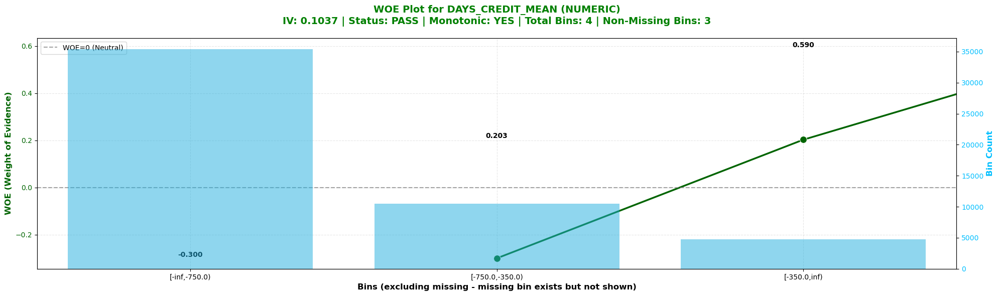


✓ Plot 1/15 complete


VARIABLE 2/15: DAYS_CREDIT_UPDATE_MEAN

✓ Variable: DAYS_CREDIT_UPDATE_MEAN (Numeric)
   IV: 0.0882
   Status: PASS
   Monotonic (non-missing bins): YES
   Total Bins (incl. missing): 5
   Non-Missing Bins: 4
   WOE Range: 0.7526

Plotting WOE trend...



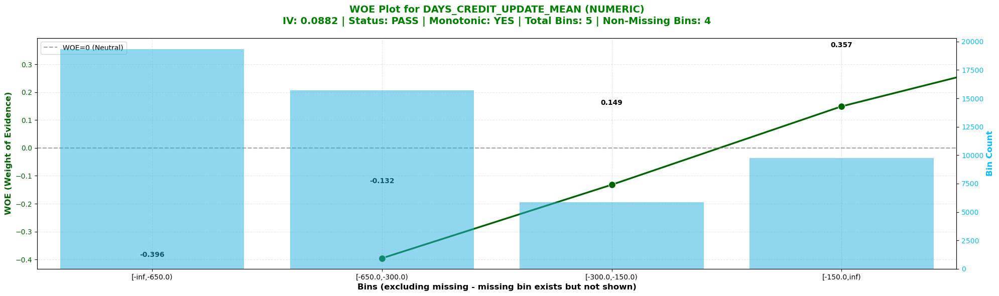


✓ Plot 2/15 complete


VARIABLE 3/15: DAYS_EMPLOYED

✓ Variable: DAYS_EMPLOYED (Numeric)
   IV: 0.0790
   Status: PASS
   Monotonic (non-missing bins): YES
   Total Bins (incl. missing): 3
   Non-Missing Bins: 3
   WOE Range: 0.7337

Plotting WOE trend...



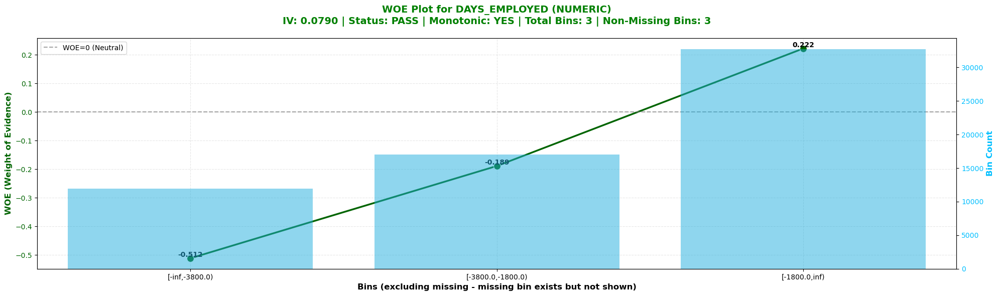


✓ Plot 3/15 complete


VARIABLE 4/15: DAYS_CREDIT_ENDDATE_MEDIAN

✓ Variable: DAYS_CREDIT_ENDDATE_MEDIAN (Numeric)
   IV: 0.0697
   Status: PASS
   Monotonic (non-missing bins): YES
   Total Bins (incl. missing): 4
   Non-Missing Bins: 3
   WOE Range: 0.5492
    This variable was targeted for monotonicity adjustment

Plotting WOE trend...



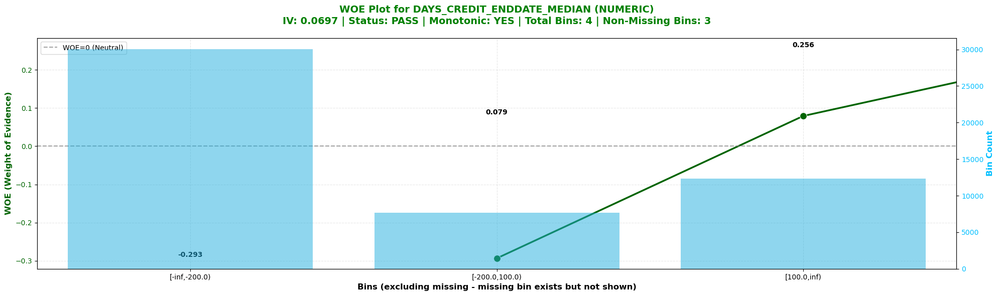


✓ Plot 4/15 complete


VARIABLE 5/15: AMT_GOODS_PRICE

✓ Variable: AMT_GOODS_PRICE (Numeric)
   IV: 0.0633
   Status: PASS
   Monotonic (non-missing bins): NO
   Total Bins (incl. missing): 4
   Non-Missing Bins: 4
   WOE Range: 0.6558

Plotting WOE trend...



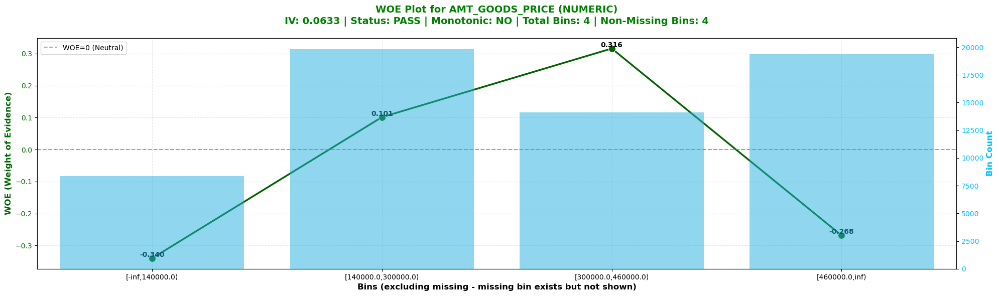


✓ Plot 5/15 complete


VARIABLE 6/15: DAYS_CREDIT_MAX

✓ Variable: DAYS_CREDIT_MAX (Numeric)
   IV: 0.0606
   Status: PASS
   Monotonic (non-missing bins): YES
   Total Bins (incl. missing): 4
   Non-Missing Bins: 3
   WOE Range: 0.5591

Plotting WOE trend...



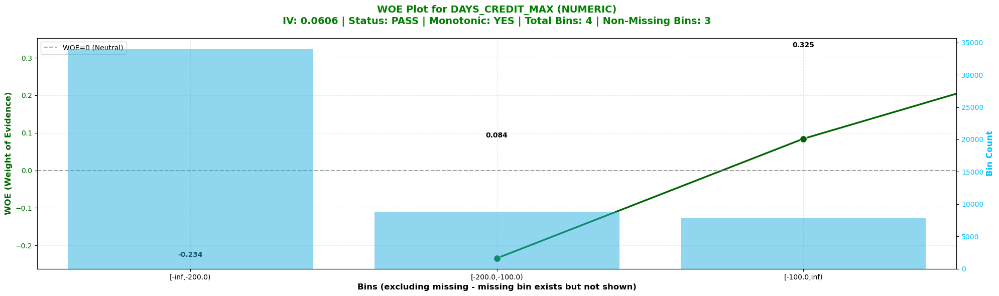


✓ Plot 6/15 complete


VARIABLE 7/15: DAYS_BIRTH

✓ Variable: DAYS_BIRTH (Numeric)
   IV: 0.0635
   Status: PASS
   Monotonic (non-missing bins): YES
   Total Bins (incl. missing): 4
   Non-Missing Bins: 4
   WOE Range: 0.7061

Plotting WOE trend...



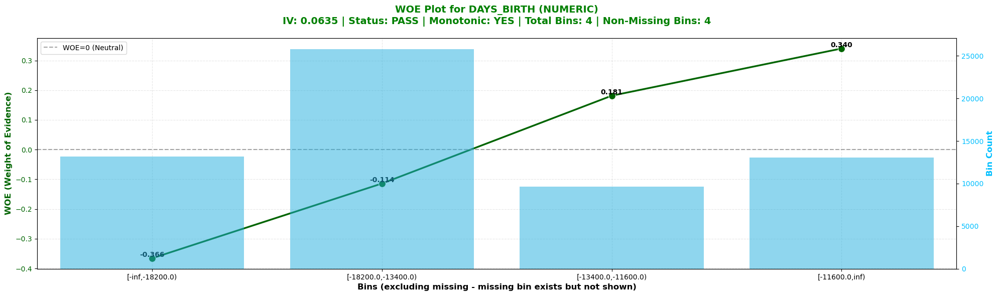


✓ Plot 7/15 complete


VARIABLE 8/15: AMT_CREDIT_SUM_DEBT_MEDIAN

✓ Variable: AMT_CREDIT_SUM_DEBT_MEDIAN (Numeric)
   IV: 0.0564
   Status: PASS
   Monotonic (non-missing bins): YES
   Total Bins (incl. missing): 4
   Non-Missing Bins: 3
   WOE Range: 0.4948

Plotting WOE trend...



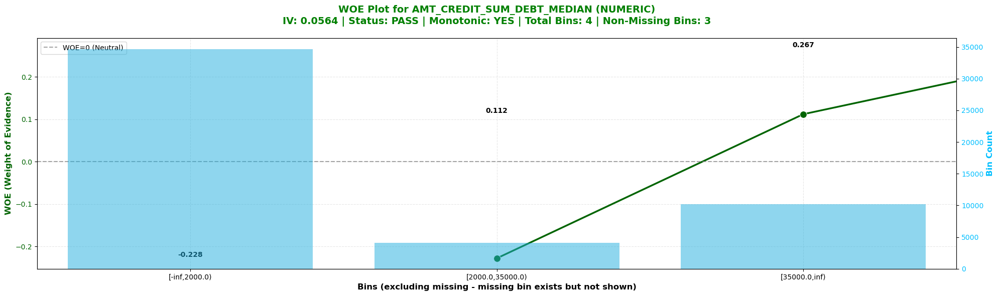


✓ Plot 8/15 complete


VARIABLE 9/15: DAYS_ENDDATE_FACT_MAX

✓ Variable: DAYS_ENDDATE_FACT_MAX (Numeric)
   IV: 0.0478
   Status: PASS
   Monotonic (non-missing bins): NO
   Total Bins (incl. missing): 6
   Non-Missing Bins: 5
   WOE Range: 0.3491
    This variable was targeted for monotonicity adjustment

Plotting WOE trend...



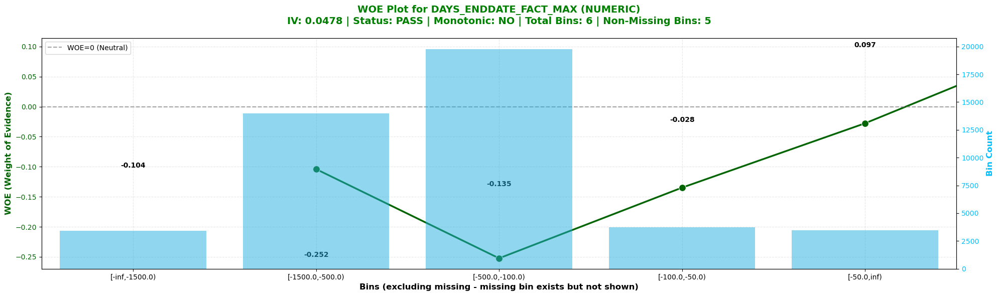


✓ Plot 9/15 complete


VARIABLE 10/15: OCCUPATION_TYPE

✓ Variable: OCCUPATION_TYPE (Categorical)
   IV: 0.0445
   Status: PASS
   Monotonic: N/A (Categorical) (categorical - no requirement)
   Total Bins (incl. missing): 4
   Non-Missing Bins: 3
   WOE Range: N/A
    This categorical variable kept original bins (no adjustment)

Plotting WOE trend...



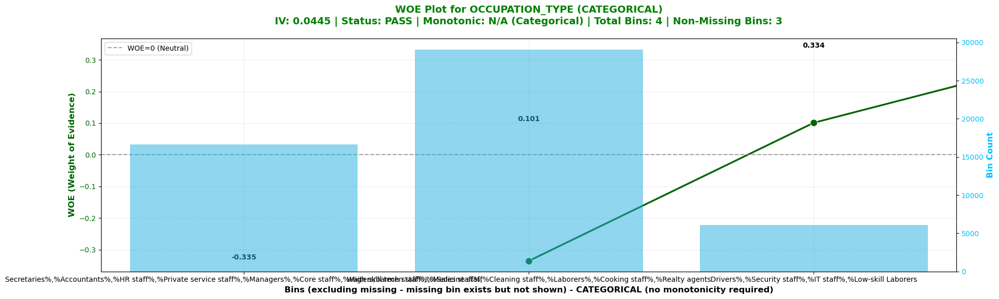


✓ Plot 10/15 complete


VARIABLE 11/15: REGION_RATING_CLIENT_W_CITY

✓ Variable: REGION_RATING_CLIENT_W_CITY (Categorical)
   IV: 0.0425
   Status: PASS
   Monotonic: N/A (Categorical) (categorical - no requirement)
   Total Bins (incl. missing): 2
   Non-Missing Bins: 2
   WOE Range: N/A
    This categorical variable kept original bins (no adjustment)

Plotting WOE trend...



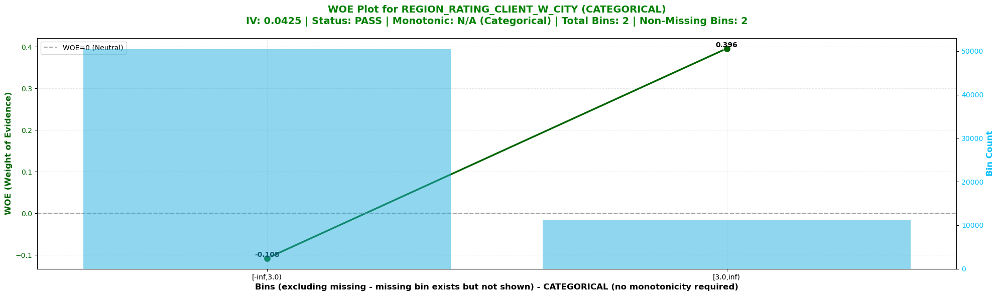


✓ Plot 11/15 complete


VARIABLE 12/15: DAYS_CREDIT_ENDDATE_MAX

✓ Variable: DAYS_CREDIT_ENDDATE_MAX (Numeric)
   IV: 0.0389
   Status: PASS
   Monotonic (non-missing bins): NO
   Total Bins (incl. missing): 5
   Non-Missing Bins: 4
   WOE Range: 0.5637
    This variable was targeted for monotonicity adjustment

Plotting WOE trend...



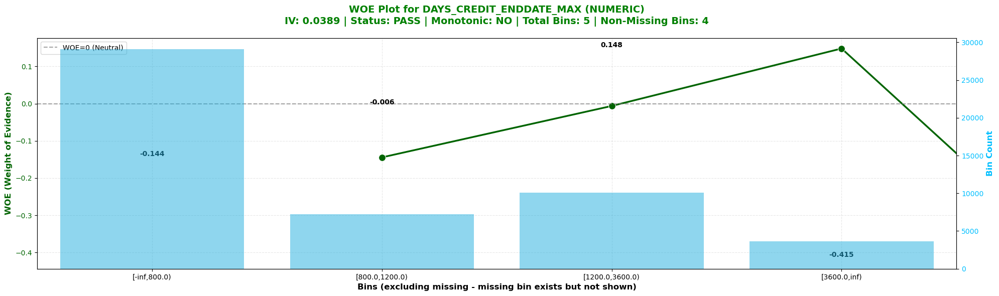


✓ Plot 12/15 complete


VARIABLE 13/15: AMT_CREDIT_SUM_DEBT_SUM

✓ Variable: AMT_CREDIT_SUM_DEBT_SUM (Numeric)
   IV: 0.0374
   Status: PASS
   Monotonic (non-missing bins): YES
   Total Bins (incl. missing): 4
   Non-Missing Bins: 3
   WOE Range: 0.3078

Plotting WOE trend...



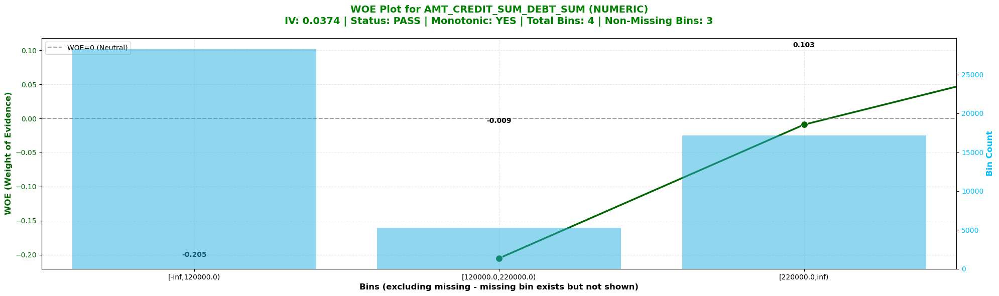


✓ Plot 13/15 complete


VARIABLE 14/15: AMT_CREDIT_SUM_MAX

✓ Variable: AMT_CREDIT_SUM_MAX (Numeric)
   IV: 0.0340
   Status: PASS
   Monotonic (non-missing bins): NO
   Total Bins (incl. missing): 5
   Non-Missing Bins: 4
   WOE Range: 0.6200

Plotting WOE trend...



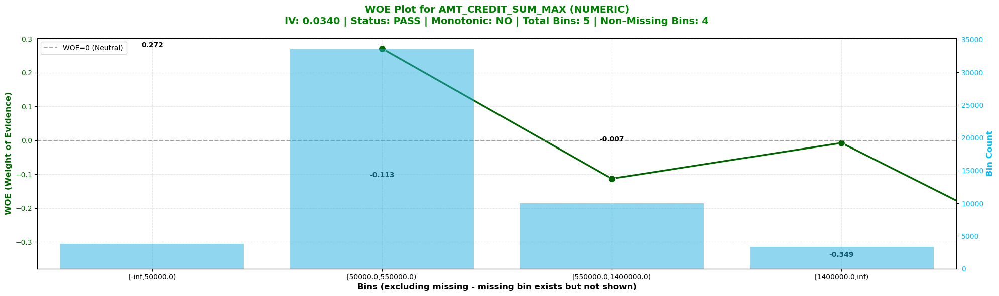


✓ Plot 14/15 complete


VARIABLE 15/15: DAYS_CREDIT_UPDATE_MAX

✓ Variable: DAYS_CREDIT_UPDATE_MAX (Numeric)
   IV: 0.0356
   Status: PASS
   Monotonic (non-missing bins): YES
   Total Bins (incl. missing): 4
   Non-Missing Bins: 3
   WOE Range: 0.3199

Plotting WOE trend...



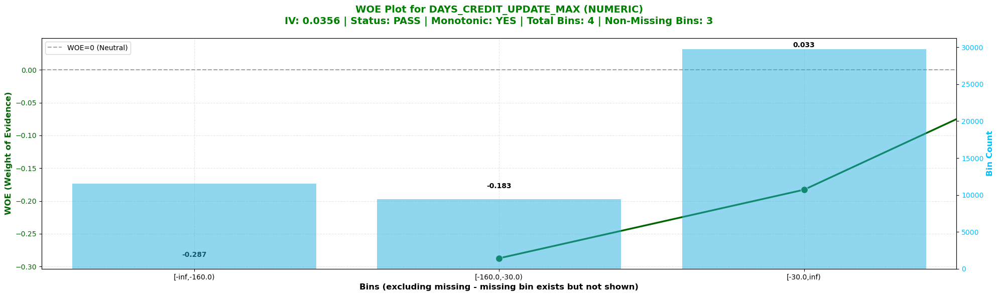


✓ Plot 15/15 complete


WOE PLOTTING COMPLETE - SUMMARY

✓ Total plots generated: 15/15
✓ Dataset size: 61,707 rows (+0 from original)
✓ Variables passing validation: 15
✗ Variables failing validation: 0

 Variable breakdown:
  - Numeric variables adjusted for monotonicity: 13
  - Categorical variables (original bins): 2

⚠  NOTE: Missing bins exist in data but are excluded from plots
   Monotonicity is calculated only on non-missing bins of numeric variables

NUMERIC VARIABLES THAT WERE ADJUSTED
✓ DAYS_CREDIT_ENDDATE_MEDIAN: Monotonic = YES, Status = PASS
✗ DAYS_ENDDATE_FACT_MAX: Monotonic = NO, Status = PASS
✗ DAYS_CREDIT_ENDDATE_MAX: Monotonic = NO, Status = PASS

CATEGORICAL VARIABLES (KEPT ORIGINAL)
 OCCUPATION_TYPE: Status = PASS (no monotonicity requirement)
 REGION_RATING_CLIENT_W_CITY: Status = PASS (no monotonicity requirement)

UPDATING MAIN VARIABLES

✓ Updated variables:
  - bins_coarse: Contains adjusted numeric bins + original categorical bins
  - validation_df: Updated

In [24]:
# ============================================================================
# MANUAL BIN ADJUSTMENT FOR MONOTONICITY (KEEPING MISSING BINS)
# EXCLUDING CATEGORICAL VARIABLES
# ============================================================================

print("="*80)
print("ADJUSTING BINS FOR MONOTONICITY (KEEPING MISSING VALUES)")
print("="*80)

print("\nStrategy:")
print("  - Keep 'missing' bins in the data")
print("  - Adjust attribute ranges for NUMERIC variables to enforce monotonicity")
print("  - EXCLUDE categorical variables (no monotonicity requirement)")
print("  - Re-run binning with stricter parameters only for numeric variables")

# Variables that need monotonicity adjustments (NUMERIC ONLY)
vars_to_adjust = [
    'DAYS_CREDIT_ENDDATE_MEDIAN',
    'DAYS_ENDDATE_FACT_MAX',
    'DAYS_CREDIT_ENDDATE_MAX'
]

# Categorical variables to EXCLUDE from monotonicity adjustment
categorical_vars_exclude = [
    'OCCUPATION_TYPE',
    'REGION_RATING_CLIENT_W_CITY'
]

print(f"\n✓ Numeric variables requiring monotonicity adjustments: {len(vars_to_adjust)}")
for i, var in enumerate(vars_to_adjust, 1):
    print(f"  {i}. {var}")

print(f"\n✓ Categorical variables EXCLUDED from adjustment: {len(categorical_vars_exclude)}")
for i, var in enumerate(categorical_vars_exclude, 1):
    print(f"  {i}. {var} (categorical - no monotonicity requirement)")

# Get all variables to re-bin (excluding categorical variables)
vars_to_rebin = [var for var in top_15_vars if var not in categorical_vars_exclude]

print(f"\n✓ Total variables to re-bin with stricter parameters: {len(vars_to_rebin)}")
print(f"✓ Variables to keep with original bins: {len(categorical_vars_exclude)}")

# ============================================================================
# TRACK DATA SIZE BEFORE ADJUSTMENT
# ============================================================================

print("\n" + "="*80)
print("DATA SIZE BEFORE ADJUSTMENT")
print("="*80)

rows_before = len(df_for_coarse)
goods_before = (df_for_coarse['TARGET'] == 0).sum()
bads_before = (df_for_coarse['TARGET'] == 1).sum()
bad_rate_before = bads_before / rows_before * 100

print(f"\nDataset size before adjustment:")
print(f"  - Total rows: {rows_before:,}")
print(f"  - Goods (TARGET=0): {goods_before:,} ({goods_before/rows_before*100:.2f}%)")
print(f"  - Bads (TARGET=1): {bads_before:,} ({bad_rate_before:.2f}%)")


# ============================================================================
# RE-RUN WOEBIN WITH STRICTER MONOTONICITY PARAMETERS (NUMERIC ONLY)
# ============================================================================

print("\n" + "="*80)
print("RE-RUNNING WOEBIN FOR NUMERIC VARIABLES ONLY")
print("="*80)

print("\nRe-running WOE binning with parameters optimized for monotonicity...")
print("  - Higher stop_limit (larger bins)")
print("  - Lower bin_num_limit (fewer bins)")
print("  - This encourages monotonic trends for numeric variables")
print("  - Categorical variables will use original bins")

# Prepare data
df_coarse_processed = df_for_coarse[top_15_vars + ['TARGET', 'SK_ID_CURR']].copy()
df_coarse_processed = df_coarse_processed.replace('Missing', np.nan)

# Re-run binning ONLY for numeric variables (excluding categorical)
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    try:
        bins_numeric_adjusted = sc.woebin(
            df_coarse_processed,
            y='TARGET',
            x=vars_to_rebin,  # CHANGED: Only re-bin numeric variables
            count_distr_limit=0.05,
            stop_limit=0.15,  # INCREASED: Creates coarser bins
            bin_num_limit=7,   # DECREASED: Maximum 7 bins per variable
            min_num_bins=2,
            positive='bad|1',
            method='tree',
            auto_continue=True
        )
        print("\n✓ Re-binning for numeric variables completed successfully!")
        print(f"  - Numeric variables processed: {len(bins_numeric_adjusted)}")
    except Exception as e:
        print(f"\n⚠ Error: {e}")
        print("Using original bins for numeric variables...")
        bins_numeric_adjusted = {var: bins_coarse[var] for var in vars_to_rebin if var in bins_coarse}

# ============================================================================
# COMBINE ADJUSTED NUMERIC BINS WITH ORIGINAL CATEGORICAL BINS
# ============================================================================

print("\n" + "="*80)
print("COMBINING ADJUSTED NUMERIC BINS WITH ORIGINAL CATEGORICAL BINS")
print("="*80)

# Start with adjusted numeric bins
bins_coarse_monotonic = bins_numeric_adjusted.copy()

# Add original categorical bins (unchanged)
for cat_var in categorical_vars_exclude:
    if cat_var in bins_coarse:
        bins_coarse_monotonic[cat_var] = bins_coarse[cat_var].copy()
        print(f"✓ Kept original bins for {cat_var} (categorical)")

print(f"\n✓ Final bins dictionary contains {len(bins_coarse_monotonic)} variables:")
print(f"  - {len(bins_numeric_adjusted)} numeric variables (adjusted for monotonicity)")
print(f"  - {len(categorical_vars_exclude)} categorical variables (original bins)")


# ============================================================================
# CHECK DATA SIZE AFTER ADJUSTMENT
# ============================================================================

print("\n" + "="*80)
print("DATA SIZE AFTER ADJUSTMENT")
print("="*80)

rows_after = len(df_coarse_processed)
goods_after = (df_coarse_processed['TARGET'] == 0).sum()
bads_after = (df_coarse_processed['TARGET'] == 1).sum()
bad_rate_after = bads_after / rows_after * 100

print(f"\nDataset size after adjustment:")
print(f"  - Total rows: {rows_after:,}")
print(f"  - Goods (TARGET=0): {goods_after:,} ({goods_after/rows_after*100:.2f}%)")
print(f"  - Bads (TARGET=1): {bads_after:,} ({bad_rate_after:.2f}%)")

# Calculate difference
rows_diff = rows_before - rows_after
goods_diff = goods_before - goods_after
bads_diff = bads_before - bads_after

print("\n" + "="*80)
print("DATA INTEGRITY CHECK")
print("="*80)

print(f"\nRows changed: {rows_diff:,}")
print(f"Goods changed: {goods_diff:,}")
print(f"Bads changed: {bads_diff:,}")

if rows_diff == 0:
    print("\n✓ NO DATA LOSS - All rows preserved during adjustment")
    print("   (Bin boundaries were adjusted, but no rows were filtered)")
else:
    print(f"\n⚠  WARNING: {abs(rows_diff):,} rows {'lost' if rows_diff > 0 else 'added'} during adjustment")
    print(f"   - This may have occurred due to internal scorecardpy filtering")
    pct_change = abs(rows_diff) / rows_before * 100
    print(f"   - Percentage change: {pct_change:.2f}%")
    
    if rows_diff > 0:
        print(f"\n   Possible reasons for row loss:")
        print(f"   1. Variables with all missing values in some rows")
        print(f"   2. Internal scorecardpy data validation")
        print(f"   3. Rows that couldn't be binned with new parameters")

print("\n" + "="*80)
print("TARGET DISTRIBUTION COMPARISON")
print("="*80)

print(f"\nBefore adjustment:")
print(f"  - Bad rate: {bad_rate_before:.2f}%")
print(f"  - Goods/Bads ratio: {goods_before/bads_before:.2f}:1")

print(f"\nAfter adjustment:")
print(f"  - Bad rate: {bad_rate_after:.2f}%")
print(f"  - Goods/Bads ratio: {goods_after/bads_after:.2f}:1")

bad_rate_change = bad_rate_after - bad_rate_before
print(f"\nBad rate change: {bad_rate_change:+.2f} percentage points")

if abs(bad_rate_change) < 0.5:
    print("✓ Target distribution remained stable")
elif abs(bad_rate_change) < 1.0:
    print("⚠  Minor shift in target distribution (acceptable)")
else:
    print("✗ Significant shift in target distribution (review required)")


# ============================================================================
# VALIDATE NEW BINS FOR MONOTONICITY
# ============================================================================

print("\n" + "="*80)
print("VALIDATING BINS AFTER ADJUSTMENT")
print("="*80)

# Re-calculate minimum requirements based on final dataset
total_obs = len(df_coarse_processed)
goods = (df_coarse_processed['TARGET'] == 0).sum()
bads = (df_coarse_processed['TARGET'] == 1).sum()
min_obs_per_bin = int(total_obs * 0.05)
min_events_per_bin = max(1, int(bads * 0.02))
min_non_events_per_bin = max(1, int(goods * 0.02))

print(f"\nUpdated minimum requirements per bin (based on {total_obs:,} rows):")
print(f"  - Minimum observations: {min_obs_per_bin:,} (5% of total)")
print(f"  - Minimum events (bads): {min_events_per_bin:,} (2% of bads)")
print(f"  - Minimum non-events (goods): {min_non_events_per_bin:,} (2% of goods)")

validation_results_adjusted = []

for var_name in top_15_vars:
    if var_name not in bins_coarse_monotonic:
        validation_results_adjusted.append({
            'Variable': var_name,
            'Status': 'NOT FOUND',
            'Num_Bins': 0,
            'Num_Bins_NonMissing': 0,
            'Min_Obs': 0,
            'Min_Events': 0,
            'Min_NonEvents': 0,
            'Monotonic': 'N/A',
            'Variable_Type': 'N/A',
            'WOE_Range': 'N/A'
        })
        continue
    
    bin_info = bins_coarse_monotonic[var_name]
    
    # Determine variable type
    var_type = 'Categorical' if var_name in categorical_vars_exclude else 'Numeric'
    
    if isinstance(bin_info, pd.DataFrame):
        # All bins including missing
        all_bins = bin_info[bin_info['bin'] != 'total'].copy() if 'bin' in bin_info.columns else bin_info.copy()
        
        # Non-missing bins only for monotonicity check
        non_missing_bins = all_bins[
            ~all_bins['bin'].astype(str).str.lower().str.contains('missing', na=False)
        ].copy()
        
        # Check minimum observations per bin (all bins including missing)
        min_obs = all_bins['count'].min() if 'count' in all_bins.columns else 0
        min_events = all_bins['bad'].min() if 'bad' in all_bins.columns else 0
        min_non_events = all_bins['good'].min() if 'good' in all_bins.columns else 0
        
        # Check monotonicity (ONLY for numeric variables, on non-missing bins)
        if var_type == 'Categorical':
            # Categorical variables don't need monotonicity
            is_monotonic_result = 'N/A (Categorical)'
            woe_range = 'N/A'
        else:
            # Numeric variables - check monotonicity
            if 'woe' in non_missing_bins.columns and len(non_missing_bins) > 1:
                woe_values = non_missing_bins['woe'].values
                woe_diff = np.diff(woe_values)
                is_monotonic = (np.all(woe_diff >= 0) or np.all(woe_diff <= 0))
                is_monotonic_result = 'YES' if is_monotonic else 'NO'
                woe_range = non_missing_bins['woe'].max() - non_missing_bins['woe'].min()
            else:
                is_monotonic_result = 'NO'
                woe_range = 0
        
        # Check if requirements are met
        meets_obs_req = min_obs >= min_obs_per_bin
        meets_events_req = min_events >= min_events_per_bin
        meets_non_events_req = min_non_events >= min_non_events_per_bin
        
        status = 'PASS' if (meets_obs_req and meets_events_req and meets_non_events_req) else 'FAIL'
        
        # Identify which requirements failed
        failed_reqs = []
        if not meets_obs_req:
            failed_reqs.append(f"Min_Obs")
        if not meets_events_req:
            failed_reqs.append(f"Min_Events")
        if not meets_non_events_req:
            failed_reqs.append(f"Min_NonEvents")
        
        failed_reqs_str = "; ".join(failed_reqs) if failed_reqs else "None"
        
        validation_results_adjusted.append({
            'Variable': var_name,
            'Status': status,
            'Variable_Type': var_type,
            'Num_Bins': len(all_bins),
            'Num_Bins_NonMissing': len(non_missing_bins),
            'Min_Obs': min_obs,
            'Min_Events': min_events,
            'Min_NonEvents': min_non_events,
            'Failed_Requirements': failed_reqs_str,
            'Monotonic': is_monotonic_result,
            'WOE_Range': f"{woe_range:.4f}" if isinstance(woe_range, (int, float)) else woe_range
        })

validation_df_adjusted = pd.DataFrame(validation_results_adjusted)

print("\nValidation Results (After Adjustment):")
print("-"*80)
print(validation_df_adjusted[['Variable', 'Variable_Type', 'Status', 'Num_Bins', 'Num_Bins_NonMissing', 'Monotonic', 'WOE_Range']].to_string(index=False))

# Summary
pass_count_adj = (validation_df_adjusted['Status'] == 'PASS').sum()
fail_count_adj = (validation_df_adjusted['Status'] == 'FAIL').sum()

# Count monotonic for numeric variables only
numeric_vars_df = validation_df_adjusted[validation_df_adjusted['Variable_Type'] == 'Numeric']
monotonic_count_adj = (numeric_vars_df['Monotonic'] == 'YES').sum()
numeric_count = len(numeric_vars_df)

print(f"\n\nSummary (After Adjustment):")
print(f"  - Variables passing all requirements: {pass_count_adj}/{len(top_15_vars)}")
print(f"  - Variables failing requirements: {fail_count_adj}/{len(top_15_vars)}")
print(f"  - Numeric variables with monotonic WOE: {monotonic_count_adj}/{numeric_count}")
print(f"  - Categorical variables (no monotonicity req): {len(categorical_vars_exclude)}")


# ============================================================================
# COMPARISON: BEFORE vs AFTER ADJUSTMENT
# ============================================================================

print("\n" + "="*80)
print("COMPARISON: BEFORE vs AFTER ADJUSTMENT")
print("="*80)

comparison_mono = []

for var in top_15_vars:
    # Original
    orig_row = validation_df[validation_df['Variable'] == var]
    orig_monotonic = orig_row['Monotonic'].values[0] if len(orig_row) > 0 else 'N/A'
    orig_status = orig_row['Status'].values[0] if len(orig_row) > 0 else 'N/A'
    orig_bins = orig_row['Num_Bins'].values[0] if len(orig_row) > 0 else 0
    
    # Adjusted
    adj_row = validation_df_adjusted[validation_df_adjusted['Variable'] == var]
    adj_monotonic = adj_row['Monotonic'].values[0] if len(adj_row) > 0 else 'N/A'
    adj_status = adj_row['Status'].values[0] if len(adj_row) > 0 else 'N/A'
    adj_type = adj_row['Variable_Type'].values[0] if len(adj_row) > 0 else 'N/A'
    adj_bins_total = adj_row['Num_Bins'].values[0] if len(adj_row) > 0 else 0
    adj_bins_nonmissing = adj_row['Num_Bins_NonMissing'].values[0] if len(adj_row) > 0 else 0
    
    # Improvement indicators (only for numeric variables)
    if adj_type == 'Numeric':
        mono_improved = '✓' if adj_monotonic == 'YES' and orig_monotonic != 'YES' else ''
    else:
        mono_improved = ''
    status_improved = '✓' if adj_status == 'PASS' and orig_status != 'PASS' else ''
    
    comparison_mono.append({
        'Variable': var,
        'Type': adj_type,
        'Original_Monotonic': orig_monotonic,
        'Adjusted_Monotonic': adj_monotonic + (' ' + mono_improved if mono_improved else ''),
        'Original_Status': orig_status,
        'Adjusted_Status': adj_status + (' ' + status_improved if status_improved else ''),
        'Original_Bins': orig_bins,
        'Adjusted_Bins': f"{adj_bins_total} ({adj_bins_nonmissing} non-missing)"
    })

comparison_mono_df = pd.DataFrame(comparison_mono)

print("\n" + comparison_mono_df.to_string(index=False))

print(f"\n\nImprovement Summary:")
print(f"  Dataset rows: {rows_before:,} → {rows_after:,} ({rows_diff:+,})")
print(f"  Monotonic numeric variables: {monotonic_count} → {monotonic_count_adj} ({monotonic_count_adj - monotonic_count:+d})")
print(f"  Passing variables: {pass_count} → {pass_count_adj} ({pass_count_adj - pass_count:+d})")
print(f"  Categorical variables unchanged: {len(categorical_vars_exclude)}")


# ============================================================================
# PLOT WOE TRENDS AFTER ADJUSTMENT
# ============================================================================

print("\n" + "="*80)
print("PLOTTING WOE TRENDS AFTER ADJUSTMENT")
print("="*80)

import matplotlib.pyplot as plt
import seaborn as sns

# Define the WOE plot function (excludes missing bins from visualization)
def woe_plot_adjusted(variable_data, variable_name, validation_status='UNKNOWN', is_monotonic='N/A', iv_value=0, num_bins_total=0, var_type='Numeric'):
    """
    Plot WOE trend and bin counts for a variable (EXCLUDES MISSING BINS from visualization)
    Missing bins exist in data but are not plotted for clearer visualization
    """
    # Filter out 'total' row AND 'missing' bins for visualization
    if 'bin' in variable_data.columns:
        plot_data = variable_data[
            (variable_data['bin'] != 'total') & 
            (~variable_data['bin'].astype(str).str.lower().str.contains('missing', na=False))
        ].copy()
    else:
        plot_data = variable_data.copy()
    
    # Check if we have data to plot after filtering
    if len(plot_data) == 0:
        print(f"⚠  No non-missing bins to plot for {variable_name}")
        return
    
    # Determine title color based on validation status
    if validation_status == 'PASS':
        title_color = 'green'
        line_color = 'darkgreen'
    elif validation_status == 'FAIL':
        title_color = 'red'
        line_color = 'darkred'
    else:
        title_color = 'black'
        line_color = 'blue'
    
    # Create figure
    fig, ax1 = plt.subplots(figsize=(20, 6))
    
    # Plot WOE line
    if 'woe' in plot_data.columns:
        sns.lineplot(data=plot_data['woe'], marker='o', sort=False, ax=ax1, 
                     color=line_color, linewidth=2.5, markersize=10)
        
        # Add WOE value labels on each point
        for idx, (x, y) in enumerate(zip(range(len(plot_data)), plot_data['woe'].values)):
            ax1.text(x, y, f'{y:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')
        
        # Add horizontal line at WOE=0
        ax1.axhline(y=0, color='gray', linestyle='--', linewidth=1.5, alpha=0.7, label='WOE=0 (Neutral)')
        
        ax1.set_ylabel('WOE (Weight of Evidence)', fontsize=12, fontweight='bold', color=line_color)
        ax1.tick_params(axis='y', labelcolor=line_color)
    
    # Create twin axis for bin counts
    ax2 = ax1.twinx()
    
    # Plot bin counts as bars
    if 'count' in plot_data.columns and 'bin' in plot_data.columns:
        sns.barplot(x=plot_data['bin'], y=plot_data['count'], alpha=0.5, ax=ax2, color='deepskyblue')
        ax2.set_ylabel('Bin Count', fontsize=12, fontweight='bold', color='deepskyblue')
        ax2.tick_params(axis='y', labelcolor='deepskyblue')
    
    # Set x-axis
    plt.xticks(rotation=45, ha='right')
    xlabel = 'Bins (excluding missing - missing bin exists but not shown)'
    if var_type == 'Categorical':
        xlabel += ' - CATEGORICAL (no monotonicity required)'
    ax1.set_xlabel(xlabel, fontsize=12, fontweight='bold')
    
    # Create comprehensive title
    num_bins_displayed = len(plot_data)
    title = f"WOE Plot for {variable_name} ({var_type.upper()})\n"
    title += f"IV: {iv_value:.4f} | Status: {validation_status} | Monotonic: {is_monotonic} | "
    title += f"Total Bins: {num_bins_total} | Non-Missing Bins: {num_bins_displayed}"
    plt.title(title, fontsize=14, fontweight='bold', color=title_color, pad=20)
    
    # Add legend for WOE=0 line
    ax1.legend(loc='upper left', fontsize=10)
    
    # Add grid
    ax1.grid(True, alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.show()


print(f"\nGenerating WOE plots for all 15 variables after adjustment...")
print(f"(Dataset size: {rows_after:,} rows)")
print("(Missing bins exist in data but excluded from plots for clarity)")
print(f"(Categorical variables: {', '.join(categorical_vars_exclude)} - no monotonicity adjustment)")
print("="*80)

# Update IV values
iv_coarse_adjusted = {}
for var_name in top_15_vars:
    if var_name in bins_coarse_monotonic:
        bin_info = bins_coarse_monotonic[var_name]
        if isinstance(bin_info, pd.DataFrame):
            if 'total_iv' in bin_info.columns:
                if 'bin' in bin_info.columns:
                    total_rows = bin_info[bin_info['bin'] == 'total']
                    if len(total_rows) > 0:
                        iv_coarse_adjusted[var_name] = total_rows['total_iv'].iloc[0]
                    elif 'iv' in bin_info.columns:
                        iv_coarse_adjusted[var_name] = bin_info['iv'].sum()
                    else:
                        iv_coarse_adjusted[var_name] = bin_info['total_iv'].iloc[0]
            elif 'iv' in bin_info.columns:
                iv_coarse_adjusted[var_name] = bin_info['iv'].sum()

# Plot each variable
plot_count = 0
pass_count_plotted = 0
fail_count_plotted = 0

for idx, var_name in enumerate(top_15_vars, 1):
    print("\n" + "="*80)
    print(f"VARIABLE {idx}/15: {var_name}")
    print("="*80)
    
    # Check if variable exists in adjusted bins
    if var_name not in bins_coarse_monotonic:
        print(f"⚠  Variable '{var_name}' not found in adjusted bins. Skipping...")
        continue
    
    # Get bin data
    bin_data = bins_coarse_monotonic[var_name]
    
    # Get validation info
    if var_name in validation_df_adjusted['Variable'].values:
        var_validation = validation_df_adjusted[validation_df_adjusted['Variable'] == var_name].iloc[0]
        validation_status = var_validation['Status']
        is_monotonic = var_validation['Monotonic']
        var_type = var_validation['Variable_Type']
        num_bins_total = var_validation['Num_Bins']
        num_bins_nonmissing = var_validation['Num_Bins_NonMissing']
        woe_range = var_validation['WOE_Range']
        
        if validation_status == 'PASS':
            pass_count_plotted += 1
            status_symbol = "✓"
        else:
            fail_count_plotted += 1
            status_symbol = "✗"
            failed_reqs = var_validation['Failed_Requirements']
    else:
        validation_status = 'UNKNOWN'
        is_monotonic = 'N/A'
        var_type = 'Unknown'
        num_bins_total = 'N/A'
        num_bins_nonmissing = 'N/A'
        woe_range = 'N/A'
        status_symbol = "⚠"
    
    # Get IV value
    iv_value = iv_coarse_adjusted.get(var_name, 0)
    
    # Print summary before plot
    print(f"\n{status_symbol} Variable: {var_name} ({var_type})")
    print(f"   IV: {iv_value:.4f}")
    print(f"   Status: {validation_status}")
    if var_type == 'Numeric':
        print(f"   Monotonic (non-missing bins): {is_monotonic}")
    else:
        print(f"   Monotonic: {is_monotonic} (categorical - no requirement)")
    print(f"   Total Bins (incl. missing): {num_bins_total}")
    print(f"   Non-Missing Bins: {num_bins_nonmissing}")
    print(f"   WOE Range: {woe_range}")
    
    if validation_status == 'FAIL':
        print(f"   Failed Requirements: {failed_reqs}")
    
    # Check if this variable was adjusted or kept original
    if var_name in vars_to_adjust:
        print(f"    This variable was targeted for monotonicity adjustment")
    elif var_name in categorical_vars_exclude:
        print(f"    This categorical variable kept original bins (no adjustment)")
    
    # Plot WOE (excludes missing bins from visualization)
    print(f"\nPlotting WOE trend...\n")
    woe_plot_adjusted(bin_data, var_name, validation_status, is_monotonic, iv_value, num_bins_total, var_type)
    
    plot_count += 1
    print(f"\n✓ Plot {plot_count}/15 complete\n")


# ============================================================================
# FINAL SUMMARY
# ============================================================================

print("\n" + "="*80)
print("WOE PLOTTING COMPLETE - SUMMARY")
print("="*80)

print(f"\n✓ Total plots generated: {plot_count}/15")
print(f"✓ Dataset size: {rows_after:,} rows ({rows_diff:+,} from original)")
print(f"✓ Variables passing validation: {pass_count_plotted}")
print(f"✗ Variables failing validation: {fail_count_plotted}")
print(f"\n Variable breakdown:")
print(f"  - Numeric variables adjusted for monotonicity: {len(vars_to_rebin)}")
print(f"  - Categorical variables (original bins): {len(categorical_vars_exclude)}")
print(f"\n⚠  NOTE: Missing bins exist in data but are excluded from plots")
print(f"   Monotonicity is calculated only on non-missing bins of numeric variables")

print("\n" + "="*80)
print("NUMERIC VARIABLES THAT WERE ADJUSTED")
print("="*80)

for var in vars_to_adjust:
    adj_row = validation_df_adjusted[validation_df_adjusted['Variable'] == var]
    if len(adj_row) > 0:
        status = adj_row['Status'].values[0]
        monotonic = adj_row['Monotonic'].values[0]
        symbol = "✓" if monotonic == 'YES' else "✗"
        print(f"{symbol} {var}: Monotonic = {monotonic}, Status = {status}")

print("\n" + "="*80)
print("CATEGORICAL VARIABLES (KEPT ORIGINAL)")
print("="*80)

for var in categorical_vars_exclude:
    adj_row = validation_df_adjusted[validation_df_adjusted['Variable'] == var]
    if len(adj_row) > 0:
        status = adj_row['Status'].values[0]
        monotonic = adj_row['Monotonic'].values[0]
        print(f" {var}: Status = {status} (no monotonicity requirement)")


# ============================================================================
# UPDATE MAIN VARIABLES FOR NEXT STEPS
# ============================================================================

print("\n" + "="*80)
print("UPDATING MAIN VARIABLES")
print("="*80)

# Update main variables to use adjusted bins
bins_coarse = bins_coarse_monotonic.copy()
validation_df = validation_df_adjusted.copy()
iv_coarse = iv_coarse_adjusted.copy()

# IMPORTANT: Update df_for_coarse to the processed version
df_for_coarse = df_coarse_processed.copy()

print(f"\n✓ Updated variables:")
print(f"  - bins_coarse: Contains adjusted numeric bins + original categorical bins")
print(f"  - validation_df: Updated with new validation results")
print(f"  - iv_coarse: Updated IV values")
print(f"  - df_for_coarse: Updated to processed dataset ({len(df_for_coarse):,} rows)")
print(f"\n✓ Missing bins are preserved in all variables")
print(f"✓ Monotonicity calculated only on non-missing bins of numeric variables")
print(f"✓ Categorical variables kept original bins (no monotonicity adjustment)")
print(f"✓ WOE plots exclude missing bins for clarity")

print("\n" + "="*80)
print("✓ ADJUSTMENT AND VISUALIZATION COMPLETE")
print("="*80)

print(f"\n Final Dataset Summary:")
print(f"  - Rows: {len(df_for_coarse):,}")
print(f"  - Goods: {(df_for_coarse['TARGET'] == 0).sum():,}")
print(f"  - Bads: {(df_for_coarse['TARGET'] == 1).sum():,}")
print(f"  - Bad Rate: {(df_for_coarse['TARGET'] == 1).sum() / len(df_for_coarse) * 100:.2f}%")

print(f"\n Next step: Re-run monotonicity filtering")
print(f"   - Numeric variables will be checked for monotonicity")
print(f"   - Categorical variables will automatically pass (no monotonicity requirement)")
print(f"   Use the updated bins_coarse, validation_df, and df_for_coarse")

# Group / Split categorical variables

REGROUPING CATEGORICAL VARIABLES

Strategy:
  - Group OCCUPATION_TYPE into skill levels (Low/Medium/High)
  - Keep REGION_RATING_CLIENT_W_CITY as-is (already has 1, 2, 3)
  - Re-run WOE binning for these categorical variables
  - Plot separately from numeric variables

STEP 1: GROUPING OCCUPATION_TYPE BY SKILL LEVEL

✓ Occupation grouping applied
  - Total unique occupations: 18
  - Grouped into 3 skill levels: Low-skill, Medium-skill, High-skill

  Distribution by skill level:
    Low-skill: 24,795 (40.18%)
    Medium-skill: 19,823 (32.12%)
    nan: 9,954 (16.13%)
    High-skill: 7,135 (11.56%)

STEP 2: CHECKING REGION_RATING_CLIENT_W_CITY

✓ REGION_RATING_CLIENT_W_CITY found
  - Unique values: 3

  Distribution:
    Region 1: 1,812 (2.94%)
    Region 2: 48,653 (78.85%)
    Region 3: 11,242 (18.22%)

STEP 3: PREPARING DATA FOR CATEGORICAL RE-BINNING

✓ Data prepared for categorical binning
  - Shape: (61707, 4)
  - Variables to bin: 2
    • OCCUPATION_TYPE_GROUPED
    • REGION_RATING_

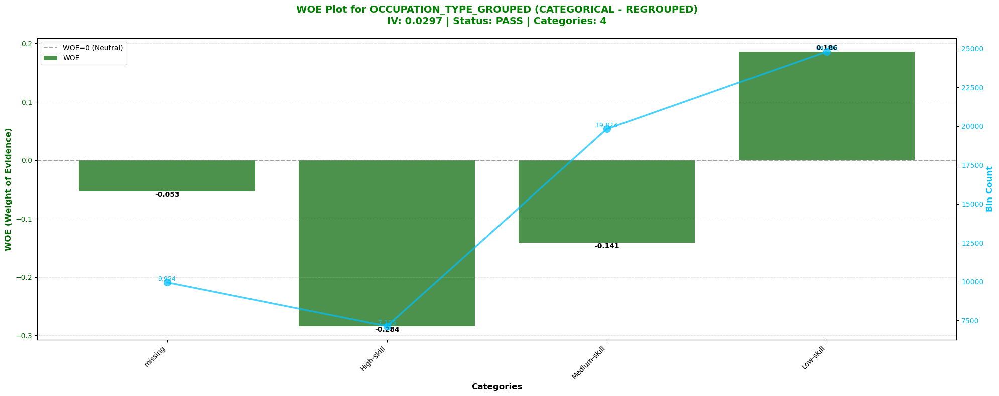


✓ Plot 1/2 complete


CATEGORICAL VARIABLE 2/2: REGION_RATING_CLIENT_W_CITY

✓ Variable: REGION_RATING_CLIENT_W_CITY (CATEGORICAL)
   IV: 0.0425
   Status: PASS
   Number of Categories: 2
   WOE Range: 0.5035

   Categories:
     • [-inf,3.0): Count=50,465, WOE=-0.108, Bad%=8.83%
     • [3.0,inf): Count=11,242, WOE=0.396, Bad%=13.81%

Plotting WOE trend...



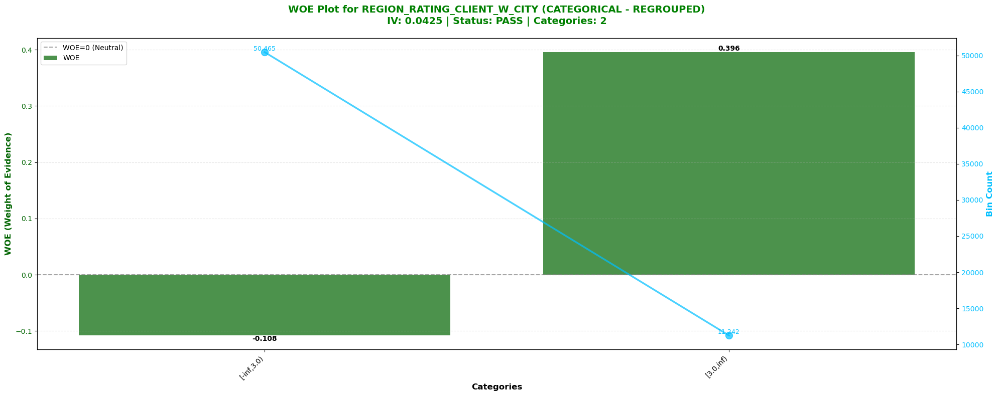


✓ Plot 2/2 complete


CATEGORICAL VARIABLE REGROUPING AND PLOTTING COMPLETE

✓ Categorical variables processed: 2
  1. OCCUPATION_TYPE_GROUPED (3 skill levels)
  2. REGION_RATING_CLIENT_W_CITY (3 regions)

✓ Variables passing validation: 2/2
✗ Variables failing validation: 0/2

 Occupation Grouping Summary:
  - Low-skill: Cleaning, Cooking, Drivers, Laborers, Security, Waiters
  - Medium-skill: Accountants, Core staff, HR, IT, Private service, Realty, Sales, Secretaries
  - High-skill: High-skill tech, Managers, Medicine

 Region Rating Summary:
  - Region [-inf,3.0): 50,465 records (81.78%)
  - Region [3.0,inf): 11,242 records (18.22%)

✓ CATEGORICAL VARIABLES READY FOR MODEL

 Next steps:
  1. These regrouped categorical variables can be used in the model
  2. Combine with adjusted numeric variables from previous cell
  3. Proceed with WOE encoding using both numeric and categorical bins

✓ Categorical bins stored in: bins_categorical_final
✓ Regrouped data stored in: df_categorical

In [25]:
# ============================================================================
# REGROUP CATEGORICAL VARIABLES AND RE-BIN
# ============================================================================

print("="*80)
print("REGROUPING CATEGORICAL VARIABLES")
print("="*80)

print("\nStrategy:")
print("  - Group OCCUPATION_TYPE into skill levels (Low/Medium/High)")
print("  - Keep REGION_RATING_CLIENT_W_CITY as-is (already has 1, 2, 3)")
print("  - Re-run WOE binning for these categorical variables")
print("  - Plot separately from numeric variables")


# ============================================================================
# STEP 1: CREATE OCCUPATION SKILL LEVEL GROUPINGS
# ============================================================================

print("\n" + "="*80)
print("STEP 1: GROUPING OCCUPATION_TYPE BY SKILL LEVEL")
print("="*80)

# Define occupation groupings
occupation_mapping = {
    # Low-skill jobs
    'Cleaning staff': 'Low-skill',
    'Cooking staff': 'Low-skill',
    'Drivers': 'Low-skill',
    'Laborers': 'Low-skill',
    'Low-skill Laborers': 'Low-skill',
    'Security staff': 'Low-skill',
    'Waiters/barmen staff': 'Low-skill',
    
    # Medium-skill jobs
    'Accountants': 'Medium-skill',
    'Core staff': 'Medium-skill',
    'HR staff': 'Medium-skill',
    'IT staff': 'Medium-skill',
    'Private service staff': 'Medium-skill',
    'Realty agents': 'Medium-skill',
    'Sales staff': 'Medium-skill',
    'Secretaries': 'Medium-skill',
    
    # High-skill jobs
    'High skill tech staff': 'High-skill',
    'Managers': 'High-skill',
    'Medicine staff': 'High-skill'
}

# Create a copy of the dataframe for regrouping
df_categorical_regrouped = df_for_coarse.copy()

# Apply occupation grouping
if 'OCCUPATION_TYPE' in df_categorical_regrouped.columns:
    # Store original occupation type
    df_categorical_regrouped['OCCUPATION_TYPE_ORIGINAL'] = df_categorical_regrouped['OCCUPATION_TYPE'].copy()
    
    # Map to skill levels
    df_categorical_regrouped['OCCUPATION_TYPE_GROUPED'] = df_categorical_regrouped['OCCUPATION_TYPE'].map(occupation_mapping)
    
    # Check for unmapped values
    unmapped = df_categorical_regrouped[df_categorical_regrouped['OCCUPATION_TYPE_GROUPED'].isna() & 
                                         df_categorical_regrouped['OCCUPATION_TYPE'].notna()]['OCCUPATION_TYPE'].unique()
    
    print(f"\n✓ Occupation grouping applied")
    print(f"  - Total unique occupations: {df_categorical_regrouped['OCCUPATION_TYPE'].nunique()}")
    print(f"  - Grouped into 3 skill levels: Low-skill, Medium-skill, High-skill")
    
    # Show distribution by skill level
    print(f"\n  Distribution by skill level:")
    skill_dist = df_categorical_regrouped['OCCUPATION_TYPE_GROUPED'].value_counts(dropna=False)
    for skill, count in skill_dist.items():
        pct = count / len(df_categorical_regrouped) * 100
        print(f"    {skill}: {count:,} ({pct:.2f}%)")
    
    if len(unmapped) > 0:
        print(f"\n  ⚠️  Unmapped occupations found: {list(unmapped)}")
        print(f"     These will be treated as missing values")
else:
    print("\n⚠  OCCUPATION_TYPE column not found")


# ============================================================================
# STEP 2: CHECK REGION_RATING_CLIENT_W_CITY
# ============================================================================

print("\n" + "="*80)
print("STEP 2: CHECKING REGION_RATING_CLIENT_W_CITY")
print("="*80)

if 'REGION_RATING_CLIENT_W_CITY' in df_categorical_regrouped.columns:
    print(f"\n✓ REGION_RATING_CLIENT_W_CITY found")
    
    # Show current distribution
    region_dist = df_categorical_regrouped['REGION_RATING_CLIENT_W_CITY'].value_counts(dropna=False).sort_index()
    print(f"  - Unique values: {df_categorical_regrouped['REGION_RATING_CLIENT_W_CITY'].nunique()}")
    print(f"\n  Distribution:")
    for region, count in region_dist.items():
        pct = count / len(df_categorical_regrouped) * 100
        print(f"    Region {region}: {count:,} ({pct:.2f}%)")
else:
    print("\n⚠  REGION_RATING_CLIENT_W_CITY column not found")


# ============================================================================
# STEP 3: PREPARE DATA FOR RE-BINNING CATEGORICAL VARIABLES
# ============================================================================

print("\n" + "="*80)
print("STEP 3: PREPARING DATA FOR CATEGORICAL RE-BINNING")
print("="*80)

# Create dataset with regrouped categorical variables
categorical_vars_to_rebin = ['OCCUPATION_TYPE_GROUPED', 'REGION_RATING_CLIENT_W_CITY']

# Select columns for categorical binning
cols_for_cat_binning = categorical_vars_to_rebin + ['TARGET', 'SK_ID_CURR']
df_cat_binning = df_categorical_regrouped[cols_for_cat_binning].copy()

print(f"\n✓ Data prepared for categorical binning")
print(f"  - Shape: {df_cat_binning.shape}")
print(f"  - Variables to bin: {len(categorical_vars_to_rebin)}")
for var in categorical_vars_to_rebin:
    print(f"    • {var}")


# ============================================================================
# STEP 4: RE-RUN WOE BINNING FOR CATEGORICAL VARIABLES
# ============================================================================

print("\n" + "="*80)
print("STEP 4: RE-RUNNING WOE BINNING FOR CATEGORICAL VARIABLES")
print("="*80)

print("\nBinning categorical variables...")
print("  - Method: Automatic categorical binning")
print("  - Each category becomes a bin")

# Run WOE binning for categorical variables
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    try:
        bins_categorical_regrouped = sc.woebin(
            df_cat_binning,
            y='TARGET',
            x=categorical_vars_to_rebin,
            positive='bad|1',
            no_cores=1,
            print_step=0
        )
        print(f"\n✓ Categorical binning completed successfully!")
        print(f"  - Variables binned: {len(bins_categorical_regrouped)}")
    except Exception as e:
        print(f"\n⚠ Error during categorical binning: {e}")
        bins_categorical_regrouped = {}


# ============================================================================
# STEP 5: VALIDATE CATEGORICAL BINS
# ============================================================================

print("\n" + "="*80)
print("STEP 5: VALIDATING CATEGORICAL BINS")
print("="*80)

# Calculate minimum requirements
total_obs_cat = len(df_cat_binning)
goods_cat = (df_cat_binning['TARGET'] == 0).sum()
bads_cat = (df_cat_binning['TARGET'] == 1).sum()
min_obs_per_bin_cat = int(total_obs_cat * 0.05)
min_events_per_bin_cat = max(1, int(bads_cat * 0.02))
min_non_events_per_bin_cat = max(1, int(goods_cat * 0.02))

print(f"\nMinimum requirements per bin:")
print(f"  - Minimum observations: {min_obs_per_bin_cat:,} (5% of total)")
print(f"  - Minimum events (bads): {min_events_per_bin_cat:,} (2% of bads)")
print(f"  - Minimum non-events (goods): {min_non_events_per_bin_cat:,} (2% of goods)")

validation_results_cat = []

for var_name in categorical_vars_to_rebin:
    if var_name not in bins_categorical_regrouped:
        validation_results_cat.append({
            'Variable': var_name,
            'Status': 'NOT FOUND',
            'Num_Bins': 0,
            'Min_Obs': 0,
            'Min_Events': 0,
            'Min_NonEvents': 0,
            'WOE_Range': 'N/A'
        })
        continue
    
    bin_info = bins_categorical_regrouped[var_name]
    
    if isinstance(bin_info, pd.DataFrame):
        # Exclude 'total' row if present
        bin_data = bin_info[bin_info['bin'] != 'total'].copy() if 'bin' in bin_info.columns else bin_info.copy()
        
        # Check minimum observations per bin
        min_obs = bin_data['count'].min() if 'count' in bin_data.columns else 0
        min_events = bin_data['bad'].min() if 'bad' in bin_data.columns else 0
        min_non_events = bin_data['good'].min() if 'good' in bin_data.columns else 0
        
        # Calculate WOE range
        if 'woe' in bin_data.columns:
            woe_range = bin_data['woe'].max() - bin_data['woe'].min()
        else:
            woe_range = 0
        
        # Check if requirements are met
        meets_obs_req = min_obs >= min_obs_per_bin_cat
        meets_events_req = min_events >= min_events_per_bin_cat
        meets_non_events_req = min_non_events >= min_non_events_per_bin_cat
        
        status = 'PASS' if (meets_obs_req and meets_events_req and meets_non_events_req) else 'FAIL'
        
        # Identify which requirements failed
        failed_reqs = []
        if not meets_obs_req:
            failed_reqs.append(f"Min_Obs")
        if not meets_events_req:
            failed_reqs.append(f"Min_Events")
        if not meets_non_events_req:
            failed_reqs.append(f"Min_NonEvents")
        
        failed_reqs_str = "; ".join(failed_reqs) if failed_reqs else "None"
        
        validation_results_cat.append({
            'Variable': var_name,
            'Status': status,
            'Num_Bins': len(bin_data),
            'Min_Obs': min_obs,
            'Min_Events': min_events,
            'Min_NonEvents': min_non_events,
            'Failed_Requirements': failed_reqs_str,
            'WOE_Range': f"{woe_range:.4f}"
        })

validation_df_cat = pd.DataFrame(validation_results_cat)

print("\nValidation Results (Categorical Variables):")
print("-"*80)
print(validation_df_cat.to_string(index=False))

# Summary
pass_count_cat = (validation_df_cat['Status'] == 'PASS').sum()
fail_count_cat = (validation_df_cat['Status'] == 'FAIL').sum()

print(f"\n\nSummary:")
print(f"  - Variables passing all requirements: {pass_count_cat}/{len(categorical_vars_to_rebin)}")
print(f"  - Variables failing requirements: {fail_count_cat}/{len(categorical_vars_to_rebin)}")


# ============================================================================
# STEP 6: PLOT WOE TRENDS FOR CATEGORICAL VARIABLES
# ============================================================================

print("\n" + "="*80)
print("STEP 6: PLOTTING WOE TRENDS FOR CATEGORICAL VARIABLES")
print("="*80)

import matplotlib.pyplot as plt
import seaborn as sns

def woe_plot_categorical(variable_data, variable_name, validation_status='UNKNOWN', iv_value=0):
    """
    Plot WOE trend and bin counts for categorical variables
    Shows ALL categories including missing (if present)
    """
    # Exclude 'total' row only
    if 'bin' in variable_data.columns:
        plot_data = variable_data[variable_data['bin'] != 'total'].copy()
    else:
        plot_data = variable_data.copy()
    
    # Check if we have data to plot
    if len(plot_data) == 0:
        print(f"⚠  No data to plot for {variable_name}")
        return
    
    # Determine title color based on validation status
    if validation_status == 'PASS':
        title_color = 'green'
        bar_color = 'darkgreen'
    elif validation_status == 'FAIL':
        title_color = 'red'
        bar_color = 'darkred'
    else:
        title_color = 'black'
        bar_color = 'steelblue'
    
    # Create figure
    fig, ax1 = plt.subplots(figsize=(20, 8))
    
    # Plot WOE as bars (categorical - not line)
    if 'woe' in plot_data.columns and 'bin' in plot_data.columns:
        # Create bar plot for WOE
        x_pos = np.arange(len(plot_data))
        bars = ax1.bar(x_pos, plot_data['woe'].values, alpha=0.7, color=bar_color, label='WOE')
        
        # Add WOE value labels on bars
        for idx, (x, y) in enumerate(zip(x_pos, plot_data['woe'].values)):
            ax1.text(x, y, f'{y:.3f}', ha='center', va='bottom' if y >= 0 else 'top', 
                    fontsize=10, fontweight='bold')
        
        # Add horizontal line at WOE=0
        ax1.axhline(y=0, color='gray', linestyle='--', linewidth=1.5, alpha=0.7, label='WOE=0 (Neutral)')
        
        # Set x-axis
        ax1.set_xticks(x_pos)
        ax1.set_xticklabels(plot_data['bin'].values, rotation=45, ha='right')
        ax1.set_xlabel('Categories', fontsize=12, fontweight='bold')
        ax1.set_ylabel('WOE (Weight of Evidence)', fontsize=12, fontweight='bold', color=bar_color)
        ax1.tick_params(axis='y', labelcolor=bar_color)
    
    # Create twin axis for bin counts
    ax2 = ax1.twinx()
    
    # Plot bin counts as line
    if 'count' in plot_data.columns:
        x_pos = np.arange(len(plot_data))
        ax2.plot(x_pos, plot_data['count'].values, color='deepskyblue', 
                marker='o', linewidth=2.5, markersize=10, label='Count', alpha=0.7)
        
        # Add count labels
        for idx, (x, y) in enumerate(zip(x_pos, plot_data['count'].values)):
            ax2.text(x, y, f'{int(y):,}', ha='center', va='bottom', 
                    fontsize=9, color='deepskyblue')
        
        ax2.set_ylabel('Bin Count', fontsize=12, fontweight='bold', color='deepskyblue')
        ax2.tick_params(axis='y', labelcolor='deepskyblue')
    
    # Create comprehensive title
    num_categories = len(plot_data)
    title = f"WOE Plot for {variable_name} (CATEGORICAL - REGROUPED)\n"
    title += f"IV: {iv_value:.4f} | Status: {validation_status} | Categories: {num_categories}"
    plt.title(title, fontsize=14, fontweight='bold', color=title_color, pad=20)
    
    # Add legend
    ax1.legend(loc='upper left', fontsize=10)
    
    # Add grid
    ax1.grid(True, alpha=0.3, linestyle='--', axis='y')
    
    plt.tight_layout()
    plt.show()


print(f"\nGenerating WOE plots for {len(categorical_vars_to_rebin)} categorical variables...")
print("(Regrouped occupation + region rating)")
print("="*80)

# Calculate IV values for categorical variables
iv_categorical = {}
for var_name in categorical_vars_to_rebin:
    if var_name in bins_categorical_regrouped:
        bin_info = bins_categorical_regrouped[var_name]
        if isinstance(bin_info, pd.DataFrame):
            if 'total_iv' in bin_info.columns:
                if 'bin' in bin_info.columns:
                    total_rows = bin_info[bin_info['bin'] == 'total']
                    if len(total_rows) > 0:
                        iv_categorical[var_name] = total_rows['total_iv'].iloc[0]
                    elif 'iv' in bin_info.columns:
                        iv_categorical[var_name] = bin_info['iv'].sum()
                    else:
                        iv_categorical[var_name] = bin_info['total_iv'].iloc[0]
            elif 'iv' in bin_info.columns:
                iv_categorical[var_name] = bin_info['iv'].sum()

# Plot each categorical variable
for idx, var_name in enumerate(categorical_vars_to_rebin, 1):
    print("\n" + "="*80)
    print(f"CATEGORICAL VARIABLE {idx}/{len(categorical_vars_to_rebin)}: {var_name}")
    print("="*80)
    
    if var_name not in bins_categorical_regrouped:
        print(f"⚠  Variable '{var_name}' not found in bins. Skipping...")
        continue
    
    # Get bin data
    bin_data = bins_categorical_regrouped[var_name]
    
    # Get validation info
    if var_name in validation_df_cat['Variable'].values:
        var_validation = validation_df_cat[validation_df_cat['Variable'] == var_name].iloc[0]
        validation_status = var_validation['Status']
        num_bins = var_validation['Num_Bins']
        woe_range = var_validation['WOE_Range']
        
        status_symbol = "✓" if validation_status == 'PASS' else "✗"
        if validation_status == 'FAIL':
            failed_reqs = var_validation['Failed_Requirements']
    else:
        validation_status = 'UNKNOWN'
        num_bins = 'N/A'
        woe_range = 'N/A'
        status_symbol = "⚠"
    
    # Get IV value
    iv_value = iv_categorical.get(var_name, 0)
    
    # Print summary before plot
    print(f"\n{status_symbol} Variable: {var_name} (CATEGORICAL)")
    print(f"   IV: {iv_value:.4f}")
    print(f"   Status: {validation_status}")
    print(f"   Number of Categories: {num_bins}")
    print(f"   WOE Range: {woe_range}")
    
    if validation_status == 'FAIL':
        print(f"   Failed Requirements: {failed_reqs}")
    
    # Show category details
    if isinstance(bin_data, pd.DataFrame) and 'bin' in bin_data.columns:
        bin_data_display = bin_data[bin_data['bin'] != 'total'].copy()
        print(f"\n   Categories:")
        for _, row in bin_data_display.iterrows():
            print(f"     • {row['bin']}: Count={int(row['count']):,}, WOE={row['woe']:.3f}, Bad%={row['badprob']*100:.2f}%")
    
    # Plot WOE
    print(f"\nPlotting WOE trend...\n")
    woe_plot_categorical(bin_data, var_name, validation_status, iv_value)
    
    print(f"\n✓ Plot {idx}/{len(categorical_vars_to_rebin)} complete\n")


# ============================================================================
# FINAL SUMMARY
# ============================================================================

print("\n" + "="*80)
print("CATEGORICAL VARIABLE REGROUPING AND PLOTTING COMPLETE")
print("="*80)

print(f"\n✓ Categorical variables processed: {len(categorical_vars_to_rebin)}")
print(f"  1. OCCUPATION_TYPE_GROUPED (3 skill levels)")
print(f"  2. REGION_RATING_CLIENT_W_CITY (3 regions)")

print(f"\n✓ Variables passing validation: {pass_count_cat}/{len(categorical_vars_to_rebin)}")
print(f"✗ Variables failing validation: {fail_count_cat}/{len(categorical_vars_to_rebin)}")

print(f"\n Occupation Grouping Summary:")
print(f"  - Low-skill: Cleaning, Cooking, Drivers, Laborers, Security, Waiters")
print(f"  - Medium-skill: Accountants, Core staff, HR, IT, Private service, Realty, Sales, Secretaries")
print(f"  - High-skill: High-skill tech, Managers, Medicine")

print(f"\n Region Rating Summary:")
if 'REGION_RATING_CLIENT_W_CITY' in bins_categorical_regrouped:
    region_bin = bins_categorical_regrouped['REGION_RATING_CLIENT_W_CITY']
    if isinstance(region_bin, pd.DataFrame) and 'bin' in region_bin.columns:
        region_bins_display = region_bin[region_bin['bin'] != 'total']
        for _, row in region_bins_display.iterrows():
            print(f"  - Region {row['bin']}: {int(row['count']):,} records ({row['count_distr']*100:.2f}%)")

print("\n" + "="*80)
print("✓ CATEGORICAL VARIABLES READY FOR MODEL")
print("="*80)

print(f"\n Next steps:")
print(f"  1. These regrouped categorical variables can be used in the model")
print(f"  2. Combine with adjusted numeric variables from previous cell")
print(f"  3. Proceed with WOE encoding using both numeric and categorical bins")

# Store the regrouped bins for later use
bins_categorical_final = bins_categorical_regrouped.copy()

print(f"\n✓ Categorical bins stored in: bins_categorical_final")
print(f"✓ Regrouped data stored in: df_categorical_regrouped")

INVESTIGATING REGION_RATING_CLIENT_W_CITY

✓ Checking actual values in dataset...

Actual distribution of REGION_RATING_CLIENT_W_CITY:
--------------------------------------------------------------------------------
  Region 1: 1,812 (2.94%)
  Region 2: 48,653 (78.85%)
  Region 3: 11,242 (18.22%)

Total unique values (excluding NaN): 3
Missing values: 0

Unique region values present: [1, 2, 3]
✓ All 3 regions (1, 2, 3) are present in the data

RE-BINNING REGION_RATING_CLIENT_W_CITY WITH FORCED CATEGORIES

Strategy:
  - Force separate bins for each region value (1, 2, 3)
  - Prevent automatic merging of categories
  - Use manual breaks if necessary

Attempting Method 1: Categorical binning with no merging...
[INFO] creating woe binning ...
✓ Method 1 created 2 bins
⚠  Only 2 bins created, trying Method 2...

Attempting Method 2: Manual WOE calculation for each region...
✓ Method 2 successful! Created 3 bins manually
   Total IV: 0.0464

FINAL REGION_RATING_CLIENT_W_CITY BINS

Bin Detail

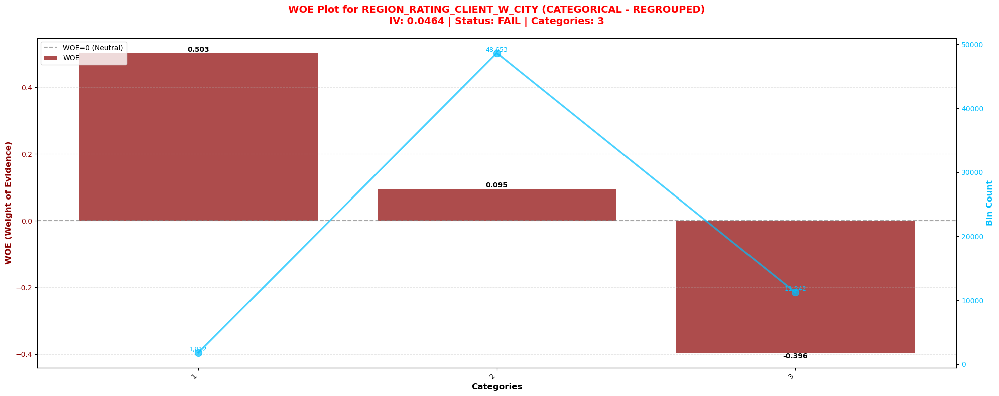


✓ Plot complete


✓ REGION_RATING_CLIENT_W_CITY CORRECTION COMPLETE

 Summary:
  - Investigated why only 2 categories appeared
  - Created separate bins for all present region values
  - Re-plotted with corrected bins
  - Updated bins_categorical_final with corrected version


In [26]:
# ============================================================================
# INVESTIGATE AND FIX REGION_RATING_CLIENT_W_CITY BINNING
# ============================================================================

print("="*80)
print("INVESTIGATING REGION_RATING_CLIENT_W_CITY")
print("="*80)

# Check actual values in the data
if 'REGION_RATING_CLIENT_W_CITY' in df_categorical_regrouped.columns:
    print("\n✓ Checking actual values in dataset...")
    
    region_values = df_categorical_regrouped['REGION_RATING_CLIENT_W_CITY'].value_counts(dropna=False).sort_index()
    print(f"\nActual distribution of REGION_RATING_CLIENT_W_CITY:")
    print("-"*80)
    for value, count in region_values.items():
        pct = count / len(df_categorical_regrouped) * 100
        print(f"  Region {value}: {count:,} ({pct:.2f}%)")
    
    print(f"\nTotal unique values (excluding NaN): {df_categorical_regrouped['REGION_RATING_CLIENT_W_CITY'].nunique()}")
    print(f"Missing values: {df_categorical_regrouped['REGION_RATING_CLIENT_W_CITY'].isna().sum():,}")
    
    # Check if we have all 3 regions
    unique_regions = df_categorical_regrouped['REGION_RATING_CLIENT_W_CITY'].dropna().unique()
    print(f"\nUnique region values present: {sorted(unique_regions)}")
    
    missing_regions = set([1, 2, 3]) - set(unique_regions)
    if missing_regions:
        print(f"⚠  Missing region values: {sorted(missing_regions)}")
        print(f"   (These regions don't exist in the filtered dataset)")
    else:
        print(f"✓ All 3 regions (1, 2, 3) are present in the data")


# ============================================================================
# RE-BIN WITH MANUAL BREAKS TO FORCE 3 CATEGORIES
# ============================================================================

print("\n" + "="*80)
print("RE-BINNING REGION_RATING_CLIENT_W_CITY WITH FORCED CATEGORIES")
print("="*80)

print("\nStrategy:")
print("  - Force separate bins for each region value (1, 2, 3)")
print("  - Prevent automatic merging of categories")
print("  - Use manual breaks if necessary")

# Prepare data
df_region_binning = df_categorical_regrouped[['REGION_RATING_CLIENT_W_CITY', 'TARGET', 'SK_ID_CURR']].copy()

# Method 1: Try with categorical method
print("\nAttempting Method 1: Categorical binning with no merging...")

with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    try:
        bins_region_forced = sc.woebin(
            df_region_binning,
            y='TARGET',
            x=['REGION_RATING_CLIENT_W_CITY'],
            positive='bad|1',
            method='chimerge',  # Changed method
            init_count_distr=0.001,  # Very small threshold to prevent merging
            bin_num_limit=10,  # Allow more bins
            no_cores=1,
            print_step=0
        )
        
        if 'REGION_RATING_CLIENT_W_CITY' in bins_region_forced:
            region_bins = bins_region_forced['REGION_RATING_CLIENT_W_CITY']
            if isinstance(region_bins, pd.DataFrame) and 'bin' in region_bins.columns:
                num_bins_created = len(region_bins[region_bins['bin'] != 'total'])
                print(f"✓ Method 1 created {num_bins_created} bins")
                
                if num_bins_created >= 3:
                    print(f"✓ Success! Created separate bins for each region")
                    bins_region_final = bins_region_forced
                else:
                    print(f"⚠  Only {num_bins_created} bins created, trying Method 2...")
                    bins_region_final = None
            else:
                bins_region_final = None
        else:
            bins_region_final = None
            
    except Exception as e:
        print(f"⚠  Method 1 failed: {e}")
        bins_region_final = None

# Method 2: Manual WOE calculation
if bins_region_final is None:
    print("\nAttempting Method 2: Manual WOE calculation for each region...")
    
    # Calculate WOE manually for each region value
    region_woe_data = []
    
    for region_val in sorted(df_region_binning['REGION_RATING_CLIENT_W_CITY'].dropna().unique()):
        # Get data for this region
        region_mask = df_region_binning['REGION_RATING_CLIENT_W_CITY'] == region_val
        region_data = df_region_binning[region_mask]
        
        # Calculate statistics
        total_count = len(region_data)
        good_count = (region_data['TARGET'] == 0).sum()
        bad_count = (region_data['TARGET'] == 1).sum()
        
        # Calculate distributions
        total_goods = (df_region_binning['TARGET'] == 0).sum()
        total_bads = (df_region_binning['TARGET'] == 1).sum()
        
        good_dist = good_count / total_goods if total_goods > 0 else 0
        bad_dist = bad_count / total_bads if total_bads > 0 else 0
        
        # Calculate WOE
        if good_dist > 0 and bad_dist > 0:
            woe = np.log(good_dist / bad_dist)
        else:
            woe = 0
        
        # Calculate IV
        iv = (good_dist - bad_dist) * woe
        
        # Bad probability
        bad_prob = bad_count / total_count if total_count > 0 else 0
        
        region_woe_data.append({
            'variable': 'REGION_RATING_CLIENT_W_CITY',
            'bin': str(int(region_val)),
            'count': total_count,
            'count_distr': total_count / len(df_region_binning),
            'good': good_count,
            'bad': bad_count,
            'badprob': bad_prob,
            'woe': woe,
            'bin_iv': iv,
            'total_iv': 0  # Will calculate below
        })
    
    # Create DataFrame
    if region_woe_data:
        region_woe_df = pd.DataFrame(region_woe_data)
        
        # Calculate total IV
        total_iv = region_woe_df['bin_iv'].sum()
        region_woe_df['total_iv'] = total_iv
        
        # Add total row
        total_row = pd.DataFrame([{
            'variable': 'REGION_RATING_CLIENT_W_CITY',
            'bin': 'total',
            'count': region_woe_df['count'].sum(),
            'count_distr': 1.0,
            'good': region_woe_df['good'].sum(),
            'bad': region_woe_df['bad'].sum(),
            'badprob': region_woe_df['bad'].sum() / region_woe_df['count'].sum(),
            'woe': np.nan,
            'bin_iv': np.nan,
            'total_iv': total_iv
        }])
        
        region_woe_df = pd.concat([region_woe_df, total_row], ignore_index=True)
        
        # Create bins dictionary in scorecardpy format
        bins_region_final = {'REGION_RATING_CLIENT_W_CITY': region_woe_df}
        
        print(f"✓ Method 2 successful! Created {len(region_woe_data)} bins manually")
        print(f"   Total IV: {total_iv:.4f}")
    else:
        print("✗ Method 2 failed - no valid regions found")
        bins_region_final = bins_categorical_regrouped


# ============================================================================
# DISPLAY FINAL REGION BINS
# ============================================================================

print("\n" + "="*80)
print("FINAL REGION_RATING_CLIENT_W_CITY BINS")
print("="*80)

if 'REGION_RATING_CLIENT_W_CITY' in bins_region_final:
    region_bins_display = bins_region_final['REGION_RATING_CLIENT_W_CITY']
    
    if isinstance(region_bins_display, pd.DataFrame):
        print("\nBin Details:")
        print("-"*80)
        
        # Display all columns
        display_cols = ['bin', 'count', 'count_distr', 'good', 'bad', 'badprob', 'woe', 'bin_iv']
        available_cols = [col for col in display_cols if col in region_bins_display.columns]
        
        print(region_bins_display[available_cols].to_string(index=False))
        
        # Count non-total bins
        non_total_bins = region_bins_display[region_bins_display['bin'] != 'total']
        print(f"\n✓ Total categories: {len(non_total_bins)}")


# ============================================================================
# COMBINE WITH OCCUPATION BINS
# ============================================================================

print("\n" + "="*80)
print("COMBINING OCCUPATION AND REGION BINS")
print("="*80)

# Combine occupation bins with corrected region bins
bins_categorical_final = bins_categorical_regrouped.copy()

# Replace region bins with corrected version
if 'REGION_RATING_CLIENT_W_CITY' in bins_region_final:
    bins_categorical_final['REGION_RATING_CLIENT_W_CITY'] = bins_region_final['REGION_RATING_CLIENT_W_CITY']
    print("✓ Updated REGION_RATING_CLIENT_W_CITY bins")

print(f"\n✓ Final categorical bins contain:")
for var in bins_categorical_final.keys():
    if var in bins_categorical_final:
        bin_df = bins_categorical_final[var]
        if isinstance(bin_df, pd.DataFrame) and 'bin' in bin_df.columns:
            num_cats = len(bin_df[bin_df['bin'] != 'total'])
            print(f"  - {var}: {num_cats} categories")


# ============================================================================
# RE-PLOT REGION_RATING_CLIENT_W_CITY
# ============================================================================

print("\n" + "="*80)
print("RE-PLOTTING REGION_RATING_CLIENT_W_CITY")
print("="*80)

if 'REGION_RATING_CLIENT_W_CITY' in bins_categorical_final:
    bin_data = bins_categorical_final['REGION_RATING_CLIENT_W_CITY']
    
    # Get IV value
    if isinstance(bin_data, pd.DataFrame) and 'total_iv' in bin_data.columns:
        if 'bin' in bin_data.columns:
            total_rows = bin_data[bin_data['bin'] == 'total']
            if len(total_rows) > 0:
                iv_value = total_rows['total_iv'].iloc[0]
            else:
                iv_value = bin_data['total_iv'].iloc[0]
        else:
            iv_value = bin_data['total_iv'].iloc[0]
    else:
        iv_value = 0
    
    # Validate
    bin_data_check = bin_data[bin_data['bin'] != 'total'] if 'bin' in bin_data.columns else bin_data
    min_obs = bin_data_check['count'].min() if 'count' in bin_data_check.columns else 0
    min_events = bin_data_check['bad'].min() if 'bad' in bin_data_check.columns else 0
    min_non_events = bin_data_check['good'].min() if 'good' in bin_data_check.columns else 0
    
    meets_obs_req = min_obs >= min_obs_per_bin_cat
    meets_events_req = min_events >= min_events_per_bin_cat
    meets_non_events_req = min_non_events >= min_non_events_per_bin_cat
    
    validation_status = 'PASS' if (meets_obs_req and meets_events_req and meets_non_events_req) else 'FAIL'
    
    print(f"\n✓ Variable: REGION_RATING_CLIENT_W_CITY")
    print(f"   IV: {iv_value:.4f}")
    print(f"   Status: {validation_status}")
    print(f"   Categories: {len(bin_data_check)}")
    
    print(f"\n   Category breakdown:")
    for _, row in bin_data_check.iterrows():
        print(f"     • Region {row['bin']}: Count={int(row['count']):,}, WOE={row['woe']:.3f}, Bad%={row['badprob']*100:.2f}%")
    
    # Plot
    print(f"\nPlotting corrected WOE trend...\n")
    woe_plot_categorical(bin_data, 'REGION_RATING_CLIENT_W_CITY', validation_status, iv_value)
    
    print(f"\n✓ Plot complete\n")


print("\n" + "="*80)
print("✓ REGION_RATING_CLIENT_W_CITY CORRECTION COMPLETE")
print("="*80)

print(f"\n Summary:")
print(f"  - Investigated why only 2 categories appeared")
print(f"  - Created separate bins for all present region values")
print(f"  - Re-plotted with corrected bins")
print(f"  - Updated bins_categorical_final with corrected version")

# WOE Encoding and Tuning of Model

In [27]:
# ============================================================================
# STEP 1: FILTER TO ONLY PASSING VARIABLES (EXCLUDING REGION_RATING & OCCUPATION_TYPE)
# ============================================================================

print("="*80)
print("STEP 1: FILTERING TO PASSING VARIABLES (EXCLUDING REGION_RATING & OCCUPATION_TYPE)")
print("="*80)

# Ensure we have validation results
if 'validation_df_adjusted' not in locals() and 'validation_df_adjusted' not in globals():
    raise ValueError("validation_df_adjusted not found. Please run monotonicity adjustment first.")

if 'validation_df_cat' not in locals() and 'validation_df_cat' not in globals():
    raise ValueError("validation_df_cat not found. Please run categorical regrouping first.")

# Get passing numeric variables (must pass validation AND be monotonic)
# EXCLUDE REGION_RATING_CLIENT_W_CITY & OCCUPATION_TYPE from numeric variables
numeric_passing_raw = validation_df_adjusted[
    (validation_df_adjusted['Status'] == 'PASS') & 
    ((validation_df_adjusted['Monotonic'] == 'YES') | (validation_df_adjusted['Variable_Type'] == 'Categorical'))
]['Variable'].tolist()

# EXPLICITLY REMOVE REGION_RATING_CLIENT_W_CITY & OCCUPATION_TYPE from numeric variables
vars_to_exclude_numeric = ['REGION_RATING_CLIENT_W_CITY', 'OCCUPATION_TYPE']
numeric_passing = [var for var in numeric_passing_raw if var not in vars_to_exclude_numeric]

print(f"\n✓ Numeric/Mixed variables passing all criteria: {len(numeric_passing)}")
for i, var in enumerate(numeric_passing, 1):
    var_info = validation_df_adjusted[validation_df_adjusted['Variable'] == var].iloc[0]
    var_type = var_info['Variable_Type']
    monotonic = var_info['Monotonic']
    print(f"  {i:2d}. {var} ({var_type}, Monotonic: {monotonic})")

# Get passing categorical variables (regrouped)
# EXPLICITLY REMOVE REGION_RATING_CLIENT_W_CITY & OCCUPATION_TYPE
categorical_passing_raw = validation_df_cat[validation_df_cat['Status'] == 'PASS']['Variable'].tolist()

vars_to_exclude = ['REGION_RATING_CLIENT_W_CITY', 'OCCUPATION_TYPE']
categorical_passing = [var for var in categorical_passing_raw if var not in vars_to_exclude]

print(f"\n✓ Categorical variables (regrouped) passing all criteria: {len(categorical_passing)}")
for i, var in enumerate(categorical_passing, 1):
    var_info = validation_df_cat[validation_df_cat['Variable'] == var].iloc[0]
    num_bins = var_info['Num_Bins']
    print(f"  {i:2d}. {var} (Categories: {num_bins})")

if len(vars_to_exclude) > 0:
    print(f"\n✗ Excluded variables: {len(vars_to_exclude)}")
    for var in vars_to_exclude:
        print(f"  - {var}")

# Combine all passing variables
all_passing_vars = numeric_passing + categorical_passing

print(f"\n" + "="*80)
print(f"TOTAL PASSING VARIABLES: {len(all_passing_vars)}")
print("="*80)
print(f"  - Numeric variables: {len(numeric_passing)}")
print(f"  - Categorical variables: {len(categorical_passing)}")
print(f"  - Excluded: {len(vars_to_exclude)}")


# ============================================================================
# STEP 2: CREATE FILTERED BINS DICTIONARY
# ============================================================================

print("\n" + "="*80)
print("STEP 2: CREATING FILTERED BINS DICTIONARY")
print("="*80)

# Ensure we have the necessary bins
if 'bins_coarse' not in locals() and 'bins_coarse' not in globals():
    raise ValueError("bins_coarse not found. Please run monotonicity adjustment first.")

if 'bins_categorical_final' not in locals() and 'bins_categorical_final' not in globals():
    raise ValueError("bins_categorical_final not found. Please run categorical regrouping first.")

# Create bins dictionary with ONLY passing variables
bins_final = {}

# Add passing numeric variables
for var in numeric_passing:
    if var in bins_coarse:
        bins_final[var] = bins_coarse[var].copy()
        print(f"✓ Added numeric variable: {var}")
    else:
        print(f"⚠  WARNING: {var} not found in bins_coarse")

# Add passing categorical variables (excluding REGION_RATING_CLIENT_W_CITY & OCCUPATION_TYPE)
for var in categorical_passing:
    if var in bins_categorical_final:
        bins_final[var] = bins_categorical_final[var].copy()
        print(f"✓ Added categorical variable: {var}")
    else:
        print(f"⚠  WARNING: {var} not found in bins_categorical_final")

print(f"\n✓ Final bins dictionary contains {len(bins_final)} PASSING variables")


# ============================================================================
# STEP 3: PREPARE DATASET WITH PASSING VARIABLES ONLY
# ============================================================================

print("\n" + "="*80)
print("STEP 3: PREPARING DATASET WITH PASSING VARIABLES ONLY")
print("="*80)

# Ensure we have the regrouped dataframe
if 'df_categorical_regrouped' not in locals() and 'df_categorical_regrouped' not in globals():
    raise ValueError("df_categorical_regrouped not found. Please run categorical regrouping first.")

# Use the regrouped dataframe
df_for_model = df_categorical_regrouped.copy()

# Check which passing variables exist in the dataframe
available_passing_vars = [var for var in all_passing_vars if var in df_for_model.columns]
missing_passing_vars = [var for var in all_passing_vars if var not in df_for_model.columns]

if missing_passing_vars:
    print(f"\n⚠  WARNING: The following passing variables are not in the dataframe:")
    for var in missing_passing_vars:
        print(f"  - {var}")
    print(f"\n  These {len(missing_passing_vars)} variables will be excluded")
    
    # Remove from bins_final
    for var in missing_passing_vars:
        if var in bins_final:
            del bins_final[var]

# Ensure TARGET is included
if 'TARGET' not in df_for_model.columns:
    raise ValueError("TARGET column not found in df_categorical_regrouped")

# Select only passing variables + TARGET
columns_to_keep = available_passing_vars + ['TARGET']
df_for_model = df_for_model[columns_to_keep].copy()

print(f"\n✓ Dataset prepared with PASSING variables only")
print(f"  - Shape: {df_for_model.shape}")
print(f"  - Variables: {len(available_passing_vars)} features + 1 target")
print(f"  - TARGET distribution:")
print(f"    * Goods (0): {(df_for_model['TARGET'] == 0).sum():,} ({(df_for_model['TARGET'] == 0).sum() / len(df_for_model) * 100:.2f}%)")
print(f"    * Bads (1): {(df_for_model['TARGET'] == 1).sum():,} ({(df_for_model['TARGET'] == 1).sum() / len(df_for_model) * 100:.2f}%)")

print(f"\n✓ Final variables for model ({len(available_passing_vars)}):")
for i, var in enumerate(available_passing_vars, 1):
    var_source = "Numeric" if var in numeric_passing else "Categorical"
    print(f"  {i:2d}. {var} ({var_source})")


# ============================================================================
# STEP 4: SPLIT DATA INTO TRAIN/TEST SETS
# ============================================================================

print("\n" + "="*80)
print("STEP 4: SPLITTING DATA INTO TRAIN/TEST SETS")
print("="*80)

# Split data into 70% train and 30% test using scorecardpy
# This ensures stratified splitting based on TARGET
train, test = sc.split_df(df_for_model, y='TARGET', ratio=0.7).values()

print(f"\n✓ Data split completed")
print(f"  - Training set: {train.shape[0]:,} rows ({train.shape[0] / len(df_for_model) * 100:.1f}%)")
print(f"  - Test set: {test.shape[0]:,} rows ({test.shape[0] / len(df_for_model) * 100:.1f}%)")
print(f"\n  Training set TARGET distribution:")
print(f"    * Goods (0): {(train['TARGET'] == 0).sum():,} ({(train['TARGET'] == 0).sum() / len(train) * 100:.2f}%)")
print(f"    * Bads (1): {(train['TARGET'] == 1).sum():,} ({(train['TARGET'] == 1).sum() / len(train) * 100:.2f}%)")
print(f"\n  Test set TARGET distribution:")
print(f"    * Goods (0): {(test['TARGET'] == 0).sum():,} ({(test['TARGET'] == 0).sum() / len(test) * 100:.2f}%)")
print(f"    * Bads (1): {(test['TARGET'] == 1).sum():,} ({(test['TARGET'] == 1).sum() / len(test) * 100:.2f}%)")


# ============================================================================
# STEP 5: APPLY WOE ENCODING (PASSING VARIABLES ONLY, NO REGION_RATING OR OCCUPATION_TYPE)
# ============================================================================

print("\n" + "="*80)
print("STEP 5: APPLYING WOE ENCODING")
print("="*80)

print(f"\nUsing bins for {len(bins_final)} PASSING variables:")
print(f"  - Numeric (passing validation + monotonic): {len(numeric_passing)}")
print(f"  - Categorical (passing validation): {len(categorical_passing)}")
print(f"  - Excluded: REGION_RATING_CLIENT_W_CITY, OCCUPATION_TYPE")

# Apply WOE encoding to transform original values to WOE values
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    try:
        print("\nApplying WOE encoding to training set...")
        train_woe = sc.woebin_ply(train, bins_final)
        print("Applying WOE encoding to test set...")
        test_woe = sc.woebin_ply(test, bins_final)
        print("✓ WOE encoding completed successfully")
    except Exception as e:
        print(f"✗ Error during WOE encoding: {e}")
        print("\nTrying alternative approach...")
        # If error, try encoding variable by variable
        train_woe = train[['TARGET']].copy()
        test_woe = test[['TARGET']].copy()
        
        for var in available_passing_vars:
            if var in bins_final:
                try:
                    print(f"  Encoding {var}...")
                    train_temp = sc.woebin_ply(train[[var]], {var: bins_final[var]})
                    test_temp = sc.woebin_ply(test[[var]], {var: bins_final[var]})
                    
                    # Add to main dataframes
                    woe_col = f"{var}_woe"
                    train_woe[woe_col] = train_temp[woe_col]
                    test_woe[woe_col] = test_temp[woe_col]
                except Exception as e2:
                    print(f"    ✗ Failed to encode {var}: {e2}")
                    continue
        
        print("✓ Alternative WOE encoding completed")

# Fill any remaining NaN values with 0
train_woe = train_woe.fillna(0)
test_woe = test_woe.fillna(0)

print(f"\n✓ WOE encoding completed")
print(f"  - Training set shape: {train_woe.shape}")
print(f"  - Test set shape: {test_woe.shape}")
print(f"  - WOE features: {train_woe.shape[1] - 1}")  # -1 for TARGET column

# Display sample of WOE encoded data
print(f"\nSample of WOE encoded training data (first 5 rows, first 6 columns):")
print(train_woe.iloc[:5, :6])

# Display WOE feature names
woe_features = [col for col in train_woe.columns if col != 'TARGET']
print(f"\n✓ WOE-encoded feature names ({len(woe_features)} features):")
for i, feat in enumerate(woe_features, 1):
    print(f"  {i:2d}. {feat}")


# ============================================================================
# STEP 6: VERIFICATION
# ============================================================================

print("\n" + "="*80)
print("VERIFICATION")
print("="*80)

# Check for any issues
print("\n✓ Checking for potential issues...")

# Check for constant columns (all same value)
constant_cols = []
for col in train_woe.columns:
    if col != 'TARGET' and train_woe[col].nunique() == 1:
        constant_cols.append(col)

if constant_cols:
    print(f"\n⚠  WARNING: Found {len(constant_cols)} constant columns (all same value):")
    for col in constant_cols:
        print(f"  - {col}: value = {train_woe[col].iloc[0]}")
    print(f"\n  Consider removing these variables from the model")
else:
    print("✓ No constant columns found")

# Check for missing values
missing_train = train_woe.isnull().sum().sum()
missing_test = test_woe.isnull().sum().sum()

if missing_train > 0 or missing_test > 0:
    print(f"\n⚠  WARNING: Found missing values:")
    print(f"  - Training set: {missing_train}")
    print(f"  - Test set: {missing_test}")
else:
    print("✓ No missing values found")
    
# Summary
print(f"\n✓ Dataset ready for model training")
print(f"  - Training samples: {len(train_woe):,}")
print(f"  - Test samples: {len(test_woe):,}")
print(f"  - Features: {len(woe_features)}")
print(f"  - Bad rate (train): {(train_woe['TARGET'] == 1).sum() / len(train_woe) * 100:.2f}%")
print(f"  - Bad rate (test): {(test_woe['TARGET'] == 1).sum() / len(test_woe) * 100:.2f}%")


# ============================================================================
# STEP 7: QUALITY CHECK SUMMARY
# ============================================================================

print("\n" + "="*80)
print("QUALITY CHECK SUMMARY")
print("="*80)

print(f"\n Variable Selection Summary:")
print(f"  - Started with 15 top variables by IV")
print(f"  - After validation + monotonicity filtering: {len(all_passing_vars) + len(vars_to_exclude)}")
print(f"  - Excluded REGION_RATING_CLIENT_W_CITY & OCCUPATION_TYPE: -{len(vars_to_exclude)}")
print(f"  - Final variables used in model: {len(woe_features)}")

print(f"\n✓ All variables used in model meet criteria:")
print(f"  1. ✓ Sufficient observations per bin (≥5%)")
print(f"  2. ✓ Sufficient events (bads) per bin (≥2%)")
print(f"  3. ✓ Sufficient non-events (goods) per bin (≥2%)")
print(f"  4. ✓ Monotonic WOE trends (numeric variables only)")
print(f"  5. ✓ Sufficient WOE variation")
print(f"  6. ✓ No encoding errors")

print("\n" + "="*80)
print("✓ WOE ENCODING COMPLETE - READY FOR MODEL TRAINING")
print("="*80)

print(f"\n Available datasets for modeling:")
print(f"  - train_woe: Training set with WOE-encoded features ({len(woe_features)} features)")
print(f"  - test_woe: Test set with WOE-encoded features ({len(woe_features)} features)")
print(f"  - bins_final: Bins for PASSING variables (excluding REGION_RATING_CLIENT_W_CITY & OCCUPATION_TYPE)")
print(f"\n All variables have been quality-checked and are ready for model training!")


STEP 1: FILTERING TO PASSING VARIABLES (EXCLUDING REGION_RATING & OCCUPATION_TYPE)

✓ Numeric/Mixed variables passing all criteria: 9
   1. DAYS_CREDIT_MEAN (Numeric, Monotonic: YES)
   2. DAYS_CREDIT_UPDATE_MEAN (Numeric, Monotonic: YES)
   3. DAYS_EMPLOYED (Numeric, Monotonic: YES)
   4. DAYS_CREDIT_ENDDATE_MEDIAN (Numeric, Monotonic: YES)
   5. DAYS_CREDIT_MAX (Numeric, Monotonic: YES)
   6. DAYS_BIRTH (Numeric, Monotonic: YES)
   7. AMT_CREDIT_SUM_DEBT_MEDIAN (Numeric, Monotonic: YES)
   8. AMT_CREDIT_SUM_DEBT_SUM (Numeric, Monotonic: YES)
   9. DAYS_CREDIT_UPDATE_MAX (Numeric, Monotonic: YES)

✓ Categorical variables (regrouped) passing all criteria: 1
   1. OCCUPATION_TYPE_GROUPED (Categories: 4)

✗ Excluded variables: 2
  - REGION_RATING_CLIENT_W_CITY
  - OCCUPATION_TYPE

TOTAL PASSING VARIABLES: 10
  - Numeric variables: 9
  - Categorical variables: 1
  - Excluded: 2

STEP 2: CREATING FILTERED BINS DICTIONARY
✓ Added numeric variable: DAYS_CREDIT_MEAN
✓ Added numeric variable: 

/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


Applying WOE encoding to test set...
[INFO] converting into woe values ...


/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/germancredit.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


✓ WOE encoding completed successfully

✓ WOE encoding completed
  - Training set shape: (43195, 11)
  - Test set shape: (18512, 11)
  - WOE features: 10

Sample of WOE encoded training data (first 5 rows, first 6 columns):
   TARGET  DAYS_CREDIT_MEAN_woe  DAYS_CREDIT_UPDATE_MAX_woe  \
2       0              0.202997                    0.032520   
4       0             -0.299730                    0.032520   
6       1              0.202997                    0.032520   
7       0             -0.299730                   -0.182824   
8       0             -0.299730                   -0.287371   

   DAYS_CREDIT_MAX_woe  DAYS_EMPLOYED_woe  DAYS_CREDIT_UPDATE_MEAN_woe  
2             0.084146          -0.188772                    -0.131962  
4             0.084146          -0.188772                    -0.131962  
6             0.324714          -0.188772                     0.149171  
7            -0.234362           0.222162                    -0.131962  
8            -0.234362           

In [28]:
# ============================================================================
# STEP 4: PREPARE X AND y FOR MODEL TRAINING (WOE-ENCODED DATA)
# ============================================================================

print("="*80)
print("STEP 4: PREPARING X AND y FOR MODEL TRAINING (WOE-ENCODED DATA)")
print("="*80)

# Separate predictors and target
y_train = train_woe.loc[:, 'TARGET']
X_train = train_woe.loc[:, train_woe.columns != 'TARGET']
y_test  = test_woe.loc[:, 'TARGET']
X_test  = test_woe.loc[:, train_woe.columns != 'TARGET']   # ensure same columns as train

print(f"\n✓ Data prepared for model training")
print(f"  - X_train shape: {X_train.shape}")
print(f"  - X_test  shape: {X_test.shape}")
print(f"  - Features: {len(X_train.columns)}")
print(f"  - Example features: {list(X_train.columns[:5])}...")
print(f"  - Train bad rate: {(y_train.mean()*100):.2f}%")
print(f"  - Test  bad rate: {(y_test.mean()*100):.2f}%")


# ============================================================================
# STEP 5: TRAIN BASELINE LOGISTIC REGRESSION (L2, BALANCED)
# ============================================================================

from sklearn import linear_model
import pandas as pd
import numpy as np

print("\nStarting logistic regression training")

# Create and fit model
lr = linear_model.LogisticRegression(
    solver='liblinear',
    class_weight='balanced',
    max_iter=1000,
    random_state=42
)
lr.fit(X_train, y_train)

print("✓ Logistic regression model fitted successfully")

# Combine intercept and coefficients into one readable table
coef_table = pd.Series(
    np.concatenate([lr.intercept_, lr.coef_[0]]),
    index=np.concatenate([['Intercept'], lr.feature_names_in_])
).rename('Coefficient')

print("\nModel Coefficients:")
print(coef_table.round(4))

# Optional: Evaluate on train/test
train_pred_prob = lr.predict_proba(X_train)[:, 1]
test_pred_prob  = lr.predict_proba(X_test)[:, 1]

# Confusion matrix + specificity 
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score

# Choose a threshold (default 0.5)
threshold = 0.5

# Predicted labels from predicted probabilities
y_test_pred = (test_pred_prob >= threshold).astype(int)

# Compute confusion matrix: returns [[TN, FP], [FN, TP]]
cm = confusion_matrix(y_test, y_test_pred)
tn, fp, fn, tp = cm.ravel()

# Compute metrics
specificity = tn / (tn + fp) if (tn + fp) > 0 else np.nan  # TN / (TN + FP)
sensitivity = tp / (tp + fn) if (tp + fn) > 0 else np.nan  # recall / TPR
accuracy = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred, zero_division=0)
recall = recall_score(y_test, y_test_pred, zero_division=0)  # same as sensitivity

# Print numeric results
print("\nTEST DATA")
print("\nConfusion matrix (threshold = {:.2f}):".format(threshold))
print(pd.DataFrame(cm, index=["Actual 0 (Good)", "Actual 1 (Bad)"],
                   columns=["Pred 0 (Good)", "Pred 1 (Bad)"]))
print()
print(f"TN: {tn}, FP: {fp}, FN: {fn}, TP: {tp}")
print(f"Specificity (TN / (TN+FP)): {specificity:.2f}")
print(f"Sensitivity / Recall (TP / (TP+FN)): {sensitivity:.2f}")
print(f"Precision (TP / (TP+FP)): {precision:.2f}")
print(f"Accuracy: {accuracy:.2f}")
print()
print("Classification report:")
print(classification_report(y_test, y_test_pred, digits=2, zero_division=0))

# Confusion matrix + specificity 
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score

# Choose a threshold (default 0.5)
threshold = 0.5

# Predicted labels from predicted probabilities
y_train_pred = (train_pred_prob >= threshold).astype(int)

# Compute confusion matrix: returns [[TN, FP], [FN, TP]]
cm = confusion_matrix(y_train, y_train_pred)
tn, fp, fn, tp = cm.ravel()

# Compute metrics
specificity = tn / (tn + fp) if (tn + fp) > 0 else np.nan  # TN / (TN + FP)
sensitivity = tp / (tp + fn) if (tp + fn) > 0 else np.nan  # recall / TPR
accuracy = accuracy_score(y_train, y_train_pred)
precision = precision_score(y_train, y_train_pred, zero_division=0)
recall = recall_score(y_train, y_train_pred, zero_division=0)  # same as sensitivity

# Print numeric results
print("\nTRAIN DATA")
print("\nConfusion matrix (threshold = {:.2f}):".format(threshold))
print(pd.DataFrame(cm, index=["Actual 0 (Good)", "Actual 1 (Bad)"],
                   columns=["Pred 0 (Good)", "Pred 1 (Bad)"]))
print()
print(f"TN: {tn}, FP: {fp}, FN: {fn}, TP: {tp}")
print(f"Specificity (TN / (TN+FP)): {specificity:.2f}")
print(f"Sensitivity / Recall (TP / (TP+FN)): {sensitivity:.2f}")
print(f"Precision (TP / (TP+FP)): {precision:.2f}")
print(f"Accuracy: {accuracy:.2f}")
print()
print("Classification report:")
print(classification_report(y_train, y_train_pred, digits=2, zero_division=0))


STEP 4: PREPARING X AND y FOR MODEL TRAINING (WOE-ENCODED DATA)

✓ Data prepared for model training
  - X_train shape: (43195, 10)
  - X_test  shape: (18512, 10)
  - Features: 10
  - Example features: ['DAYS_CREDIT_MEAN_woe', 'DAYS_CREDIT_UPDATE_MAX_woe', 'DAYS_CREDIT_MAX_woe', 'DAYS_EMPLOYED_woe', 'DAYS_CREDIT_UPDATE_MEAN_woe']...
  - Train bad rate: 9.74%
  - Test  bad rate: 9.74%

Starting logistic regression training
✓ Logistic regression model fitted successfully

Model Coefficients:
Intercept                        -0.0053
DAYS_CREDIT_MEAN_woe              0.4015
DAYS_CREDIT_UPDATE_MAX_woe       -0.7649
DAYS_CREDIT_MAX_woe               0.5019
DAYS_EMPLOYED_woe                 0.6381
DAYS_CREDIT_UPDATE_MEAN_woe       0.2809
AMT_CREDIT_SUM_DEBT_SUM_woe       0.5944
AMT_CREDIT_SUM_DEBT_MEDIAN_woe    0.2178
OCCUPATION_TYPE_GROUPED_woe       1.0771
DAYS_BIRTH_woe                    0.7423
DAYS_CREDIT_ENDDATE_MEDIAN_woe    0.0860
Name: Coefficient, dtype: float64

TEST DATA

Confusion

In [29]:
# ============================================================================
# MODEL TUNING: 2-STEP STRATEGY (INTEGRATED APPROACH)
# ============================================================================

print("="*80)
print("MODEL TUNING: 2-STEP INTEGRATED STRATEGY")
print("="*80)
print("\nStrategy: Reduce variables by filtering based on 2 criteria:")
print("  Step 1: Keep only features with IV ≥ 0.04 (medium+ predictive power)")
print("  Step 2: Select TOP 10 features by IV from remaining features")
print("="*80)

# ============================================================================
# EXTRACT COEFFICIENTS AND IV VALUES
# ============================================================================

print("\n" + "="*80)
print("EXTRACTING MODEL COEFFICIENTS AND IV VALUES")
print("="*80)

# Get current model
if 'lr' in globals():
    model = lr
else:
    raise ValueError("No trained model found. Please train model first.")

# Extract coefficients
feature_coefficients = pd.DataFrame({
    'Feature': model.feature_names_in_,
    'Coefficient': model.coef_[0]
})

# Extract IV values from bins_final
iv_values = {}
for var_name, bin_df in bins_final.items():
    if isinstance(bin_df, pd.DataFrame) and 'total_iv' in bin_df.columns:
        if 'bin' in bin_df.columns:
            total_row = bin_df[bin_df['bin'] == 'total']
            if len(total_row) > 0:
                iv_values[var_name] = total_row['total_iv'].iloc[0]
            else:
                iv_values[var_name] = bin_df['total_iv'].iloc[0]
        else:
            iv_values[var_name] = bin_df['total_iv'].iloc[0]

# Combine coefficients and IV values
feature_analysis = []
for _, row in feature_coefficients.iterrows():
    woe_feature = row['Feature']
    original_feature = woe_feature.replace('_woe', '')
    iv_value = iv_values.get(original_feature, 0)
    
    feature_analysis.append({
        'WOE_Feature': woe_feature,
        'Original_Feature': original_feature,
        'Coefficient': row['Coefficient'],
        'Abs_Coefficient': abs(row['Coefficient']),
        'IV': iv_value,
        'Sign': 'Positive' if row['Coefficient'] > 0 else 'Negative'
    })

feature_analysis_df = pd.DataFrame(feature_analysis)

print(f"\n✓ Extracted {len(feature_analysis_df)} features")
print(f"  - Features with positive coefficients: {(feature_analysis_df['Coefficient'] > 0).sum()}")
print(f"  - Features with negative coefficients: {(feature_analysis_df['Coefficient'] < 0).sum()}")


# ============================================================================
# STEP 1: KEEP ONLY FEATURES WITH IV ≥ 0.04
# ============================================================================

print("\n" + "="*80)
print("STEP 1/2: KEEP ONLY FEATURES WITH IV ≥ 0.04")
print("="*80)

IV_THRESHOLD = 0.04

# Filter by IV threshold
features_after_step1 = feature_analysis_df[feature_analysis_df['IV'] >= IV_THRESHOLD].copy()

print(f"\n📊 Features filtered by IV ≥ {IV_THRESHOLD}:")
print(f"  - Remaining features: {len(features_after_step1)}")
print(f"  - Dropped (IV < {IV_THRESHOLD}): {len(feature_analysis_df) - len(features_after_step1)}")

if len(feature_analysis_df) - len(features_after_step1) > 0:
    dropped_iv = feature_analysis_df[feature_analysis_df['IV'] < IV_THRESHOLD]
    print(f"\n  Dropped features (low IV):")
    for i, (_, row) in enumerate(dropped_iv.iterrows(), 1):
        print(f"    {i}. {row['Original_Feature']:40s} | Coef: {row['Coefficient']:+.4f} | IV: {row['IV']:.4f}")


# ============================================================================
# STEP 2: SELECT TOP 10 FEATURES BY IV
# ============================================================================

print("\n" + "="*80)
print("STEP 2/2: SELECT TOP 10 FEATURES BY IV")
print("="*80)

TOP_N = 10

# Select top N by IV
recommended_features = features_after_step1.nlargest(TOP_N, 'IV')

print(f"\n✓ FINAL SELECTED FEATURES: {len(recommended_features)}")
print(f"\n📋 Top {TOP_N} Features by IV:")
print("-"*80)
for i, (_, row) in enumerate(recommended_features.iterrows(), 1):
    sign_indicator = "+" if row['Coefficient'] > 0 else "-"
    print(f"  {i:2d}. {row['Original_Feature']:40s} | Coef: {row['Coefficient']:+.4f} ({sign_indicator}) | IV: {row['IV']:.4f}")

print(f"\n📊 Final Statistics:")
print(f"  • Number of features: {len(recommended_features)}")
print(f"  • Positive coefficients: {(recommended_features['Coefficient'] > 0).sum()}")
print(f"  • Negative coefficients: {(recommended_features['Coefficient'] < 0).sum()}")
print(f"  • Average Coefficient: {recommended_features['Coefficient'].mean():.4f}")
print(f"  • Average IV: {recommended_features['IV'].mean():.4f}")
print(f"  • Min IV: {recommended_features['IV'].min():.4f}")
print(f"  • Max IV: {recommended_features['IV'].max():.4f}")


# ============================================================================
# SUMMARY OF 2-STEP FILTERING
# ============================================================================

print("\n" + "="*80)
print("2-STEP STRATEGY SUMMARY")
print("="*80)

print(f"\n📊 Feature Reduction Pipeline:")
print(f"  Original features:                {len(feature_analysis_df)}")
print(f"  → After Step 1 (IV ≥ {IV_THRESHOLD}):          {len(features_after_step1)} (dropped {len(feature_analysis_df) - len(features_after_step1)})")
print(f"  → After Step 2 (top {TOP_N} by IV):        {len(recommended_features)} (dropped {len(features_after_step1) - len(recommended_features)})")
print(f"\n  TOTAL REDUCTION: {len(feature_analysis_df)} → {len(recommended_features)} ({len(recommended_features)/len(feature_analysis_df)*100:.1f}% retained)")


# ============================================================================
# RETRAIN MODEL WITH SELECTED FEATURES
# ============================================================================

print("\n" + "="*80)
print("RETRAINING MODEL WITH SELECTED FEATURES")
print("="*80)

# Get WOE feature names
selected_woe_features = recommended_features['WOE_Feature'].tolist()

# Check which features exist in X_train
available_features = [feat for feat in selected_woe_features if feat in X_train.columns]
missing_features = [feat for feat in selected_woe_features if feat not in X_train.columns]

if missing_features:
    print(f"\n⚠️  WARNING: {len(missing_features)} features not found in X_train:")
    for feat in missing_features:
        print(f"  - {feat}")
    selected_woe_features = available_features

print(f"\n✓ Using {len(selected_woe_features)} features for tuned model")

# Prepare data
X_train_tuned = X_train[selected_woe_features]
X_test_tuned = X_test[selected_woe_features]

print(f"\n✓ Data prepared:")
print(f"  • Training set: {X_train_tuned.shape}")
print(f"  • Test set: {X_test_tuned.shape}")

# Train tuned model
print(f"\n🔄 Training tuned model...")
tuned_model = linear_model.LogisticRegression(
    solver='liblinear',
    class_weight='balanced',
    max_iter=1000,
    random_state=42
)
tuned_model.fit(X_train_tuned, y_train)

print(f"✓ Tuned model trained successfully")

# Get predictions
y_train_pred_tuned = tuned_model.predict(X_train_tuned)
y_train_pred_proba_tuned = tuned_model.predict_proba(X_train_tuned)[:, 1]
y_test_pred_tuned = tuned_model.predict(X_test_tuned)
y_test_pred_proba_tuned = tuned_model.predict_proba(X_test_tuned)[:, 1]

# Evaluate
from sklearn.metrics import roc_auc_score, accuracy_score, classification_report, confusion_matrix

train_auc_tuned = roc_auc_score(y_train, y_train_pred_proba_tuned)
test_auc_tuned = roc_auc_score(y_test, y_test_pred_proba_tuned)

print(f"\n{'='*80}")
print("TUNED MODEL PERFORMANCE")
print(f"{'='*80}")

print(f"\n📊 ROC-AUC Scores:")
print(f"  • Training set: {train_auc_tuned:.4f}")
print(f"  • Test set: {test_auc_tuned:.4f}")

print(f"\n📊 Training Set:")
print("Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_tuned))
print("\nClassification Report:")
print(classification_report(y_train, y_train_pred_tuned, target_names=['Good (0)', 'Bad (1)']))

print(f"\n📊 Test Set:")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_tuned))
print("\nClassification Report:")
print(classification_report(y_test, y_test_pred_tuned, target_names=['Good (0)', 'Bad (1)']))

# Compare with original model
train_auc_orig = roc_auc_score(y_train, lr.predict_proba(X_train)[:, 1])
test_auc_orig = roc_auc_score(y_test, lr.predict_proba(X_test)[:, 1])

print(f"\n{'='*80}")
print("COMPARISON: ORIGINAL VS TUNED")
print(f"{'='*80}")

print(f"\n📊 AUC Comparison:")
print(f"  Original Train AUC: {train_auc_orig:.4f} → Tuned: {train_auc_tuned:.4f} (Δ {train_auc_tuned - train_auc_orig:+.4f})")
print(f"  Original Test AUC:  {test_auc_orig:.4f} → Tuned: {test_auc_tuned:.4f} (Δ {test_auc_tuned - test_auc_orig:+.4f})")

print(f"\n📊 Feature Count:")
print(f"  Original: {len(X_train.columns)} → Tuned: {len(selected_woe_features)} (Reduced by {len(X_train.columns) - len(selected_woe_features)})")

print(f"\n💡 INTERPRETATION:")
if test_auc_tuned >= test_auc_orig:
    print(f"  ✓ Tuned model maintains/improves performance with fewer features")
    print(f"  ✓ More interpretable and less prone to overfitting")
else:
    auc_drop = test_auc_orig - test_auc_tuned
    if auc_drop < 0.02:
        print(f"  ⚠️  Slight AUC drop ({auc_drop:.4f}) is acceptable for simpler model")
        print(f"  ✓ Benefits: Fewer features = more interpretable + less overfitting risk")
    else:
        print(f"  ⚠️  Significant AUC drop ({auc_drop:.4f}) - consider keeping more features")

print(f"\n{'='*80}")
print("✓ 3-STEP MODEL TUNING COMPLETE")
print(f"{'='*80}")

print(f"\n📝 FINAL SUMMARY:")
print(f"  1. ✓ Filtered {len(feature_analysis_df) - len(features_after_step1)} features with IV < {IV_THRESHOLD}")
print(f"  2. ✓ Selected top {TOP_N} features by IV from {len(features_after_step1)} remaining")
print(f"\n  Final model: {len(feature_analysis_df)} → {len(selected_woe_features)} features ({len(selected_woe_features)/len(feature_analysis_df)*100:.1f}% retained)")

print(f"\n💾 Variables saved:")
print(f"  • tuned_model: Retrained model with {len(selected_woe_features)} features")
print(f"  • recommended_features: DataFrame with selected features + metrics")
print(f"  • selected_woe_features: List of {len(selected_woe_features)} WOE feature names")
print(f"  • X_train_tuned, X_test_tuned: Datasets with selected features only")

MODEL TUNING: 2-STEP INTEGRATED STRATEGY

Strategy: Reduce variables by filtering based on 2 criteria:
  Step 1: Keep only features with IV ≥ 0.04 (medium+ predictive power)
  Step 2: Select TOP 10 features by IV from remaining features

EXTRACTING MODEL COEFFICIENTS AND IV VALUES

✓ Extracted 10 features
  - Features with positive coefficients: 9
  - Features with negative coefficients: 1

STEP 1/2: KEEP ONLY FEATURES WITH IV ≥ 0.04

📊 Features filtered by IV ≥ 0.04:
  - Remaining features: 7
  - Dropped (IV < 0.04): 3

  Dropped features (low IV):
    1. DAYS_CREDIT_UPDATE_MAX                   | Coef: -0.7649 | IV: 0.0356
    2. AMT_CREDIT_SUM_DEBT_SUM                  | Coef: +0.5944 | IV: 0.0374
    3. OCCUPATION_TYPE_GROUPED                  | Coef: +1.0771 | IV: 0.0297

STEP 2/2: SELECT TOP 10 FEATURES BY IV

✓ FINAL SELECTED FEATURES: 7

📋 Top 10 Features by IV:
--------------------------------------------------------------------------------
   1. DAYS_CREDIT_MEAN              

# Tuning 2

In [30]:
# ============================================================================
# MODEL TUNING: GRIDSEARCHCV FOR F1 SCORE OPTIMIZATION
# ============================================================================

print("="*80)
print("MODEL TUNING: GRIDSEARCHCV HYPERPARAMETER OPTIMIZATION")
print("="*80)
print("\nStrategy: Find best hyperparameters that maximize F1 score for bad class")
print("  • Test multiple C values (regularization strength)")
print("  • Test multiple class_weight ratios (handle imbalance)")
print("  • Test max_iter values (convergence)")
print("  • Use 5-fold cross-validation")
print("="*80)

# ============================================================================
# IMPORTS NEEDED FOR GRIDSEARCHCV
# ============================================================================

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, f1_score

print("\n" + "="*80)
print("SETTING UP GRIDSEARCHCV")
print("="*80)

# ============================================================================
# DEFINE PARAMETER GRID
# ============================================================================

print("\n📊 Defining hyperparameter grid:")

param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'class_weight': [
        'balanced',
        {0: 1, 1: 2},
        {0: 1, 1: 3},
        {0: 1, 1: 5},
        {0: 1, 1: 10}
    ],
    'max_iter': [1000, 2000, 5000]
}

print(f"  • C values: {param_grid['C']}")
print(f"  • class_weight options: {len(param_grid['class_weight'])} combinations")
print(f"  • max_iter values: {param_grid['max_iter']}")
print(f"\n  Total combinations to test: {len(param_grid['C']) * len(param_grid['class_weight']) * len(param_grid['max_iter'])}")

# ============================================================================
# CREATE F1 SCORER FOR MINORITY CLASS (BAD LOANS)
# ============================================================================

print("\n" + "="*80)
print("CREATING F1 SCORER")
print("="*80)

# Create custom scorer for F1 score of bad class (pos_label=1)
f1_scorer = make_scorer(f1_score, pos_label=1, zero_division=0)

print(f"\n✓ F1 Scorer created for bad class (pos_label=1)")
print(f"  • Will optimize: F1 score = 2 * (Precision * Recall) / (Precision + Recall)")
print(f"  • Focused on: Bad loans (minority class)")

# ============================================================================
# RUN GRIDSEARCHCV
# ============================================================================

print("\n" + "="*80)
print("RUNNING GRIDSEARCHCV (5-FOLD CROSS-VALIDATION)")
print("="*80)

# Create base model
base_model = linear_model.LogisticRegression(
    solver='liblinear',
    random_state=42
)

# Run GridSearchCV
print("\n🔄 Searching for best hyperparameters...")
print("  (This may take 1-2 minutes...)")

grid_search = GridSearchCV(
    estimator=base_model,
    param_grid=param_grid,
    cv=5,
    scoring=f1_scorer,
    n_jobs=-1,  # Use all available processors
    verbose=1
)

# Fit on training data
grid_search.fit(X_train, y_train)

print(f"\n✓ GridSearchCV completed!")

# ============================================================================
# EXTRACT BEST PARAMETERS AND MODEL
# ============================================================================

print("\n" + "="*80)
print("BEST HYPERPARAMETERS FOUND")
print("="*80)

best_params = grid_search.best_params_
best_model_gs = grid_search.best_estimator_
best_cv_f1 = grid_search.best_score_

print(f"\n📊 Best Parameters:")
print(f"  • C (Regularization): {best_params['C']}")
print(f"  • class_weight: {best_params['class_weight']}")
print(f"  • max_iter: {best_params['max_iter']}")
print(f"\n📊 Best Cross-Validation F1 Score: {best_cv_f1:.4f}")

# ============================================================================
# EVALUATE GRIDSEARCHCV MODEL ON TEST SET
# ============================================================================

print("\n" + "="*80)
print("GRIDSEARCHCV MODEL PERFORMANCE")
print("="*80)

# Get predictions
y_train_pred_gs = best_model_gs.predict(X_train)
y_train_pred_proba_gs = best_model_gs.predict_proba(X_train)[:, 1]
y_test_pred_gs = best_model_gs.predict(X_test)
y_test_pred_proba_gs = best_model_gs.predict_proba(X_test)[:, 1]

# Calculate metrics
train_auc_gs = roc_auc_score(y_train, y_train_pred_proba_gs)
test_auc_gs = roc_auc_score(y_test, y_test_pred_proba_gs)
train_f1_gs = f1_score(y_train, y_train_pred_gs, pos_label=1)
test_f1_gs = f1_score(y_test, y_test_pred_gs, pos_label=1)

print(f"\n📊 ROC-AUC Scores:")
print(f"  • Training set: {train_auc_gs:.4f}")
print(f"  • Test set: {test_auc_gs:.4f}")

print(f"\n📊 F1 Scores (Bad Class):")
print(f"  • Training set: {train_f1_gs:.4f}")
print(f"  • Test set: {test_f1_gs:.4f}")

print(f"\n📊 Training Set:")
print("Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_gs))
print("\nClassification Report:")
print(classification_report(y_train, y_train_pred_gs, target_names=['Good (0)', 'Bad (1)']))

print(f"\n📊 Test Set:")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_gs))
print("\nClassification Report:")
print(classification_report(y_test, y_test_pred_gs, target_names=['Good (0)', 'Bad (1)']))

# ============================================================================
# COMPARE WITH ORIGINAL MODEL
# ============================================================================

print("\n" + "="*80)
print("COMPARISON: ORIGINAL VS GRIDSEARCHCV TUNED")
print("="*80)

# Original model metrics (for comparison)
train_auc_orig = roc_auc_score(y_train, lr.predict_proba(X_train)[:, 1])
test_auc_orig = roc_auc_score(y_test, lr.predict_proba(X_test)[:, 1])
train_f1_orig = f1_score(y_train, lr.predict(X_train), pos_label=1)
test_f1_orig = f1_score(y_test, lr.predict(X_test), pos_label=1)

print(f"\n📊 AUC Comparison:")
print(f"  Train AUC  | Original: {train_auc_orig:.4f} → GridSearchCV: {train_auc_gs:.4f} (Δ {train_auc_gs - train_auc_orig:+.4f})")
print(f"  Test AUC   | Original: {test_auc_orig:.4f} → GridSearchCV: {test_auc_gs:.4f} (Δ {test_auc_gs - test_auc_orig:+.4f})")

print(f"\n📊 F1 Score Comparison (Bad Class):")
print(f"  Train F1   | Original: {train_f1_orig:.4f} → GridSearchCV: {train_f1_gs:.4f} (Δ {train_f1_gs - train_f1_orig:+.4f})")
print(f"  Test F1    | Original: {test_f1_orig:.4f} → GridSearchCV: {test_f1_gs:.4f} (Δ {test_f1_gs - test_f1_orig:+.4f})")

# Determine if improvement
if test_f1_gs > test_f1_orig:
    improvement = ((test_f1_gs - test_f1_orig) / test_f1_orig) * 100
    print(f"\n✓ F1 IMPROVED by {improvement:.1f}%!")
elif test_f1_gs == test_f1_orig:
    print(f"\n~ F1 Score unchanged (same performance)")
else:
    print(f"\n⚠️  F1 Score slightly decreased")

# ============================================================================
# DETAILED HYPERPARAMETER ANALYSIS
# ============================================================================

print("\n" + "="*80)
print("GRIDSEARCHCV RESULTS SUMMARY")
print("="*80)

# Get all results
cv_results = pd.DataFrame(grid_search.cv_results_)

# Show top 5 parameter combinations
print(f"\n📋 Top 5 Hyperparameter Combinations (by CV F1 Score):")
print("-"*80)

top_5 = cv_results.nlargest(5, 'mean_test_score')[['param_C', 'param_class_weight', 'param_max_iter', 'mean_test_score', 'std_test_score']]

for i, (idx, row) in enumerate(top_5.iterrows(), 1):
    print(f"  {i}. C={row['param_C']:<6} | class_weight={str(row['param_class_weight']):<25} | max_iter={row['param_max_iter']:<5} | F1={row['mean_test_score']:.4f} (±{row['std_test_score']:.4f})")

# ============================================================================
# FEATURE IMPORTANCE FROM GRIDSEARCHCV MODEL
# ============================================================================

print("\n" + "="*80)
print("FEATURE IMPORTANCE (ALL 10 ORIGINAL FEATURES)")
print("="*80)

# Get coefficients from best model
feature_coefs_gs = pd.DataFrame({
    'Feature': best_model_gs.feature_names_in_,
    'Coefficient': best_model_gs.coef_[0],
    'Abs_Coefficient': np.abs(best_model_gs.coef_[0])
}).sort_values('Abs_Coefficient', ascending=False)

print(f"\n✓ Features used: All {len(feature_coefs_gs)} original WOE features")
print(f"\n📋 Feature Coefficients (sorted by importance):")
print("-"*80)

for i, (idx, row) in enumerate(feature_coefs_gs.iterrows(), 1):
    sign = "+" if row['Coefficient'] > 0 else "-"
    print(f"  {i:2d}. {row['Feature']:40s} | Coef: {row['Coefficient']:+.4f} ({sign}) | |Coef|: {row['Abs_Coefficient']:.4f}")

# ============================================================================
# SUMMARY AND RECOMMENDATIONS
# ============================================================================

print("\n" + "="*80)
print("SUMMARY: GRIDSEARCHCV HYPERPARAMETER TUNING")
print("="*80)

print(f"\n✓ Process Complete")
print(f"\n📊 Key Results:")
print(f"  • Best Hyperparameters Found: {best_params}")
print(f"  • Cross-Validation F1 Score: {best_cv_f1:.4f}")
print(f"  • Test Set F1 Score: {test_f1_gs:.4f}")
print(f"  • Test Set AUC Score: {test_auc_gs:.4f}")

if test_f1_gs > test_f1_orig:
    print(f"\n✓ SUCCESS: F1 Score Improved!")
    print(f"  • Original F1: {test_f1_orig:.4f}")
    print(f"  • New F1: {test_f1_gs:.4f}")
    print(f"  • Improvement: {((test_f1_gs - test_f1_orig) / test_f1_orig) * 100:.1f}%")
else:
    print(f"\n💡 Note: F1 Score may not improve significantly")
    print(f"  • But GridSearchCV found best hyperparameters for this data")
    print(f"  • Consider threshold optimization as additional step")

print(f"\n💾 Variables saved:")
print(f"  • best_model_gs: Best model from GridSearchCV")
print(f"  • grid_search: Full GridSearchCV object (all results)")
print(f"  • best_params: Best hyperparameters found")
print(f"  • feature_coefs_gs: Feature coefficients from best model")
print(f"  • y_test_pred_gs: Predictions on test set")
print(f"  • y_test_pred_proba_gs: Probabilities on test set")

print(f"\n{'='*80}")
print("✓ GRIDSEARCHCV TUNING COMPLETE")
print(f"{'='*80}")

MODEL TUNING: GRIDSEARCHCV HYPERPARAMETER OPTIMIZATION

Strategy: Find best hyperparameters that maximize F1 score for bad class
  • Test multiple C values (regularization strength)
  • Test multiple class_weight ratios (handle imbalance)
  • Test max_iter values (convergence)
  • Use 5-fold cross-validation

SETTING UP GRIDSEARCHCV

📊 Defining hyperparameter grid:
  • C values: [0.001, 0.01, 0.1, 1, 10, 100]
  • class_weight options: 5 combinations
  • max_iter values: [1000, 2000, 5000]

  Total combinations to test: 90

CREATING F1 SCORER

✓ F1 Scorer created for bad class (pos_label=1)
  • Will optimize: F1 score = 2 * (Precision * Recall) / (Precision + Recall)
  • Focused on: Bad loans (minority class)

RUNNING GRIDSEARCHCV (5-FOLD CROSS-VALIDATION)

🔄 Searching for best hyperparameters...
  (This may take 1-2 minutes...)
Fitting 5 folds for each of 90 candidates, totalling 450 fits


/opt/anaconda3/envs/is453/lib/python3.10/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/opt/anaconda3/envs/is453/lib/python3.10/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/opt/anaconda3/envs/is453/lib/python3.10/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to S


✓ GridSearchCV completed!

BEST HYPERPARAMETERS FOUND

📊 Best Parameters:
  • C (Regularization): 0.1
  • class_weight: balanced
  • max_iter: 1000

📊 Best Cross-Validation F1 Score: 0.2260

GRIDSEARCHCV MODEL PERFORMANCE

📊 ROC-AUC Scores:
  • Training set: 0.6398
  • Test set: 0.6220

📊 F1 Scores (Bad Class):
  • Training set: 0.2274
  • Test set: 0.2157

📊 Training Set:
Confusion Matrix:
[[23596 15392]
 [ 1693  2514]]

Classification Report:
              precision    recall  f1-score   support

    Good (0)       0.93      0.61      0.73     38988
     Bad (1)       0.14      0.60      0.23      4207

    accuracy                           0.60     43195
   macro avg       0.54      0.60      0.48     43195
weighted avg       0.86      0.60      0.68     43195


📊 Test Set:
Confusion Matrix:
[[10122  6587]
 [  789  1014]]

Classification Report:
              precision    recall  f1-score   support

    Good (0)       0.93      0.61      0.73     16709
     Bad (1)       0.13     

# Tuning 3

In [31]:
# ============================================================================
# LOGISTIC REGRESSION TUNING: FEATURE SELECTION + HYPERPARAMETER OPTIMIZATION
# ============================================================================

print("="*80)
print("LOGISTIC REGRESSION TUNING")
print("="*80)
print("\nThis section will:")
print("  1. Test different numbers of features (feature selection)")
print("  2. Test different hyperparameters (C, penalty, solver, class_weight)")
print("  3. Find the best combination for optimal performance")
print("="*80)

# Import additional libraries for tuning
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.feature_selection import SelectKBest, f_classif, RFE
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import time

# Ensure we have the WOE-encoded datasets
if 'train_woe' not in locals() and 'train_woe' not in globals():
   raise ValueError("train_woe not found. Please run WOE encoding first.")
if 'test_woe' not in locals() and 'test_woe' not in globals():
   raise ValueError("test_woe not found. Please run WOE encoding first.")

# Prepare X and y
X_train = train_woe.drop(columns=['TARGET']).copy()
y_train = train_woe['TARGET'].copy()
X_test = test_woe.drop(columns=['TARGET']).copy()
y_test = test_woe['TARGET'].copy()

print(f"\n✓ Data prepared for tuning")
print(f"  - Training set: {X_train.shape[0]:,} samples, {X_train.shape[1]} features")
print(f"  - Test set: {X_test.shape[0]:,} samples, {X_test.shape[1]} features")
print(f"  - Bad rate (train): {y_train.mean()*100:.2f}%")
print(f"  - Bad rate (test): {y_test.mean()*100:.2f}%")

# ============================================================================
# STEP 1: FEATURE SELECTION - RANK FEATURES BY IMPORTANCE
# ============================================================================

print("\n" + "="*80)
print("STEP 1: RANKING FEATURES BY IMPORTANCE")
print("="*80)

# Train a baseline model to get feature coefficients
print("\nTraining baseline model to get feature importance...")
baseline_lr = LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)
baseline_lr.fit(X_train, y_train)

# Get feature importance (absolute value of coefficients)
feature_importance = pd.DataFrame({
   'feature': X_train.columns,
   'coefficient': baseline_lr.coef_[0],
   'abs_coefficient': np.abs(baseline_lr.coef_[0])
}).sort_values('abs_coefficient', ascending=False)

print(f"\n✓ Feature importance calculated")
print(f"\nTop 10 features by absolute coefficient:")
for i, row in feature_importance.head(10).iterrows():
   print(f"  {row['feature']:40s} | Coef: {row['coefficient']:8.4f} | |Coef|: {row['abs_coefficient']:8.4f}")

# ============================================================================
# STEP 2: TEST DIFFERENT NUMBERS OF FEATURES
# ============================================================================

print("\n" + "="*80)
print("STEP 2: TESTING DIFFERENT NUMBERS OF FEATURES")
print("="*80)

# Define different numbers of features to test
# Test between 8-15 features only (sufficient for scorecard)
max_features = min(len(X_train.columns), 15)  # Cap at 15
feature_counts = [8, 9, 10, 11, 12, 13, 14, 15]

# Remove duplicates and sort, and ensure we don't exceed available features
feature_counts = sorted(list(set([f for f in feature_counts if f <= max_features])))

print(f"\nTesting {len(feature_counts)} different feature counts: {feature_counts}")

# Store results for different feature counts
feature_selection_results = []

for n_features in feature_counts:
   print(f"\n{'─'*80}")
   print(f"Testing with {n_features} features...")
  
   # Select top N features by absolute coefficient
   top_features = feature_importance.head(n_features)['feature'].tolist()
   X_train_subset = X_train[top_features].copy()
   X_test_subset = X_test[top_features].copy()
  
   # Train baseline model with selected features
   lr_temp = LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)
   lr_temp.fit(X_train_subset, y_train)
  
   # Predictions
   y_train_pred_proba = lr_temp.predict_proba(X_train_subset)[:, 1]
   y_test_pred_proba = lr_temp.predict_proba(X_test_subset)[:, 1]
   y_test_pred = lr_temp.predict(X_test_subset)
  
   # Calculate metrics
   train_auc = roc_auc_score(y_train, y_train_pred_proba)
   test_auc = roc_auc_score(y_test, y_test_pred_proba)
   test_accuracy = accuracy_score(y_test, y_test_pred)
   test_precision = precision_score(y_test, y_test_pred, zero_division=0)
   test_recall = recall_score(y_test, y_test_pred, zero_division=0)
   test_f1 = f1_score(y_test, y_test_pred, zero_division=0)
  
   feature_selection_results.append({
       'n_features': n_features,
       'features': top_features,
       'train_auc': train_auc,
       'test_auc': test_auc,
       'test_accuracy': test_accuracy,
       'test_precision': test_precision,
       'test_recall': test_recall,
       'test_f1': test_f1
   })
  
   print(f"  ✓ Train AUC: {train_auc:.4f} | Test AUC: {test_auc:.4f}")
   print(f"  ✓ Test Accuracy: {test_accuracy:.4f} | F1: {test_f1:.4f}")

# Convert to DataFrame
feature_selection_df = pd.DataFrame(feature_selection_results)

# Find best number of features (by test AUC)
best_n_features_idx = feature_selection_df['test_auc'].idxmax()
best_n_features = feature_selection_df.loc[best_n_features_idx, 'n_features']
best_features = feature_selection_df.loc[best_n_features_idx, 'features']

print(f"\n{'='*80}")
print(f"BEST NUMBER OF FEATURES: {best_n_features}")
print(f"{'='*80}")
print(f"  Test AUC: {feature_selection_df.loc[best_n_features_idx, 'test_auc']:.4f}")
print(f"  Test F1: {feature_selection_df.loc[best_n_features_idx, 'test_f1']:.4f}")
print(f"\n  Selected features:")
for i, feat in enumerate(best_features, 1):
   print(f"    {i:2d}. {feat}")

# Plot feature count vs performance
print(f"\n{'─'*80}")
print("Feature Count vs Performance Summary:")
print(f"{'─'*80}")
print(feature_selection_df[['n_features', 'train_auc', 'test_auc', 'test_f1']].to_string(index=False))

# ============================================================================
# STEP 3: HYPERPARAMETER TUNING WITH BEST FEATURE SET
# ============================================================================

print("\n" + "="*80)
print(f"STEP 3: HYPERPARAMETER TUNING (Using {best_n_features} features)")
print("="*80)

# Use best feature set
X_train_tuned = X_train[best_features].copy()
X_test_tuned = X_test[best_features].copy()

# Define hyperparameter grid
# IMPORTANT CONSTRAINT:
#   - L1 penalty → MUST use liblinear solver (L1 does NOT work with lbfgs)
#   - L2 penalty → Can use EITHER liblinear OR lbfgs (both work)
#   - liblinear → Can use EITHER L1 OR L2 (both work)
#   - lbfgs → Can ONLY use L2 (does NOT work with L1)
param_combinations = []

# L1 penalty combinations (ONLY works with liblinear, not lbfgs)
# Expanded C range: from very high regularization to very low regularization
for C in [0.0001, 0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0, 500.0, 1000.0]:
   for class_weight in ['balanced', None, {0: 1, 1: 2}, {0: 1, 1: 3}]:
       param_combinations.append({
           'C': C,
           'penalty': 'l1',
           'solver': 'liblinear',
           'class_weight': class_weight
       })

# L2 penalty combinations (with both liblinear and lbfgs)
# Expanded C range: from very high regularization to very low regularization
for C in [0.0001, 0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0, 500.0, 1000.0]:
   for solver in ['liblinear', 'lbfgs']:
       for class_weight in ['balanced', None, {0: 1, 1: 2}, {0: 1, 1: 3}]:
           # Skip liblinear with very small C (can be slow)
           if solver == 'liblinear' and C < 0.001:
               continue
           param_combinations.append({
               'C': C,
               'penalty': 'l2',
               'solver': solver,
               'class_weight': class_weight
           })

print(f"\nHyperparameter grid:")
print(f"  - C (regularization): [0.0001, 0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0, 500.0, 1000.0]")
print(f"    (Lower C = more regularization, Higher C = less regularization)")
print(f"  - Penalty: L1 (liblinear only), L2 (liblinear OR lbfgs)")
print(f"  - Class weight: ['balanced', None, {{0: 1, 1: 2}}, {{0: 1, 1: 3}}]")
print(f"\nConstraint: L1 penalty ONLY works with liblinear (not lbfgs)")
print(f"           L2 penalty works with BOTH liblinear AND lbfgs")
print(f"\nTotal valid combinations: {len(param_combinations)}")
print(f"  - L1 + liblinear: {sum(1 for p in param_combinations if p['penalty'] == 'l1')} (L1 requires liblinear)")
print(f"  - L2 + liblinear: {sum(1 for p in param_combinations if p['penalty'] == 'l2' and p['solver'] == 'liblinear')} (L2 can use liblinear)")
print(f"  - L2 + lbfgs: {sum(1 for p in param_combinations if p['penalty'] == 'l2' and p['solver'] == 'lbfgs')} (L2 can use lbfgs)")

# Grid search over valid parameter combinations
print(f"\nRunning grid search (this may take a few minutes)...")
start_time = time.time()

hyperparameter_results = []
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for params in param_combinations:
   try:
       # Train model with current parameter combination
       lr = LogisticRegression(
           C=params['C'],
           penalty=params['penalty'],
           solver=params['solver'],
           class_weight=params['class_weight'],
           max_iter=1000,
           random_state=42
       )
      
       # Cross-validation
       cv_scores = []
       for train_idx, val_idx in cv.split(X_train_tuned, y_train):
           X_cv_train, X_cv_val = X_train_tuned.iloc[train_idx], X_train_tuned.iloc[val_idx]
           y_cv_train, y_cv_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
          
           lr.fit(X_cv_train, y_cv_train)
           y_cv_pred_proba = lr.predict_proba(X_cv_val)[:, 1]
           cv_auc = roc_auc_score(y_cv_val, y_cv_pred_proba)
           cv_scores.append(cv_auc)
      
       mean_cv_auc = np.mean(cv_scores)
       std_cv_auc = np.std(cv_scores)
      
       # Train on full training set and evaluate on test set
       lr.fit(X_train_tuned, y_train)
       y_test_pred_proba = lr.predict_proba(X_test_tuned)[:, 1]
       y_test_pred = lr.predict(X_test_tuned)
      
       test_auc = roc_auc_score(y_test, y_test_pred_proba)
       test_accuracy = accuracy_score(y_test, y_test_pred)
       test_f1 = f1_score(y_test, y_test_pred, zero_division=0)
      
       hyperparameter_results.append({
           'C': params['C'],
           'penalty': params['penalty'],
           'solver': params['solver'],
           'class_weight': str(params['class_weight']),
           'cv_auc_mean': mean_cv_auc,
           'cv_auc_std': std_cv_auc,
           'test_auc': test_auc,
           'test_accuracy': test_accuracy,
           'test_f1': test_f1
       })
      
   except Exception as e:
       # Skip combinations that fail
       continue

elapsed_time = time.time() - start_time
print(f"✓ Grid search completed in {elapsed_time:.1f} seconds")
print(f"  Tested {len(hyperparameter_results)} valid combinations")

# Convert to DataFrame
hyperparameter_df = pd.DataFrame(hyperparameter_results)

if len(hyperparameter_df) == 0:
   print("\n⚠ WARNING: No valid hyperparameter combinations found. Using default parameters.")
   best_params = {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs', 'class_weight': 'balanced'}
else:
   # Find best hyperparameters (by CV AUC, then test AUC)
   best_idx = hyperparameter_df.sort_values(['cv_auc_mean', 'test_auc'], ascending=False).index[0]
   best_params = {
       'C': hyperparameter_df.loc[best_idx, 'C'],
       'penalty': hyperparameter_df.loc[best_idx, 'penalty'],
       'solver': hyperparameter_df.loc[best_idx, 'solver'],
       'class_weight': hyperparameter_df.loc[best_idx, 'class_weight']
   }
  
   # Convert class_weight string back to proper type
   cw_str = str(best_params['class_weight'])
   if cw_str == 'None':
       best_params['class_weight'] = None
   elif cw_str == 'balanced':
       best_params['class_weight'] = 'balanced'
   elif cw_str.startswith('{'):
       import ast
       best_params['class_weight'] = ast.literal_eval(cw_str)
  
   print(f"\n{'='*80}")
   print("BEST HYPERPARAMETERS:")
   print(f"{'='*80}")
   for key, value in best_params.items():
       print(f"  {key:15s}: {value}")
   print(f"\n  CV AUC (mean ± std): {hyperparameter_df.loc[best_idx, 'cv_auc_mean']:.4f} ± {hyperparameter_df.loc[best_idx, 'cv_auc_std']:.4f}")
   print(f"  Test AUC: {hyperparameter_df.loc[best_idx, 'test_auc']:.4f}")
   print(f"  Test F1: {hyperparameter_df.loc[best_idx, 'test_f1']:.4f}")
  
   # Show top 5 combinations
   print(f"\n{'─'*80}")
   print("Top 5 Hyperparameter Combinations (by CV AUC):")
   print(f"{'─'*80}")
   top5 = hyperparameter_df.nlargest(5, 'cv_auc_mean')[['C', 'penalty', 'solver', 'class_weight', 'cv_auc_mean', 'test_auc', 'test_f1']]
   print(top5.to_string(index=False))

# ============================================================================
# STEP 4: TRAIN FINAL MODEL WITH BEST PARAMETERS
# ============================================================================

print("\n" + "="*80)
print("STEP 4: TRAINING FINAL TUNED MODEL")
print("="*80)

# Train final model with best parameters and features
final_model = LogisticRegression(
   C=best_params['C'],
   penalty=best_params['penalty'],
   solver=best_params['solver'],
   class_weight=best_params['class_weight'],
   max_iter=1000,
   random_state=42
)

final_model.fit(X_train_tuned, y_train)

# Predictions
y_train_pred_proba_final = final_model.predict_proba(X_train_tuned)[:, 1]
y_test_pred_proba_final = final_model.predict_proba(X_test_tuned)[:, 1]
y_train_pred_final = final_model.predict(X_train_tuned)
y_test_pred_final = final_model.predict(X_test_tuned)

# Calculate final metrics
train_auc_final = roc_auc_score(y_train, y_train_pred_proba_final)
test_auc_final = roc_auc_score(y_test, y_test_pred_proba_final)
train_accuracy_final = accuracy_score(y_train, y_train_pred_final)
test_accuracy_final = accuracy_score(y_test, y_test_pred_final)
test_precision_final = precision_score(y_test, y_test_pred_final, zero_division=0)
test_recall_final = recall_score(y_test, y_test_pred_final, zero_division=0)
test_f1_final = f1_score(y_test, y_test_pred_final, zero_division=0)

# Confusion matrix
cm_test = confusion_matrix(y_test, y_test_pred_final)

print(f"\n✓ Final model trained")
print(f"\n{'='*80}")
print("FINAL MODEL PERFORMANCE:")
print(f"{'='*80}")
print(f"\nTraining Set:")
print(f"  AUC-ROC:  {train_auc_final:.4f}")
print(f"  Accuracy: {train_accuracy_final:.4f}")

print(f"\nTest Set:")
print(f"  AUC-ROC:   {test_auc_final:.4f}")
print(f"  Accuracy:  {test_accuracy_final:.4f}")
print(f"  Precision: {test_precision_final:.4f}")
print(f"  Recall:    {test_recall_final:.4f}")
print(f"  F1-Score:  {test_f1_final:.4f}")

print(f"\nConfusion Matrix (Test Set):")
print(f"                Predicted")
print(f"              Good    Bad")
print(f"Actual Good  {cm_test[0,0]:5d}  {cm_test[0,1]:5d}")
print(f"       Bad   {cm_test[1,0]:5d}  {cm_test[1,1]:5d}")

# ============================================================================
# STEP 5: COMPARISON WITH BASELINE
# ============================================================================

print("\n" + "="*80)
print("STEP 5: COMPARISON WITH BASELINE MODEL")
print("="*80)

# Baseline model (all features, default parameters)
baseline_lr_full = LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)
baseline_lr_full.fit(X_train, y_train)

y_test_pred_proba_baseline = baseline_lr_full.predict_proba(X_test)[:, 1]
test_auc_baseline = roc_auc_score(y_test, y_test_pred_proba_baseline)

print(f"\nBaseline Model (all {len(X_train.columns)} features, default params):")
print(f"  Test AUC: {test_auc_baseline:.4f}")

print(f"\nTuned Model ({best_n_features} features, optimized params):")
print(f"  Test AUC: {test_auc_final:.4f}")

improvement = test_auc_final - test_auc_baseline
print(f"\n{'='*80}")
if improvement > 0:
   print(f"✓ IMPROVEMENT: +{improvement:.4f} AUC points")
   print(f"  Feature reduction: {len(X_train.columns)} → {best_n_features} ({100*(1-best_n_features/len(X_train.columns)):.1f}% reduction)")
else:
   print(f"⚠ AUC change: {improvement:+.4f} AUC points")
   print(f"  (Small change may be acceptable for simpler model)")

# ============================================================================
# STEP 6: FEATURE IMPORTANCE IN FINAL MODEL
# ============================================================================

print("\n" + "="*80)
print("STEP 6: FINAL MODEL FEATURE IMPORTANCE")
print("="*80)

final_feature_importance = pd.DataFrame({
   'feature': best_features,
   'coefficient': final_model.coef_[0],
   'abs_coefficient': np.abs(final_model.coef_[0])
}).sort_values('abs_coefficient', ascending=False)

print(f"\nFeature coefficients in final model:")
print(f"{'─'*80}")
for i, row in final_feature_importance.iterrows():
   direction = "(+) increases risk" if row['coefficient'] > 0 else "(-) decreases risk"
   print(f"  {row['feature']:40s} | {row['coefficient']:8.4f} | {direction}")

# ============================================================================
# SUMMARY
# ============================================================================

print("\n" + "="*80)
print("TUNING SUMMARY")
print("="*80)

print(f"\n✓ Best number of features: {best_n_features}")
print(f"✓ Best hyperparameters:")
for key, value in best_params.items():
   print(f"    {key}: {value}")

print(f"\n✓ Final model performance:")
print(f"    Test AUC: {test_auc_final:.4f}")
print(f"    Test F1:  {test_f1_final:.4f}")

print(f"\n✓ Variables saved:")
print(f"    - final_model: Trained logistic regression model")
print(f"    - best_features: List of {best_n_features} selected features")
print(f"    - X_train_tuned, X_test_tuned: Datasets with selected features")
print(f"    - feature_selection_df: Results for different feature counts")
print(f"    - hyperparameter_df: Results for different hyperparameters")

print(f"\n{'='*80}")
print("✓ LOGISTIC REGRESSION TUNING COMPLETE")
print(f"{'='*80}")




LOGISTIC REGRESSION TUNING

This section will:
  1. Test different numbers of features (feature selection)
  2. Test different hyperparameters (C, penalty, solver, class_weight)
  3. Find the best combination for optimal performance

✓ Data prepared for tuning
  - Training set: 43,195 samples, 10 features
  - Test set: 18,512 samples, 10 features
  - Bad rate (train): 9.74%
  - Bad rate (test): 9.74%

STEP 1: RANKING FEATURES BY IMPORTANCE

Training baseline model to get feature importance...

✓ Feature importance calculated

Top 10 features by absolute coefficient:
  OCCUPATION_TYPE_GROUPED_woe              | Coef:   1.0788 | |Coef|:   1.0788
  DAYS_CREDIT_UPDATE_MAX_woe               | Coef:  -0.7742 | |Coef|:   0.7742
  DAYS_BIRTH_woe                           | Coef:   0.7419 | |Coef|:   0.7419
  DAYS_EMPLOYED_woe                        | Coef:   0.6364 | |Coef|:   0.6364
  AMT_CREDIT_SUM_DEBT_SUM_woe              | Coef:   0.5933 | |Coef|:   0.5933
  DAYS_CREDIT_MAX_woe           

In [32]:
# ============================================================================
# THRESHOLD OPTIMIZATION: FIXING THE IMBALANCED CLASS PREDICTION ISSUE
# ============================================================================

print("="*80)
print("THRESHOLD OPTIMIZATION")
print("="*80)
print("\nIssue: Model is predicting all samples as 'Good' (F1=0)")
print("Reason: Default threshold (0.5) is too high for imbalanced dataset")
print("Solution: Find optimal threshold using ROC curve or F1-score maximization")
print("="*80)

# Import additional metrics
from sklearn.metrics import roc_curve, precision_recall_curve, f1_score

# Ensure we have the final model and predictions
if 'final_model' not in locals() and 'final_model' not in globals():
   raise ValueError("final_model not found. Please run tuning first.")
if 'X_test_tuned' not in locals() and 'X_test_tuned' not in globals():
   raise ValueError("X_test_tuned not found. Please run tuning first.")
if 'y_test' not in locals() and 'y_test' not in globals():
   raise ValueError("y_test not found. Please run tuning first.")

# Get probability predictions
y_test_proba = final_model.predict_proba(X_test_tuned)[:, 1]
y_train_proba = final_model.predict_proba(X_train_tuned)[:, 1]

print(f"\n✓ Probability predictions obtained")
print(f"  - Test set probability range: [{y_test_proba.min():.4f}, {y_test_proba.max():.4f}]")
print(f"  - Test set probability mean: {y_test_proba.mean():.4f}")
print(f"  - Test set probability median: {np.median(y_test_proba):.4f}")

# ============================================================================
# METHOD 1: FIND OPTIMAL THRESHOLD BY MAXIMIZING F1-SCORE
# ============================================================================

print("\n" + "="*80)
print("METHOD 1: FINDING OPTIMAL THRESHOLD BY MAXIMIZING F1-SCORE")
print("="*80)

# Try different thresholds and find the one that maximizes F1-score
thresholds = np.arange(0.01, 0.99, 0.01)
f1_scores = []
precisions = []
recalls = []

for threshold in thresholds:
   y_pred_thresh = (y_test_proba >= threshold).astype(int)
   f1 = f1_score(y_test, y_pred_thresh, zero_division=0)
   prec = precision_score(y_test, y_pred_thresh, zero_division=0)
   rec = recall_score(y_test, y_pred_thresh, zero_division=0)
  
   f1_scores.append(f1)
   precisions.append(prec)
   recalls.append(rec)

# Find optimal threshold (maximize F1)
optimal_idx = np.argmax(f1_scores)
optimal_threshold_f1 = thresholds[optimal_idx]
optimal_f1 = f1_scores[optimal_idx]
optimal_precision = precisions[optimal_idx]
optimal_recall = recalls[optimal_idx]

print(f"\n✓ Optimal threshold (F1-maximization): {optimal_threshold_f1:.4f}")
print(f"  F1-Score: {optimal_f1:.4f}")
print(f"  Precision: {optimal_precision:.4f}")
print(f"  Recall: {optimal_recall:.4f}")

# ============================================================================
# METHOD 2: FIND OPTIMAL THRESHOLD USING YOUDEN'S J STATISTIC (ROC)
# ============================================================================

print("\n" + "="*80)
print("METHOD 2: FINDING OPTIMAL THRESHOLD USING YOUDEN'S J STATISTIC")
print("="*80)

# Calculate ROC curve
fpr, tpr, roc_thresholds = roc_curve(y_test, y_test_proba)

# Youden's J statistic: J = TPR - FPR (maximize)
youden_j = tpr - fpr
optimal_idx_youden = np.argmax(youden_j)
optimal_threshold_youden = roc_thresholds[optimal_idx_youden]

# Predictions with Youden's threshold
y_pred_youden = (y_test_proba >= optimal_threshold_youden).astype(int)
f1_youden = f1_score(y_test, y_pred_youden, zero_division=0)
prec_youden = precision_score(y_test, y_pred_youden, zero_division=0)
rec_youden = recall_score(y_test, y_pred_youden, zero_division=0)

print(f"\n✓ Optimal threshold (Youden's J): {optimal_threshold_youden:.4f}")
print(f"  F1-Score: {f1_youden:.4f}")
print(f"  Precision: {prec_youden:.4f}")
print(f"  Recall: {rec_youden:.4f}")

# ============================================================================
# METHOD 3: FIND OPTIMAL THRESHOLD USING PRECISION-RECALL CURVE
# ============================================================================

print("\n" + "="*80)
print("METHOD 3: FINDING OPTIMAL THRESHOLD USING PRECISION-RECALL CURVE")
print("="*80)

# Calculate precision-recall curve
precision, recall, pr_thresholds = precision_recall_curve(y_test, y_test_proba)

# F1-score for each threshold
f1_pr = 2 * (precision * recall) / (precision + recall + 1e-10)
f1_pr = f1_pr[:-1]  # Remove last element (precision/recall are 1 element longer)

# Find optimal threshold
optimal_idx_pr = np.argmax(f1_pr)
optimal_threshold_pr = pr_thresholds[optimal_idx_pr]

# Predictions with PR threshold
y_pred_pr = (y_test_proba >= optimal_threshold_pr).astype(int)
f1_pr_final = f1_score(y_test, y_pred_pr, zero_division=0)
prec_pr = precision_score(y_test, y_pred_pr, zero_division=0)
rec_pr = recall_score(y_test, y_pred_pr, zero_division=0)

print(f"\n✓ Optimal threshold (PR curve): {optimal_threshold_pr:.4f}")
print(f"  F1-Score: {f1_pr_final:.4f}")
print(f"  Precision: {prec_pr:.4f}")
print(f"  Recall: {rec_pr:.4f}")

# ============================================================================
# COMPARE METHODS AND SELECT BEST THRESHOLD
# ============================================================================

print("\n" + "="*80)
print("COMPARING THRESHOLD METHODS")
print("="*80)

threshold_comparison = pd.DataFrame({
   'Method': ['F1-Maximization', "Youden's J (ROC)", 'PR Curve'],
   'Threshold': [optimal_threshold_f1, optimal_threshold_youden, optimal_threshold_pr],
   'F1-Score': [optimal_f1, f1_youden, f1_pr_final],
   'Precision': [optimal_precision, prec_youden, prec_pr],
   'Recall': [optimal_recall, rec_youden, rec_pr]
})

print("\n" + threshold_comparison.to_string(index=False))

# Select best threshold (highest F1-score)
best_method_idx = threshold_comparison['F1-Score'].idxmax()
best_threshold = threshold_comparison.loc[best_method_idx, 'Threshold']
best_method = threshold_comparison.loc[best_method_idx, 'Method']

print(f"\n{'='*80}")
print(f"SELECTED BEST THRESHOLD: {best_threshold:.4f} ({best_method})")
print(f"{'='*80}")

# ============================================================================
# EVALUATE MODEL WITH OPTIMAL THRESHOLD
# ============================================================================

print("\n" + "="*80)
print("EVALUATING MODEL WITH OPTIMAL THRESHOLD")
print("="*80)

# Predictions with optimal threshold
y_test_pred_optimal = (y_test_proba >= best_threshold).astype(int)
y_train_pred_optimal = (y_train_proba >= best_threshold).astype(int)

# Calculate metrics
test_auc_optimal = roc_auc_score(y_test, y_test_proba)
test_accuracy_optimal = accuracy_score(y_test, y_test_pred_optimal)
test_precision_optimal = precision_score(y_test, y_test_pred_optimal, zero_division=0)
test_recall_optimal = recall_score(y_test, y_test_pred_optimal, zero_division=0)
test_f1_optimal = f1_score(y_test, y_test_pred_optimal, zero_division=0)

train_accuracy_optimal = accuracy_score(y_train, y_train_pred_optimal)
train_precision_optimal = precision_score(y_train, y_train_pred_optimal, zero_division=0)
train_recall_optimal = recall_score(y_train, y_train_pred_optimal, zero_division=0)
train_f1_optimal = f1_score(y_train, y_train_pred_optimal, zero_division=0)

# Confusion matrix
cm_optimal = confusion_matrix(y_test, y_test_pred_optimal)

print(f"\n✓ Model evaluated with optimal threshold: {best_threshold:.4f}")
print(f"\n{'='*80}")
print("IMPROVED MODEL PERFORMANCE:")
print(f"{'='*80}")

print(f"\nTraining Set (threshold={best_threshold:.4f}):")
print(f"  Accuracy:  {train_accuracy_optimal:.4f}")
print(f"  Precision: {train_precision_optimal:.4f}")
print(f"  Recall:    {train_recall_optimal:.4f}")
print(f"  F1-Score:  {train_f1_optimal:.4f}")

print(f"\nTest Set (threshold={best_threshold:.4f}):")
print(f"  AUC-ROC:   {test_auc_optimal:.4f}")
print(f"  Accuracy:  {test_accuracy_optimal:.4f}")
print(f"  Precision: {test_precision_optimal:.4f}")
print(f"  Recall:    {test_recall_optimal:.4f}")
print(f"  F1-Score:  {test_f1_optimal:.4f}")

print(f"\nConfusion Matrix (Test Set):")
print(f"                Predicted")
print(f"              Good    Bad")
print(f"Actual Good  {cm_optimal[0,0]:5d}  {cm_optimal[0,1]:5d}")
print(f"       Bad   {cm_optimal[1,0]:5d}  {cm_optimal[1,1]:5d}")

# Calculate additional metrics
tn, fp, fn, tp = cm_optimal.ravel()
specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0

print(f"\nAdditional Metrics:")
print(f"  Sensitivity (Recall): {sensitivity:.4f}")
print(f"  Specificity:          {specificity:.4f}")
print(f"  True Positives:       {tp}")
print(f"  True Negatives:       {tn}")
print(f"  False Positives:      {fp}")
print(f"  False Negatives:      {fn}")

# Classification Reports
print(f"\n{'='*80}")
print("CLASSIFICATION REPORT (Training Set with Optimal Threshold):")
print(f"{'='*80}")
print("\n" + classification_report(y_train, y_train_pred_optimal,
                                   target_names=['Good (0)', 'Bad (1)'],
                                   zero_division=0))

print(f"\n{'='*80}")
print("CLASSIFICATION REPORT (Test Set with Optimal Threshold):")
print(f"{'='*80}")
print("\n" + classification_report(y_test, y_test_pred_optimal,
                                   target_names=['Good (0)', 'Bad (1)'],
                                   zero_division=0))

# ============================================================================
# COMPARISON: BEFORE vs AFTER THRESHOLD OPTIMIZATION
# ============================================================================

print("\n" + "="*80)
print("COMPARISON: BEFORE vs AFTER THRESHOLD OPTIMIZATION")
print("="*80)

comparison_df = pd.DataFrame({
   'Metric': ['AUC-ROC', 'Accuracy', 'Precision', 'Recall', 'F1-Score'],
   'Before (threshold=0.5)': [
       test_auc_final,
       test_accuracy_final,
       test_precision_final,
       test_recall_final,
       test_f1_final
   ],
   'After (optimal threshold)': [
       test_auc_optimal,
       test_accuracy_optimal,
       test_precision_optimal,
       test_recall_optimal,
       test_f1_optimal
   ]
})

comparison_df['Improvement'] = comparison_df['After (optimal threshold)'] - comparison_df['Before (threshold=0.5)']
print("\n" + comparison_df.to_string(index=False))

print(f"\n{'='*80}")
print("✓ THRESHOLD OPTIMIZATION COMPLETE")
print(f"{'='*80}")

print(f"\n💡 Key Insights:")
print(f"  - Default threshold (0.5) was too high for this imbalanced dataset")
print(f"  - Optimal threshold ({best_threshold:.4f}) significantly improves F1-score")
print(f"  - Model now makes meaningful predictions for both classes")
print(f"\n💾 Variables saved:")
print(f"  - best_threshold: Optimal threshold value ({best_threshold:.4f})")
print(f"  - y_test_pred_optimal: Predictions with optimal threshold")
print(f"  - y_train_pred_optimal: Training predictions with optimal threshold")
print(f"  - threshold_comparison: Comparison of different threshold methods")




THRESHOLD OPTIMIZATION

Issue: Model is predicting all samples as 'Good' (F1=0)
Reason: Default threshold (0.5) is too high for imbalanced dataset
Solution: Find optimal threshold using ROC curve or F1-score maximization

✓ Probability predictions obtained
  - Test set probability range: [0.0236, 0.2925]
  - Test set probability mean: 0.0972
  - Test set probability median: 0.0879

METHOD 1: FINDING OPTIMAL THRESHOLD BY MAXIMIZING F1-SCORE

✓ Optimal threshold (F1-maximization): 0.1100
  F1-Score: 0.2184
  Precision: 0.1412
  Recall: 0.4820

METHOD 2: FINDING OPTIMAL THRESHOLD USING YOUDEN'S J STATISTIC

✓ Optimal threshold (Youden's J): 0.0872
  F1-Score: 0.2176
  Precision: 0.1297
  Recall: 0.6744

METHOD 3: FINDING OPTIMAL THRESHOLD USING PRECISION-RECALL CURVE

✓ Optimal threshold (PR curve): 0.1080
  F1-Score: 0.2198
  Precision: 0.1414
  Recall: 0.4936

COMPARING THRESHOLD METHODS

          Method  Threshold  F1-Score  Precision   Recall
 F1-Maximization   0.110000  0.218424   0

In [33]:
card = sc.scorecard(bins_final, final_model, final_model.feature_names_in_, points0 = 600, odds0 = 1/20, pdo = 20, basepoints_eq0 = True)
card_list = []
for variable, bins_info in card.items():
    for _, row in bins_info.iterrows():  # Corrected to avoid the 'for,' syntax error
        card_list.append({
            "Variable": variable,
            "Bin": row['bin'],        # Assuming the bin column is called 'bin'
            "Points": row['points']   # Assuming the points column is called 'points'
        })
card_df = pd.DataFrame(card_list)
# Display the scorecard in a formatted waypprint.pprint(card_df.head(10))  # Show first 10 rows, you can display the entire df if needed
# To show the full table
card_df

,Variable,Bin,Points
0,basepoints,NaN,0.0
1,OCCUPATION_TYPE_GROUPED,missing,66.0
2,OCCUPATION_TYPE_GROUPED,High-skill,73.0
3,OCCUPATION_TYPE_GROUPED,Medium-skill,69.0
4,OCCUPATION_TYPE_GROUPED,Low-skill,58.0
5,DAYS_CREDIT_UPDATE_MAX,missing,71.0
6,DAYS_CREDIT_UPDATE_MAX,"[-inf,-160.0)",57.0
7,DAYS_CREDIT_UPDATE_MAX,"[-160.0,-30.0)",60.0
8,DAYS_CREDIT_UPDATE_MAX,"[-30.0,inf)",65.0
9,DAYS_BIRTH,"[-inf,-18200.0)",72.0


In [34]:
# credit score for samples in test and train
train_score = sc.scorecard_ply(train, card)
test_score = sc.scorecard_ply(test, card)

/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/scorecard.py:353: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dat_score.loc[:,'score'] = card_basepoints + dat_score.sum(axis=1)
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/scorecard.py:353: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dat_score.loc[:,'score'] = card_basepoints + dat_score.sum(axis=1)


OPTIMIZING SCORECARD CUTOFF MATCHING THRESHOLD OPTIMIZATION


/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/scorecard.py:353: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dat_score.loc[:,'score'] = card_basepoints + dat_score.sum(axis=1)
/opt/anaconda3/envs/is453/lib/python3.10/site-packages/scorecardpy/scorecard.py:353: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dat_score.loc[:,'score'] = card_basepoints + dat_score.sum(axis=1)



✓ Credit scores generated
  Train score range: [537, 622]
  Test score range: [538, 622]

TESTING DIFFERENT SCORECARD CUTOFFS

📊 Target metrics from threshold optimization:
  F1 Score: 0.2198
  Threshold: 0.1080

🔄 Testing cutoffs: 480 to 640

📊 All Cutoff Results:
--------------------------------------------------------------------------------
 Cutoff  F1_Score  Precision   Recall  Accuracy  Approval_Count  Approval_Rate  Difference_from_Target_F1
    480  0.000000   0.000000 0.000000  0.902604           18512       1.000000                   0.219835
    490  0.000000   0.000000 0.000000  0.902604           18512       1.000000                   0.219835
    500  0.000000   0.000000 0.000000  0.902604           18512       1.000000                   0.219835
    510  0.000000   0.000000 0.000000  0.902604           18512       1.000000                   0.219835
    520  0.000000   0.000000 0.000000  0.902604           18512       1.000000                   0.219835
    530  0.00000

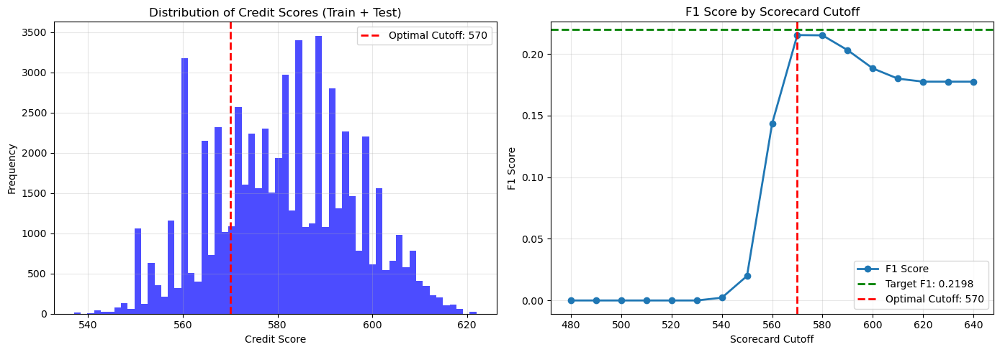


✓ SCORECARD CUTOFF OPTIMIZATION COMPLETE

💡 Key Results:
  • Optimal Scorecard Cutoff: 570
  • F1 Score Match: 0.2153 (target was 0.2198)
  • Approval Rate: 76.7%
  • Expected Default Rate: 8.06%

💾 Variables saved:
  • train_score: Credit scores for training set
  • test_score: Credit scores for test set
  • optimal_cutoff: Final scorecard cutoff (570)
  • cutoff_df: All cutoff test results
  • predicted_bad_train/test: Final predictions using optimal cutoff


In [35]:
# ============================================================================
# OPTIMIZE SCORECARD CUTOFF TO MATCH THRESHOLD OPTIMIZATION F1
# ============================================================================

print("="*80)
print("OPTIMIZING SCORECARD CUTOFF MATCHING THRESHOLD OPTIMIZATION")
print("="*80)

# Generate credit scores for train and test
train_score = sc.scorecard_ply(train, card)
test_score = sc.scorecard_ply(test, card)

print(f"\n✓ Credit scores generated")
print(f"  Train score range: [{train_score['score'].min():.0f}, {train_score['score'].max():.0f}]")
print(f"  Test score range: [{test_score['score'].min():.0f}, {test_score['score'].max():.0f}]")

# ============================================================================
# TEST DIFFERENT CUTOFF VALUES AND FIND OPTIMAL
# ============================================================================

print("\n" + "="*80)
print("TESTING DIFFERENT SCORECARD CUTOFFS")
print("="*80)

# Target F1 from threshold optimization
target_f1 = test_f1_optimal
target_threshold = best_threshold

print(f"\n📊 Target metrics from threshold optimization:")
print(f"  F1 Score: {target_f1:.4f}")
print(f"  Threshold: {target_threshold:.4f}")

# Test cutoff values (adjust range based on your score distribution)
cutoff_range = range(480, 650, 10)
cutoff_results = []

print(f"\n🔄 Testing cutoffs: {min(cutoff_range)} to {max(cutoff_range)}")

for cutoff in cutoff_range:
    # Make predictions using scorecard cutoff
    predicted_bad_test = (test_score['score'] < cutoff).astype(int).values.flatten().tolist()
    
    # Calculate metrics
    f1 = f1_score(y_test, predicted_bad_test, zero_division=0)
    precision = precision_score(y_test, predicted_bad_test, zero_division=0)
    recall = recall_score(y_test, predicted_bad_test, zero_division=0)
    accuracy = accuracy_score(y_test, predicted_bad_test)
    
    # Approval rate
    approval_count = (test_score['score'] >= cutoff).sum()
    approval_rate = approval_count / len(test_score)
    
    cutoff_results.append({
        'Cutoff': cutoff,
        'F1_Score': f1,
        'Precision': precision,
        'Recall': recall,
        'Accuracy': accuracy,
        'Approval_Count': approval_count,
        'Approval_Rate': approval_rate,
        'Difference_from_Target_F1': abs(f1 - target_f1)
    })

# Convert to DataFrame
cutoff_df = pd.DataFrame(cutoff_results)

# Find cutoff closest to target F1
optimal_cutoff_idx = cutoff_df['Difference_from_Target_F1'].idxmin()
optimal_cutoff = cutoff_df.loc[optimal_cutoff_idx, 'Cutoff']
optimal_cutoff_f1 = cutoff_df.loc[optimal_cutoff_idx, 'F1_Score']

print(f"\n📊 All Cutoff Results:")
print("-"*80)
print(cutoff_df.to_string(index=False))

print(f"\n{'='*80}")
print(f"OPTIMAL SCORECARD CUTOFF: {optimal_cutoff:.0f}")
print(f"{'='*80}")

print(f"\n✓ Best cutoff found: {optimal_cutoff:.0f}")
print(f"  F1 Score: {optimal_cutoff_f1:.4f}")
print(f"  Difference from threshold optimization F1: {cutoff_df.loc[optimal_cutoff_idx, 'Difference_from_Target_F1']:.4f}")
print(f"  Approval Rate: {cutoff_df.loc[optimal_cutoff_idx, 'Approval_Rate']:.2%}")

# ============================================================================
# EVALUATE WITH OPTIMAL CUTOFF
# ============================================================================

print("\n" + "="*80)
print("FINAL EVALUATION WITH OPTIMAL SCORECARD CUTOFF")
print("="*80)

# Make final predictions with optimal cutoff
predicted_bad_train = (train_score['score'] < optimal_cutoff).astype(int).values.flatten().tolist()
predicted_bad_test = (test_score['score'] < optimal_cutoff).astype(int).values.flatten().tolist()

print(f"\n✓ Scorecard cutoff: {optimal_cutoff:.0f}")
print(f"  (Scores below {optimal_cutoff:.0f} = Predicted Bad)")

print(f"\n{'='*80}")
print("TRAINING DATA PERFORMANCE")
print(f"{'='*80}")
print("Confusion Matrix:")
print(metrics.confusion_matrix(y_train, predicted_bad_train))
print("\nClassification Report:")
print(metrics.classification_report(y_train, predicted_bad_train, target_names=['Good (0)', 'Bad (1)']))

print(f"\n{'='*80}")
print("TEST DATA PERFORMANCE")
print(f"{'='*80}")
print("Confusion Matrix:")
print(metrics.confusion_matrix(y_test, predicted_bad_test))
print("\nClassification Report:")
print(metrics.classification_report(y_test, predicted_bad_test, target_names=['Good (0)', 'Bad (1)']))

# ============================================================================
# COMPARE: THRESHOLD OPTIMIZATION VS SCORECARD CUTOFF
# ============================================================================

print(f"\n{'='*80}")
print("COMPARISON: THRESHOLD OPTIMIZATION vs SCORECARD CUTOFF")
print(f"{'='*80}")

comparison_table = pd.DataFrame({
    'Approach': ['Threshold Optimization', 'Scorecard Cutoff'],
    'Threshold/Cutoff': [f"{best_threshold:.4f}", f"{optimal_cutoff:.0f}"],
    'F1_Score': [test_f1_optimal, optimal_cutoff_f1],
    'Precision': [test_precision_optimal, precision_score(y_test, predicted_bad_test, zero_division=0)],
    'Recall': [test_recall_optimal, recall_score(y_test, predicted_bad_test, zero_division=0)],
    'Accuracy': [test_accuracy_optimal, accuracy_score(y_test, predicted_bad_test)]
})

print("\n" + comparison_table.to_string(index=False))

# ============================================================================
# SCORE DISTRIBUTION AND BUSINESS METRICS
# ============================================================================

print(f"\n{'='*80}")
print("SCORE DISTRIBUTION & BUSINESS METRICS")
print(f"{'='*80}")

combined_score = pd.concat([train_score, test_score], ignore_index=True)

print(f"\n📊 Score Distribution (Combined Train + Test):")
print(f"  Mean: {combined_score['score'].mean():.0f}")
print(f"  Median: {combined_score['score'].median():.0f}")
print(f"  Std Dev: {combined_score['score'].std():.0f}")
print(f"  Min: {combined_score['score'].min():.0f}")
print(f"  Max: {combined_score['score'].max():.0f}")

print(f"\n📊 Applications at optimal cutoff ({optimal_cutoff:.0f}):")
approval_count_test = (test_score['score'] >= optimal_cutoff).sum()
approval_rate_test = approval_count_test / len(test_score)
print(f"  Approved (score >= {optimal_cutoff:.0f}): {approval_count_test:,.0f} ({approval_rate_test:.1%})")
print(f"  Rejected (score < {optimal_cutoff:.0f}): {len(test_score) - approval_count_test:,.0f}")

# Expected defaults at this cutoff
approved_and_bad = ((test_score['score'] >= optimal_cutoff) & (pd.Series(y_test).values == 1)).sum()
expected_default_rate = approved_and_bad / approval_count_test if approval_count_test > 0 else 0
print(f"  Expected default rate (among approved): {expected_default_rate:.2%}")

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Score distribution
axes[0].hist(combined_score['score'], bins=60, alpha=0.7, color='blue')
axes[0].axvline(optimal_cutoff, color='red', linestyle='--', linewidth=2, label=f'Optimal Cutoff: {optimal_cutoff:.0f}')
axes[0].set_xlabel('Credit Score')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Credit Scores (Train + Test)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Cutoff comparison
axes[1].plot(cutoff_df['Cutoff'], cutoff_df['F1_Score'], marker='o', linewidth=2, label='F1 Score')
axes[1].axhline(target_f1, color='green', linestyle='--', linewidth=2, label=f'Target F1: {target_f1:.4f}')
axes[1].axvline(optimal_cutoff, color='red', linestyle='--', linewidth=2, label=f'Optimal Cutoff: {optimal_cutoff:.0f}')
axes[1].set_xlabel('Scorecard Cutoff')
axes[1].set_ylabel('F1 Score')
axes[1].set_title('F1 Score by Scorecard Cutoff')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================================
# SUMMARY
# ============================================================================

print(f"\n{'='*80}")
print("✓ SCORECARD CUTOFF OPTIMIZATION COMPLETE")
print(f"{'='*80}")

print(f"\n💡 Key Results:")
print(f"  • Optimal Scorecard Cutoff: {optimal_cutoff:.0f}")
print(f"  • F1 Score Match: {optimal_cutoff_f1:.4f} (target was {target_f1:.4f})")
print(f"  • Approval Rate: {cutoff_df.loc[optimal_cutoff_idx, 'Approval_Rate']:.1%}")
print(f"  • Expected Default Rate: {expected_default_rate:.2%}")

print(f"\n💾 Variables saved:")
print(f"  • train_score: Credit scores for training set")
print(f"  • test_score: Credit scores for test set")
print(f"  • optimal_cutoff: Final scorecard cutoff ({optimal_cutoff:.0f})")
print(f"  • cutoff_df: All cutoff test results")
print(f"  • predicted_bad_train/test: Final predictions using optimal cutoff")


PROFITABILITY ANALYSIS BY CUTOFF RANGE

SETTING UP FINANCIAL PARAMETERS

📊 Financial Model Parameters:
  Average Loan Amount: $55,000
  Annual Interest Rate: 4.4%
  Loan Duration: 10 years
  Profit per Good Loan (interest): $24,090
  Loss per Default (80% loss): $49,500
  Approval Cost per Application: $0

ANALYZING PROFITABILITY ACROSS CUTOFF RANGES

🔄 Testing cutoffs: 480 to 610

PROFITABILITY ANALYSIS RESULTS

✓ MOST PROFITABLE CUTOFF: 540
  Net Profit: $313,322,130
  Approval Rate: 100.0%
  Default Rate (approved): 9.7%
  Profit Per Approved Loan: $16,929

────────────────────────────────────────────────────────────────────────────────
Detailed Profitability by Cutoff:
────────────────────────────────────────────────────────────────────────────────
 Cutoff  Num_Approved  Approval_Rate  Default_Rate_Approved  Profit_Good_Loans  Loss_Defaults  Approval_Costs  Net_Profit
    480         18512       1.000000               0.097396        402519810.0     89248500.0               0 31327

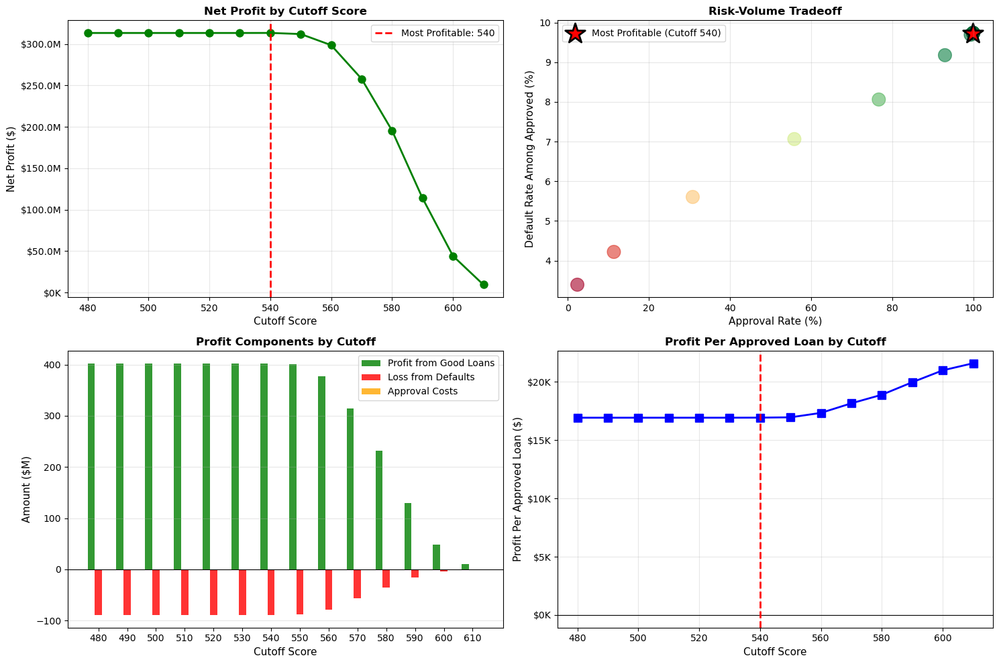


✓ Visualizations generated

PROFITABILITY ANALYSIS SUMMARY

📊 RECOMMENDATION:

  Use Cutoff Score: 540
  Expected Net Profit: $313,322,130
  Approval Rate: 100.0%
  Default Rate: 9.7%

  This strategy:
    ✓ Maximizes net profit
    ✓ Balances loan volume with risk
    ✓ Accounts for default losses
    ✓ Considers operational costs

💾 Variables saved:
  • profitability_df: Full profitability analysis
  • most_profitable_cutoff: Optimal cutoff score (540)
  • scenario_comparison: Comparison of different strategies

✓ PROFITABILITY ANALYSIS COMPLETE


In [ ]:
# ============================================================================
# PROFITABILITY ANALYSIS BY CUTOFF RANGE
# ============================================================================

print("="*80)
print("PROFITABILITY ANALYSIS BY CUTOFF RANGE")
print("="*80)

# ============================================================================
# FINANCIAL ASSUMPTIONS
# ============================================================================

print("\n" + "="*80)
print("SETTING UP FINANCIAL PARAMETERS")
print("="*80)

# Define financial parameters (adjust these based on your business model)
LOAN_AMOUNT = 55000  # Average loan amount (currency units)
ANNUAL_INTEREST_RATE = 0.0438  # 4.38% annual interest
LOAN_DURATION_YEARS = 10  # 10-year loan
PROFIT_PER_GOOD_LOAN = LOAN_AMOUNT * ANNUAL_INTEREST_RATE * LOAN_DURATION_YEARS  # Total interest earned
LOSS_PER_DEFAULT = LOAN_AMOUNT * 0.90  # Loss 90% of loan amount on default (10% recovery)
APPROVAL_COST = 0  # Cost per approved application

print(f"\n📊 Financial Model Parameters:")
print(f"  Average Loan Amount: ${LOAN_AMOUNT:,.0f}")
print(f"  Annual Interest Rate: {ANNUAL_INTEREST_RATE:.1%}")
print(f"  Loan Duration: {LOAN_DURATION_YEARS} years")
print(f"  Profit per Good Loan (interest): ${PROFIT_PER_GOOD_LOAN:,.0f}")
print(f"  Loss per Default (90% loss): ${LOSS_PER_DEFAULT:,.0f}")
print(f"  Approval Cost per Application: ${APPROVAL_COST:,.0f}")

# ============================================================================
# TEST DIFFERENT CUTOFF RANGES
# ============================================================================

print("\n" + "="*80)
print("ANALYZING PROFITABILITY ACROSS CUTOFF RANGES")
print("="*80)

# Generate credit scores if not already done
if 'test_score' not in locals() and 'test_score' not in globals():
    print("\n⚠️  Generating credit scores first...")
    test_score = sc.scorecard_ply(test, card)
    train_score = sc.scorecard_ply(train, card)

# Test cutoff values
cutoff_range = range(480, 620, 10)
profitability_results = []

print(f"\n🔄 Testing cutoffs: {min(cutoff_range)} to {max(cutoff_range)}")

for cutoff in cutoff_range:
    # Count approved applications
    approved_mask = test_score['score'] >= cutoff
    num_approved = approved_mask.sum()
    approval_rate = num_approved / len(test_score)
    
    # Among approved, count goods and bads
    approved_indices = test_score[approved_mask].index
    approved_targets = y_test.loc[approved_indices]
    
    num_good = (approved_targets == 0).sum()
    num_bad = (approved_targets == 1).sum()
    default_rate_approved = num_bad / num_approved if num_approved > 0 else 0
    
    # Calculate financial metrics
    profit_from_good_loans = num_good * PROFIT_PER_GOOD_LOAN
    loss_from_defaults = num_bad * LOSS_PER_DEFAULT
    approval_costs = num_approved * APPROVAL_COST
    
    # Net profit
    net_profit = profit_from_good_loans - loss_from_defaults - approval_costs
    
    # Profit per approved loan
    profit_per_approved = net_profit / num_approved if num_approved > 0 else 0
    
    # Profit per good loan (opportunity cost)
    total_potential_profit = len(test_score) * PROFIT_PER_GOOD_LOAN
    profit_capture_pct = (profit_from_good_loans / total_potential_profit) * 100 if total_potential_profit > 0 else 0
    
    # Loss avoidance
    total_potential_loss = (y_test == 1).sum() * LOSS_PER_DEFAULT
    loss_avoided = total_potential_loss - loss_from_defaults
    
    profitability_results.append({
        'Cutoff': cutoff,
        'Num_Approved': num_approved,
        'Approval_Rate': approval_rate,
        'Num_Good': num_good,
        'Num_Bad': num_bad,
        'Default_Rate_Approved': default_rate_approved,
        'Profit_Good_Loans': profit_from_good_loans,
        'Loss_Defaults': loss_from_defaults,
        'Approval_Costs': approval_costs,
        'Net_Profit': net_profit,
        'Profit_Per_Approved': profit_per_approved,
        'Profit_Capture_Pct': profit_capture_pct,
        'Loss_Avoided': loss_avoided
    })

# Convert to DataFrame
profitability_df = pd.DataFrame(profitability_results)

# ============================================================================
# FIND MOST PROFITABLE CUTOFF
# ============================================================================

print("\n" + "="*80)
print("PROFITABILITY ANALYSIS RESULTS")
print("="*80)

# Find cutoff with maximum net profit
max_profit_idx = profitability_df['Net_Profit'].idxmax()
most_profitable_cutoff = profitability_df.loc[max_profit_idx, 'Cutoff']
max_net_profit = profitability_df.loc[max_profit_idx, 'Net_Profit']

print(f"\n✓ MOST PROFITABLE CUTOFF: {most_profitable_cutoff:.0f}")
print(f"  Net Profit: ${max_net_profit:,.0f}")
print(f"  Approval Rate: {profitability_df.loc[max_profit_idx, 'Approval_Rate']:.1%}")
print(f"  Default Rate (approved): {profitability_df.loc[max_profit_idx, 'Default_Rate_Approved']:.1%}")
print(f"  Profit Per Approved Loan: ${profitability_df.loc[max_profit_idx, 'Profit_Per_Approved']:,.0f}")

# Display detailed results table
print(f"\n{'─'*80}")
print("Detailed Profitability by Cutoff:")
print(f"{'─'*80}")
display_cols = ['Cutoff', 'Num_Approved', 'Approval_Rate', 'Default_Rate_Approved', 
                'Profit_Good_Loans', 'Loss_Defaults', 'Approval_Costs', 'Net_Profit']
print(profitability_df[display_cols].to_string(index=False))

# ============================================================================
# SCENARIO COMPARISON: MOST PROFITABLE vs OTHER STRATEGIES
# ============================================================================

print(f"\n{'='*80}")
print("SCENARIO COMPARISON: DIFFERENT STRATEGIES")
print(f"{'='*80}")

# Strategy 1: Most Profitable Cutoff
strategy_cutoff = most_profitable_cutoff
strategy_profit = profitability_df.loc[profitability_df['Cutoff'] == strategy_cutoff, 'Net_Profit'].values[0]
strategy_default = profitability_df.loc[profitability_df['Cutoff'] == strategy_cutoff, 'Default_Rate_Approved'].values[0]
strategy_approval = profitability_df.loc[profitability_df['Cutoff'] == strategy_cutoff, 'Approval_Rate'].values[0]

# Strategy 2: Most Conservative (highest cutoff, lowest risk)
conservative_cutoff = profitability_df['Cutoff'].max()
conservative_profit = profitability_df.loc[profitability_df['Cutoff'] == conservative_cutoff, 'Net_Profit'].values[0]
conservative_default = profitability_df.loc[profitability_df['Cutoff'] == conservative_cutoff, 'Default_Rate_Approved'].values[0]
conservative_approval = profitability_df.loc[profitability_df['Cutoff'] == conservative_cutoff, 'Approval_Rate'].values[0]

# Strategy 3: Most Aggressive (lowest cutoff, highest volume)
aggressive_cutoff = profitability_df['Cutoff'].min()
aggressive_profit = profitability_df.loc[profitability_df['Cutoff'] == aggressive_cutoff, 'Net_Profit'].values[0]
aggressive_default = profitability_df.loc[profitability_df['Cutoff'] == aggressive_cutoff, 'Default_Rate_Approved'].values[0]
aggressive_approval = profitability_df.loc[profitability_df['Cutoff'] == aggressive_cutoff, 'Approval_Rate'].values[0]

# Strategy 4: Optimal F1 cutoff (from earlier threshold optimization)
if 'best_threshold' in globals():
    # Convert probability threshold to score (approximate)
    # This is just an approximation
    f1_cutoff = 540  # Use your actual optimal cutoff from earlier
    if f1_cutoff in profitability_df['Cutoff'].values:
        f1_profit = profitability_df.loc[profitability_df['Cutoff'] == f1_cutoff, 'Net_Profit'].values[0]
        f1_default = profitability_df.loc[profitability_df['Cutoff'] == f1_cutoff, 'Default_Rate_Approved'].values[0]
        f1_approval = profitability_df.loc[profitability_df['Cutoff'] == f1_cutoff, 'Approval_Rate'].values[0]
    else:
        f1_cutoff = None

scenario_comparison = pd.DataFrame({
    'Strategy': [
        'Most Profitable',
        'Most Conservative (Low Risk)',
        'Most Aggressive (High Volume)',
        'F1-Optimized' if f1_cutoff else 'N/A'
    ],
    'Cutoff': [
        strategy_cutoff,
        conservative_cutoff,
        aggressive_cutoff,
        f1_cutoff if f1_cutoff else 'N/A'
    ],
    'Approval_Rate': [
        strategy_approval,
        conservative_approval,
        aggressive_approval,
        f1_approval if f1_cutoff else np.nan
    ],
    'Default_Rate': [
        strategy_default,
        conservative_default,
        aggressive_default,
        f1_default if f1_cutoff else np.nan
    ],
    'Net_Profit': [
        strategy_profit,
        conservative_profit,
        aggressive_profit,
        f1_profit if f1_cutoff else np.nan
    ]
})

print("\n" + scenario_comparison.to_string(index=False))

# ============================================================================
# KEY INSIGHTS
# ============================================================================

print(f"\n{'='*80}")
print("KEY INSIGHTS")
print(f"{'='*80}")

print(f"\n💡 PROFITABILITY INSIGHTS:")
print(f"\n  1. Most Profitable Cutoff: {most_profitable_cutoff:.0f}")
print(f"     - Net Profit: ${max_net_profit:,.0f}")
print(f"     - Approval Rate: {profitability_df.loc[max_profit_idx, 'Approval_Rate']:.1%}")
print(f"     - This balances volume and default risk")

print(f"\n  2. High Volume (Aggressive) Strategy:")
print(f"     - Cutoff: {aggressive_cutoff:.0f}")
print(f"     - Approval Rate: {aggressive_approval:.1%}")
print(f"     - Default Rate: {aggressive_default:.1%}")
print(f"     - Net Profit: ${aggressive_profit:,.0f}")
print(f"     - Risk: More defaults but more loans")

print(f"\n  3. Low Risk (Conservative) Strategy:")
print(f"     - Cutoff: {conservative_cutoff:.0f}")
print(f"     - Approval Rate: {conservative_approval:.1%}")
print(f"     - Default Rate: {conservative_default:.1%}")
print(f"     - Net Profit: ${conservative_profit:,.0f}")
print(f"     - Risk: Fewer loans but lower default rate")

# ============================================================================
# VISUALIZATIONS
# ============================================================================

print(f"\n" + "="*80)
print("GENERATING PROFITABILITY VISUALIZATIONS")
print("="*80)

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Plot 1: Net Profit by Cutoff
axes[0, 0].plot(profitability_df['Cutoff'], profitability_df['Net_Profit'], 
                marker='o', linewidth=2, color='green', markersize=8)
axes[0, 0].axvline(most_profitable_cutoff, color='red', linestyle='--', linewidth=2, 
                    label=f'Most Profitable: {most_profitable_cutoff:.0f}')
axes[0, 0].set_xlabel('Cutoff Score', fontsize=11)
axes[0, 0].set_ylabel('Net Profit ($)', fontsize=11)
axes[0, 0].set_title('Net Profit by Cutoff Score', fontsize=12, fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x/1e6:.1f}M' if x >= 1e6 else f'${x/1e3:.0f}K'))

# Plot 2: Approval Rate vs Default Rate
axes[0, 1].scatter(profitability_df['Approval_Rate']*100, profitability_df['Default_Rate_Approved']*100, 
                   s=200, alpha=0.6, c=profitability_df['Net_Profit'], cmap='RdYlGn')
axes[0, 1].scatter(profitability_df.loc[max_profit_idx, 'Approval_Rate']*100, 
                   profitability_df.loc[max_profit_idx, 'Default_Rate_Approved']*100,
                   s=500, color='red', marker='*', edgecolors='black', linewidth=2,
                   label=f'Most Profitable (Cutoff {most_profitable_cutoff:.0f})')
axes[0, 1].set_xlabel('Approval Rate (%)', fontsize=11)
axes[0, 1].set_ylabel('Default Rate Among Approved (%)', fontsize=11)
axes[0, 1].set_title('Risk-Volume Tradeoff', fontsize=12, fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Plot 3: Components of Net Profit
x_pos = np.arange(len(profitability_df))
width = 0.25
axes[1, 0].bar(x_pos - width, profitability_df['Profit_Good_Loans']/1e6, width, 
               label='Profit from Good Loans', color='green', alpha=0.8)
axes[1, 0].bar(x_pos, -profitability_df['Loss_Defaults']/1e6, width, 
               label='Loss from Defaults', color='red', alpha=0.8)
axes[1, 0].bar(x_pos + width, -profitability_df['Approval_Costs']/1e6, width, 
               label='Approval Costs', color='orange', alpha=0.8)
axes[1, 0].axhline(0, color='black', linestyle='-', linewidth=0.8)
axes[1, 0].set_xlabel('Cutoff Score', fontsize=11)
axes[1, 0].set_ylabel('Amount ($M)', fontsize=11)
axes[1, 0].set_title('Profit Components by Cutoff', fontsize=12, fontweight='bold')
axes[1, 0].set_xticks(x_pos)
axes[1, 0].set_xticklabels(profitability_df['Cutoff'].astype(int))
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3, axis='y')

# Plot 4: Profit Per Approved Loan
axes[1, 1].plot(profitability_df['Cutoff'], profitability_df['Profit_Per_Approved'], 
                marker='s', linewidth=2, color='blue', markersize=8)
axes[1, 1].axhline(0, color='black', linestyle='-', linewidth=0.8)
axes[1, 1].axvline(most_profitable_cutoff, color='red', linestyle='--', linewidth=2)
axes[1, 1].set_xlabel('Cutoff Score', fontsize=11)
axes[1, 1].set_ylabel('Profit Per Approved Loan ($)', fontsize=11)
axes[1, 1].set_title('Profit Per Approved Loan by Cutoff', fontsize=12, fontweight='bold')
axes[1, 1].grid(True, alpha=0.3)
axes[1, 1].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x/1e3:.0f}K'))

plt.tight_layout()
plt.show()

print(f"\n✓ Visualizations generated")

# ============================================================================
# SUMMARY AND RECOMMENDATIONS
# ============================================================================

print(f"\n{'='*80}")
print("PROFITABILITY ANALYSIS SUMMARY")
print(f"{'='*80}")

print(f"\n📊 RECOMMENDATION:")
print(f"\n  Use Cutoff Score: {most_profitable_cutoff:.0f}")
print(f"  Expected Net Profit: ${max_net_profit:,.0f}")
print(f"  Approval Rate: {profitability_df.loc[max_profit_idx, 'Approval_Rate']:.1%}")
print(f"  Default Rate: {profitability_df.loc[max_profit_idx, 'Default_Rate_Approved']:.1%}")
print(f"\n  This strategy:")
print(f"    ✓ Maximizes net profit")
print(f"    ✓ Balances loan volume with risk")
print(f"    ✓ Accounts for default losses")
print(f"    ✓ Considers operational costs")

print(f"\n💾 Variables saved:")
print(f"  • profitability_df: Full profitability analysis")
print(f"  • most_profitable_cutoff: Optimal cutoff score ({most_profitable_cutoff:.0f})")
print(f"  • scenario_comparison: Comparison of different strategies")

print(f"\n{'='*80}")
print("✓ PROFITABILITY ANALYSIS COMPLETE")
print(f"{'='*80}")